Author: **Ammar Waddah**

# Importing necessary dependencies

In [ ]:
# dataframe handling
import pandas as pd
# visualising libraries
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from tabulate import tabulate
# handling numerical data
import numpy as np
import math
# data transformer and preprocessing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import QuantileTransformer, MinMaxScaler, StandardScaler, RobustScaler
# ensamble learning models
from sklearn.tree import ExtraTreeRegressor
# neighbors
from sklearn.neighbors import KNeighborsClassifier, NearestNeighbors
# pca
from sklearn.decomposition import PCA
# clustering algorithms
from sklearn.cluster import KMeans, MiniBatchKMeans, DBSCAN, AgglomerativeClustering, Birch, MeanShift, AffinityPropagation, SpectralClustering
# gaussian clustering
from sklearn.mixture import GaussianMixture 
# dealing with models data
from sklearn.model_selection import StratifiedShuffleSplit, GridSearchCV
# compute metrics
from scipy.stats import zscore
from sklearn.metrics import mean_squared_error, accuracy_score
# clusteres metrics
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics import silhouette_score
from yellowbrick.cluster import SilhouetteVisualizer, KElbowVisualizer

# Loading data

In [ ]:
# load csv data into a data frame
path = "/content/CC GENERAL.csv"
fetched_data = pd.read_csv(path)

**About the dataset**\
`CUST_ID` Identification of Credit Card holder (Categorical).\
`BALANCE` Balance amount left in their account to make purchases.\
`BALANCE_FREQUENCY` How frequently the Balance is updated, score between 0 and 1 (1 = frequently updated, 0 = not frequently updated).\
`PURCHASES` Amount of purchases made from account.\
`ONEOFF_PURCHASES` Maximum purchase amount done in one-go.\
`INSTALLMENTS_PURCHASES` Amount of purchase done in installment.\
`CASH_ADVANCE` Cash in advance given by the user.\
`PURCHASES_FREQUENCY` How frequently the Purchases are being made, score between 0 and 1 (1 = frequently purchased, 0 = not frequently purchased).\
`ONEOFFPURCHASESFREQUENCY` How frequently Purchases are happening in one-go (1 = frequently purchased, 0 = not frequently purchased).\
`PURCHASESINSTALLMENTSFREQUENCY` How frequently purchases in installments are being done (1 = frequently done, 0 = not frequently done).\
`CASHADVANCEFREQUENCY` How frequently the cash in advance being paid.\
`CASHADVANCETRX` Number of Transactions made with "Cash in Advanced".\
`PURCHASES_TRX` Numbe of purchase transactions made.\
`CREDIT_LIMIT` Limit of Credit Card for user.\
`PAYMENTS` Amount of Payment done by user.\
`MINIMUM_PAYMENTS` Minimum amount of payments made by user.\
`PRCFULLPAYMENT` Percent of full payment paid by user.\
`TENURE` Tenure of credit card service for user.

# Explore the dataset

## Shapes with simple start

In [ ]:
# check the first 5 rows
fetched_data.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


In [ ]:
# check the last 5 rows
fetched_data.tail()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
8945,C19186,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.50,6
8946,C19187,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,NaN,0.00,6
8947,C19188,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.25,6
8948,C19189,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.25,6
8949,C19190,372.708075,0.666667,1093.25,1093.25,0.00,127.040008,0.666667,0.666667,0.000000,0.333333,2,23,1200.0,63.165404,88.288956,0.00,6


In [ ]:
# check the size (examples, and features)
fetched_data.shape

(8950, 18)

In [ ]:
# get simple informative insights
fetched_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

**Discussion Stage**
* There are *no* **categorical** features so we don't have to deal with it.

In [ ]:
# get better simple informative insights
fetched_data.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8949.000000,8950.000000,8637.000000,8950.000000,8950.000000
mean,1564.474828,0.877271,1003.204834,592.437371,411.067645,978.871112,0.490351,0.202458,0.364437,0.135144,3.248827,14.709832,4494.449450,1733.143852,864.206542,0.153715,11.517318
std,2081.531879,0.236904,2136.634782,1659.887917,904.338115,2097.163877,0.401371,0.298336,0.397448,0.200121,6.824647,24.857649,3638.815725,2895.063757,2372.446607,0.292499,1.338331
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
25%,128.281915,0.888889,39.635000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.276166,169.123707,0.000000,12.000000
50%,873.385231,1.000000,361.280000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,856.901546,312.343947,0.000000,12.000000
75%,2054.140036,1.000000,1110.130000,577.405000,468.637500,1113.821139,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.134317,825.485459,0.142857,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


**Discussion Stage**
* Based on the percentile values of each feature in the dataset, it seems that the values of the features `CASH_ADVANCE_TRX`, `PURCHASES_TRX`, and `TENURE` probably not continuous, and I will decide it after some EDA process.

*There are some missing values in `CREDIT_LIMIT` and `MINIMUM_PAYMENTS` features.

* Distributions of some of the features are heavily skewed (`ONEOFF_PURCHASES`, `INSTALLMENTS_PURCHASES`, `CASH_ADVANCz`, `CASH_ADVANCE_TRX`, and `PURCHASES_TRX`), and they need further analysis.

In [ ]:
# check null values
fetched_data.isnull().sum()

CUST_ID                               0
BALANCE                               0
BALANCE_FREQUENCY                     0
PURCHASES                             0
ONEOFF_PURCHASES                      0
INSTALLMENTS_PURCHASES                0
CASH_ADVANCE                          0
PURCHASES_FREQUENCY                   0
ONEOFF_PURCHASES_FREQUENCY            0
PURCHASES_INSTALLMENTS_FREQUENCY      0
CASH_ADVANCE_FREQUENCY                0
CASH_ADVANCE_TRX                      0
PURCHASES_TRX                         0
CREDIT_LIMIT                          1
PAYMENTS                              0
MINIMUM_PAYMENTS                    313
PRC_FULL_PAYMENT                      0
TENURE                                0
dtype: int64

In [ ]:
# check duplicated values
fetched_data.duplicated().sum()

0

**Discussion Stage**
* There are *some* missing values in `MINIMUM_PYMENTS`, we will deal with it later.
* There are *no* duplicated values.

## Initial data cleaning (During an EDA step)

**Discussion Step**
* During the last stage of EDA with the explanation of the dataset, we see that **CUST_ID** column is a numerical column describes the identification of Credit Card holder.

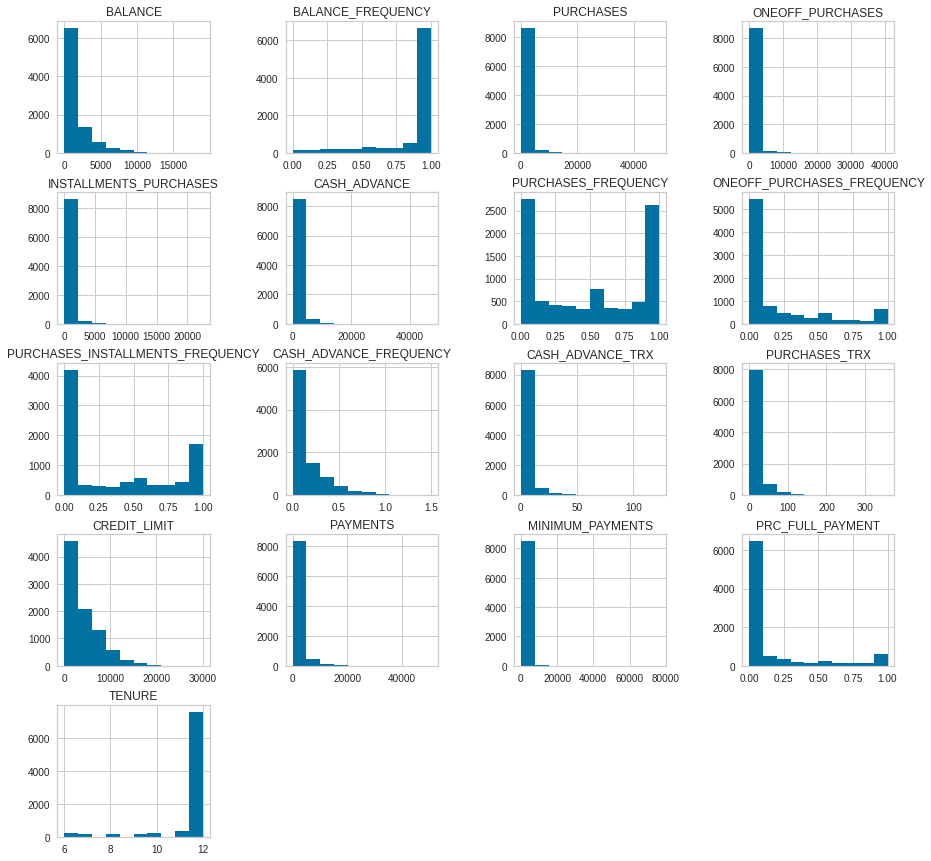

In [ ]:
# a histogram plot that represents the ranges of each feature and how many values between each bin
fetched_data._get_numeric_data().hist(figsize=(15, 15))
plt.subplots_adjust(wspace=0.5, hspace=0.3)
plt.show()

In [ ]:
# drop unnecessary columns in the dataset
eda_clean_data = fetched_data.drop("CUST_ID", axis= 1)
# check the data size
eda_clean_data.shape

(8950, 17)

In [ ]:
# check null values
eda_clean_data.isnull().sum()

BALANCE                               0
BALANCE_FREQUENCY                     0
PURCHASES                             0
ONEOFF_PURCHASES                      0
INSTALLMENTS_PURCHASES                0
CASH_ADVANCE                          0
PURCHASES_FREQUENCY                   0
ONEOFF_PURCHASES_FREQUENCY            0
PURCHASES_INSTALLMENTS_FREQUENCY      0
CASH_ADVANCE_FREQUENCY                0
CASH_ADVANCE_TRX                      0
PURCHASES_TRX                         0
CREDIT_LIMIT                          1
PAYMENTS                              0
MINIMUM_PAYMENTS                    313
PRC_FULL_PAYMENT                      0
TENURE                                0
dtype: int64

In [ ]:
# check the ratio of the missing data
print(f'''
The ratio of missing value related to the full data\n
{(eda_clean_data.isnull().sum() / eda_clean_data.shape[0])* 100}
''')


The ratio of missing value related to the full data

BALANCE                             0.000000
BALANCE_FREQUENCY                   0.000000
PURCHASES                           0.000000
ONEOFF_PURCHASES                    0.000000
INSTALLMENTS_PURCHASES              0.000000
CASH_ADVANCE                        0.000000
PURCHASES_FREQUENCY                 0.000000
ONEOFF_PURCHASES_FREQUENCY          0.000000
PURCHASES_INSTALLMENTS_FREQUENCY    0.000000
CASH_ADVANCE_FREQUENCY              0.000000
CASH_ADVANCE_TRX                    0.000000
PURCHASES_TRX                       0.000000
CREDIT_LIMIT                        0.011173
PAYMENTS                            0.000000
MINIMUM_PAYMENTS                    3.497207
PRC_FULL_PAYMENT                    0.000000
TENURE                              0.000000
dtype: float64



**More check about `missing values`**

In [ ]:
# create a condition variable, including features that having missing data.
condition = ["CREDIT_LIMIT", "MINIMUM_PAYMENTS"]
# check the statistical information about these features.
eda_clean_data[condition].describe()

,CREDIT_LIMIT,MINIMUM_PAYMENTS
count,8949.000000,8637.000000
mean,4494.449450,864.206542
std,3638.815725,2372.446607
min,50.000000,0.019163
25%,1600.000000,169.123707
50%,3000.000000,312.343947
75%,6500.000000,825.485459
max,30000.000000,76406.207520


**Now check the effect of each value on the other feature**

In [ ]:
# check the first condition effect on the dataset.
eda_clean_data[eda_clean_data[condition[0]].isnull()]

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
5203,18.400472,0.166667,0.0,0.0,0.0,186.853063,0.0,0.0,0.0,0.166667,1,0,NaN,9.040017,14.418723,0.0,6


**Discussion Stage**
* Removing the sample will not have any effect on the modeling process. Also, the number of samples is relatively high.

In [ ]:
# remove missing values from the column CREDIT_LIMIT.
eda_cls_missed = eda_clean_data.dropna(subset= ['CREDIT_LIMIT']).copy(deep=True)

In [ ]:
# check the second condition effect on the dataset.
eda_cls_missed[eda_cls_missed[condition[1]].isnull()]

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
3,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.0,12
45,2242.311686,1.000000,437.00,97.00,340.0,184.648692,0.333333,0.083333,0.333333,0.166667,2,5,2400.0,0.000000,NaN,0.0,12
47,3910.111237,1.000000,0.00,0.00,0.0,1980.873201,0.000000,0.000000,0.000000,0.500000,7,0,4200.0,0.000000,NaN,0.0,12
54,6.660517,0.636364,310.00,0.00,310.0,0.000000,0.666667,0.000000,0.666667,0.000000,0,8,1000.0,417.016763,NaN,0.0,12
55,1311.995984,1.000000,1283.90,1283.90,0.0,0.000000,0.250000,0.250000,0.000000,0.000000,0,6,6000.0,0.000000,NaN,0.0,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8919,14.524779,0.333333,152.00,152.00,0.0,0.000000,0.333333,0.333333,0.000000,0.000000,0,2,1500.0,0.000000,NaN,0.0,6
8929,371.527312,0.333333,0.00,0.00,0.0,1465.407927,0.000000,0.000000,0.000000,0.166667,5,0,1500.0,0.000000,NaN,0.0,6
8935,183.817004,1.000000,465.90,0.00,465.9,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1500.0,0.000000,NaN,0.0,6
8944,193.571722,0.833333,1012.73,1012.73,0.0,0.000000,0.333333,0.333333,0.000000,0.000000,0,2,4000.0,0.000000,NaN,0.0,6


**Discussion Stage**
* Here we can notice that all the values in `PRC_FULL_PAYMENT` column are equal to zero when the `MINIMUM_PAYMENTS` is equal to NaN.
* From the *count* plot,  we can notice that there are high values in this region.

In [ ]:
# check statistical info about missing values.
eda_cls_missed[eda_cls_missed[condition[1]].notnull()][condition[1]].agg(['min', 'max', 'mean', 'median', 'std', 'var'])

min       1.916300e-02
max       7.640621e+04
mean      8.643049e+02
median    3.124523e+02
std       2.372566e+03
var       5.629071e+06
Name: MINIMUM_PAYMENTS, dtype: float64

**Discussion Stage**
* By the results of *STD* and *mean*, the values of the feature `MINIMUM_PAYMENTS` are varied, and they cannot be imputed using *univariate imputation* techniques.

**Check the correlation with other columns to check if we can impute using it**

In [ ]:
eda_cls_missed.corr()["MINIMUM_PAYMENTS"].sort_values(ascending = False)

MINIMUM_PAYMENTS                    1.000000
BALANCE                             0.398669
CASH_ADVANCE                        0.140094
BALANCE_FREQUENCY                   0.132519
INSTALLMENTS_PURCHASES              0.132156
CREDIT_LIMIT                        0.126671
PAYMENTS                            0.126630
CASH_ADVANCE_TRX                    0.109727
CASH_ADVANCE_FREQUENCY              0.098844
PURCHASES_TRX                       0.096311
PURCHASES                           0.093842
TENURE                              0.059330
ONEOFF_PURCHASES                    0.048741
PURCHASES_INSTALLMENTS_FREQUENCY    0.030036
PURCHASES_FREQUENCY                 0.002979
ONEOFF_PURCHASES_FREQUENCY         -0.030357
PRC_FULL_PAYMENT                   -0.140404
Name: MINIMUM_PAYMENTS, dtype: float64

**Discussion Stage**
* Regarding the correlation coefficients of features with `MINIMUM_PAYMENTS`, it is not highly correlated with any of the features and simple imputation techniques cannot yield satisfying results.

* So as a conclusion from the analysis of these features, rows with missing values are being removed from the dataset.

In [ ]:
# remove a missed value from the column MINIMUM_PAYMENTS
eda_cls_missed = eda_cls_missed.dropna(subset= ['MINIMUM_PAYMENTS'])

###Dealing with missing values

**Determine null values**

In [ ]:
# determine null values:
dfNullVals = eda_cls_missed.isnull().sum().to_frame()
dfNullVals = dfNullVals.rename(columns = {0:'Null'})
# determine not null values:
dfNotNullVals = eda_cls_missed.notna().sum().to_frame()
dfNotNullVals = dfNotNullVals.rename(columns = {0:'Not Null'})
# combine dataframes:
dfNullCount = pd.concat([dfNullVals, dfNotNullVals], ignore_index=False, axis=1).reset_index()
dfNullCount = dfNullCount.rename(columns = {'index':'Category'})
# generate Plot
fig = px.bar(dfNullCount, x="Category", y = ['Not Null', 'Null'])
fig.update_xaxes(categoryorder='total descending')
fig.update_layout(
    title={'text':"Null Values Visualization",
           'xanchor':'center',
           'yanchor':'top',
           'x':0.5},
    xaxis_title = "Category",
    yaxis_title = "Count")
fig.update_layout(legend_title_text = 'Status')
fig.show()

**Discussion Stage**
* Comparing the tables above, after removing the rows with missing values, none of the statistics changed significantly considering their values before cleaning the data.

In [ ]:
# check duplicated values.
eda_cls_missed.duplicated().sum()

0

**Discussion Stage**
* There are *no* duplicated values.

In [ ]:
# final data after imputed.
clean_data= eda_cls_missed.reset_index(drop = True)

In [ ]:
# for later use in clustering dataframe using kmeans
eda_cls_missed_df = clean_data.copy(deep = True)

In [ ]:
# recheck null values.
clean_data.isnull().sum()

BALANCE                             0
BALANCE_FREQUENCY                   0
PURCHASES                           0
ONEOFF_PURCHASES                    0
INSTALLMENTS_PURCHASES              0
CASH_ADVANCE                        0
PURCHASES_FREQUENCY                 0
ONEOFF_PURCHASES_FREQUENCY          0
PURCHASES_INSTALLMENTS_FREQUENCY    0
CASH_ADVANCE_FREQUENCY              0
CASH_ADVANCE_TRX                    0
PURCHASES_TRX                       0
CREDIT_LIMIT                        0
PAYMENTS                            0
MINIMUM_PAYMENTS                    0
PRC_FULL_PAYMENT                    0
TENURE                              0
dtype: int64

### Check the count of some features

In [ ]:
print(f'''
The count values of CASH_ADVANCE_TRX feature:
{clean_data['CASH_ADVANCE_TRX'].value_counts()}
#####################################################
The count values of PURCHASES_TRX feature:
{clean_data['PURCHASES_TRX'].value_counts()}
#####################################################
The count values of TENURE feature:
{clean_data['TENURE'].value_counts()}
''')


The count values of CASH_ADVANCE_TRX feature:
0      4431
1       839
2       602
3       429
4       374
       ... 
39        1
56        1
107       1
53        1
41        1
Name: CASH_ADVANCE_TRX, Length: 65, dtype: int64
#####################################################
The count values of PURCHASES_TRX feature:
0      1967
1       606
12      537
2       345
6       340
       ... 
171       1
168       1
232       1
148       1
186       1
Name: PURCHASES_TRX, Length: 173, dtype: int64
#####################################################
The count values of TENURE feature:
12    7346
11     356
10     226
6      184
8      183
7      177
9      164
Name: TENURE, dtype: int64



In [ ]:
# get better simple informative insights
clean_data.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000
mean,1601.224893,0.895035,1025.433874,604.901438,420.843533,994.175523,0.496000,0.205909,0.368820,0.137604,3.313918,15.033233,4522.091030,1784.478099,864.304943,0.159304,11.534391
std,2095.571300,0.207697,2167.107984,1684.307803,917.245182,2121.458303,0.401273,0.300054,0.398093,0.201791,6.912506,25.180468,3659.240379,2909.810090,2372.566350,0.296271,1.310984
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.049513,0.019163,0.000000,6.000000
25%,148.095189,0.909091,43.367500,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,418.559237,169.163545,0.000000,12.000000
50%,916.855459,1.000000,375.405000,44.995000,94.785000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,896.675701,312.452292,0.000000,12.000000
75%,2105.195853,1.000000,1145.980000,599.100000,484.147500,1132.385490,0.916667,0.333333,0.750000,0.250000,4.000000,18.000000,6500.000000,1951.142090,825.496463,0.166667,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


### Check features range

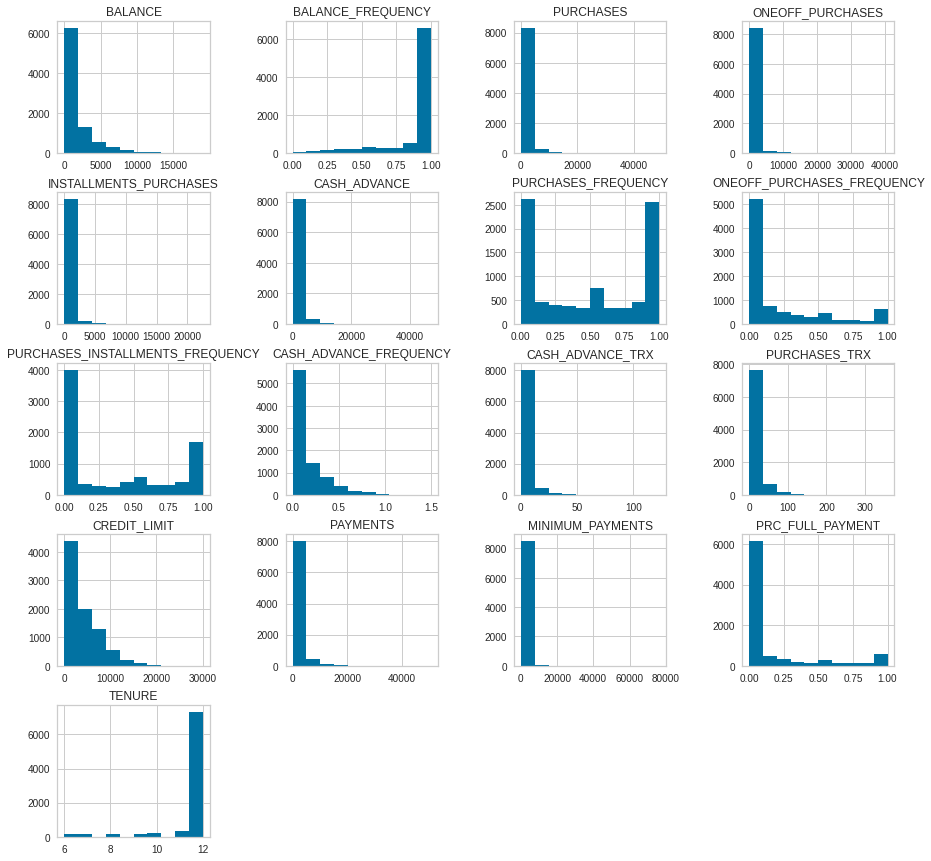

In [ ]:
# A histogram plot that represents the ranges of each feature and how many values between each bin
clean_data._get_numeric_data().hist(figsize=(15, 15))
plt.subplots_adjust(wspace=0.5, hspace=0.3)
plt.show()

**Discussion Stage**
* The distribution of the features are variants are not either linear nor uniform and had not normal distribution, most of it took skewed distribution.

### Check correlation and peak some insights

In [ ]:
# # plot pairplot with the hue of Class target
# sns.pairplot(eda_clean_data._get_numeric_data())
# plt.show()

**Discussion Stage**
* Because of the large number of features, there are better ways to visualize it.

### Check correlation using heatmap

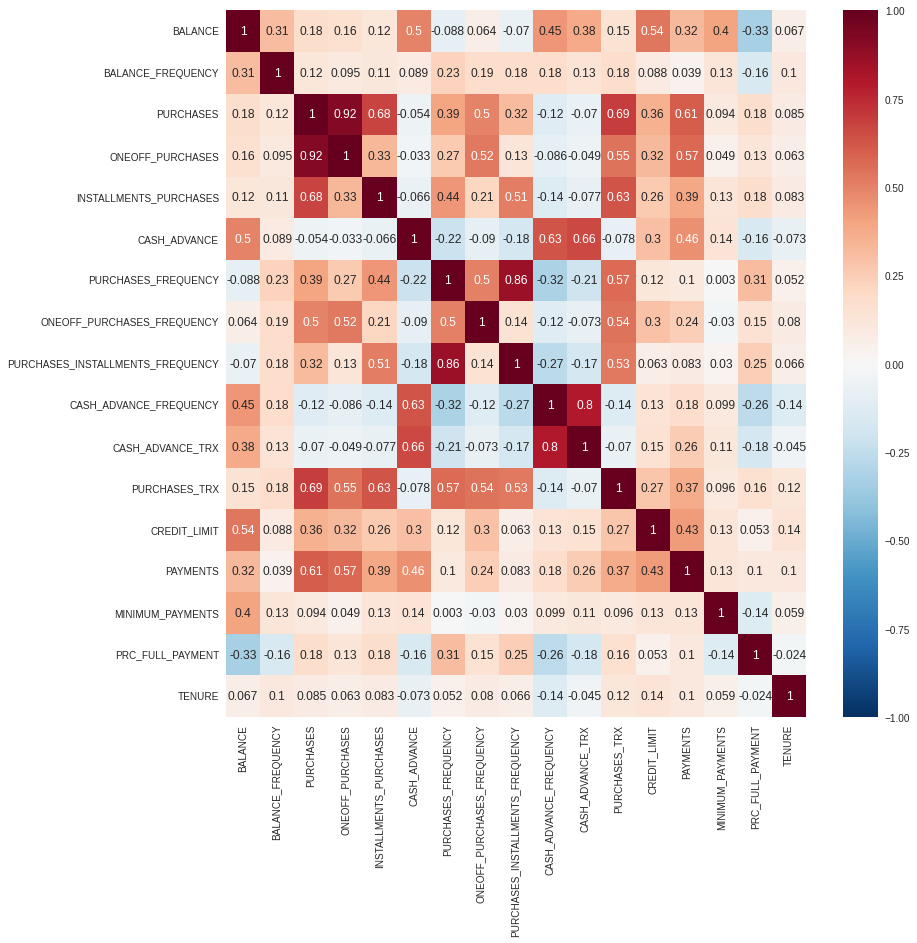

In [ ]:
# create the blank figure
plt.figure(figsize= (13, 13))
# plot heatmap between data features (numerical data)
sns.heatmap(clean_data.corr(), vmin = -1, vmax = 1, annot=True, cmap='RdBu_r')
plt.show()

**Discussion Stage**
* Features have not very correlated level between each other.

### Check outliers

In [ ]:
def box_plot(features, data):
    '''
    Plot boxes describe and determine the outliers in features.
    Args:
    features-- list of features we want to study their outliers.
    data-- dataframe that we want to deal with.
    Returns:
    A plot describes outliers in features
    '''
    # create the blank figure
    plt.figure(figsize=(30, 30))
    for index, element in enumerate(features):
        plt.subplot(int(np.ceil(len(features)/2)),2, index+1)
        # plot lines
        # initialize subplots index values
        sns.boxplot(x= element, data= data)
        plt.title(f"Distribution of {element}")
        # set x and y labels
        plt.xlabel(element)
    # adjust height space
    plt.subplots_adjust(wspace= 0.2, hspace = 0.9)
    return plt.show()

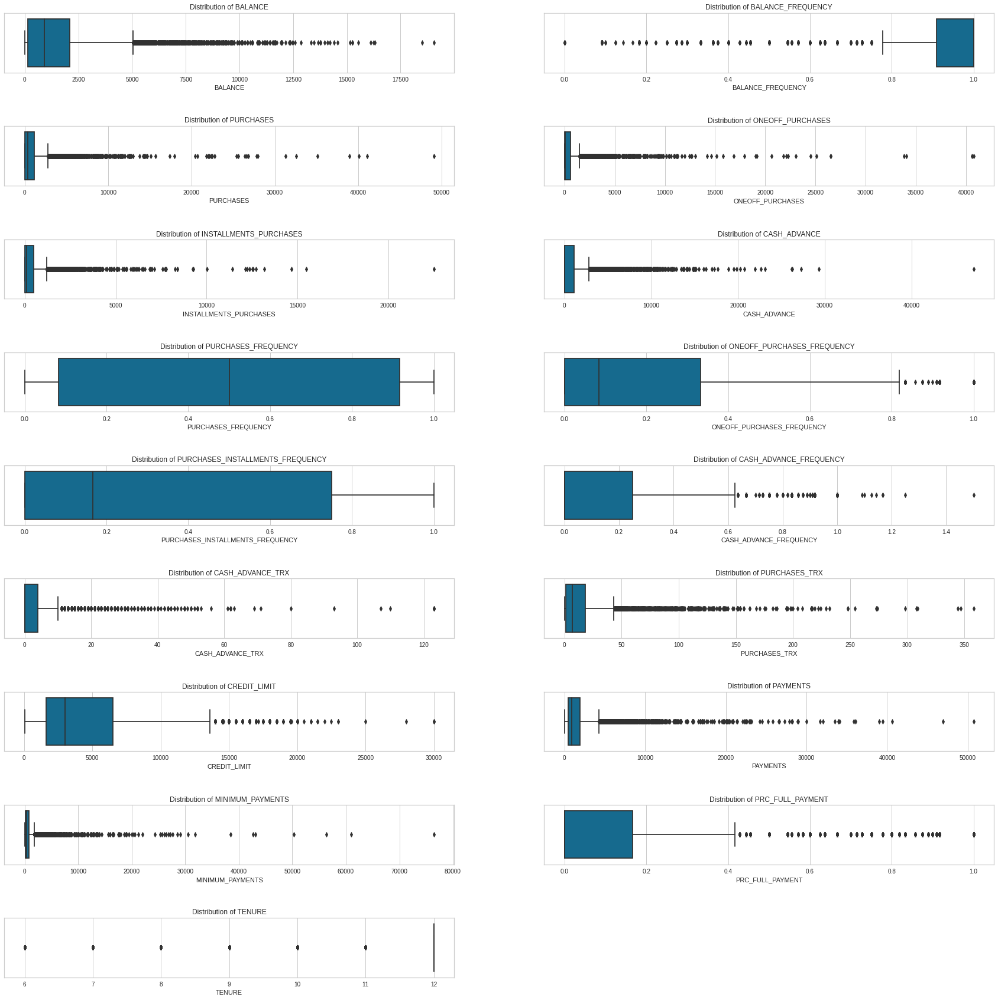


 The shape of train_data is:  (8636, 17)


In [ ]:
# initialize numeric features
features= clean_data._get_numeric_data().columns.to_list()
# check the outliers in features
box_plot(features, clean_data)
# check the data shape
print("\n The shape of train_data is: ", clean_data.shape)

**Discussion Stage**
* There are outliers or unwanted features in most of variables BALANCE, BALANCE_FREQUENCY, PAYMENTS, MINIMUM_PAYMENTS, but in case of avoiding underfit, I will deal with the farther it.

**Check kde plots**

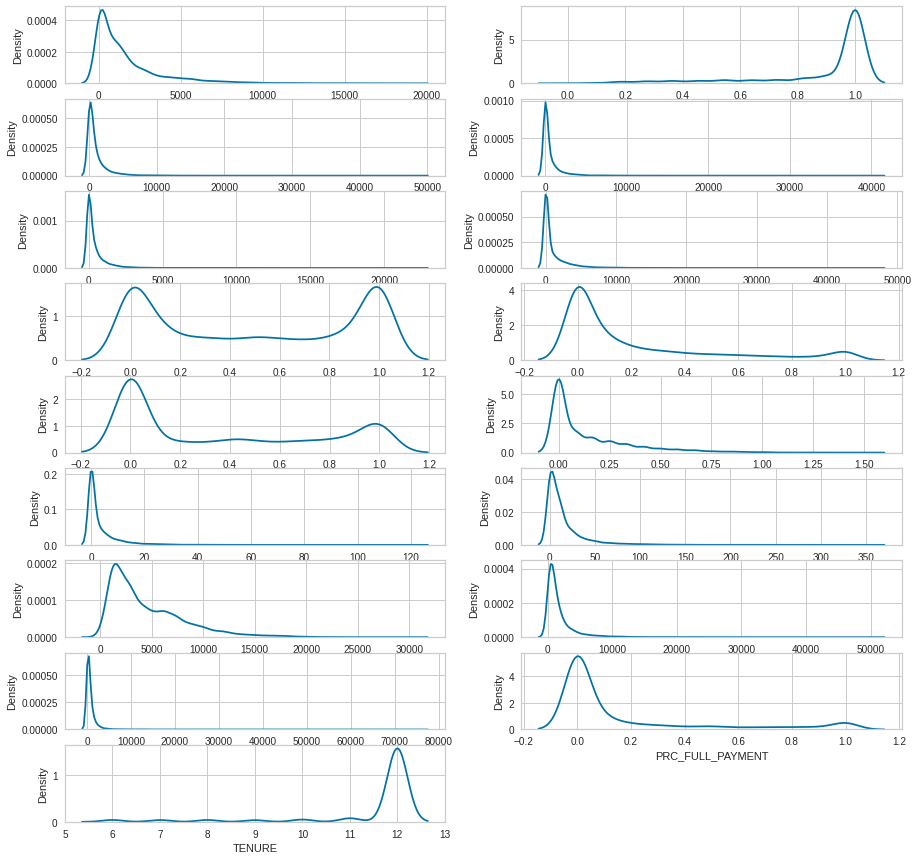

In [ ]:
plt.figure(figsize=(15, 15))
for i, col in enumerate(clean_data.columns):
    if clean_data[col].dtype != 'object':
        ax = plt.subplot(9, 2, i+1)
        sns.kdeplot(clean_data[col], ax=ax)
        plt.xlabel(col)
        
plt.show()

In [ ]:
# convert dataframe columns to log scale
for col in clean_data:
  clean_data[col] = np.log(1 + clean_data[col])

**Convert to z-score**

In [ ]:
clean_data = clean_data.apply(zscore)

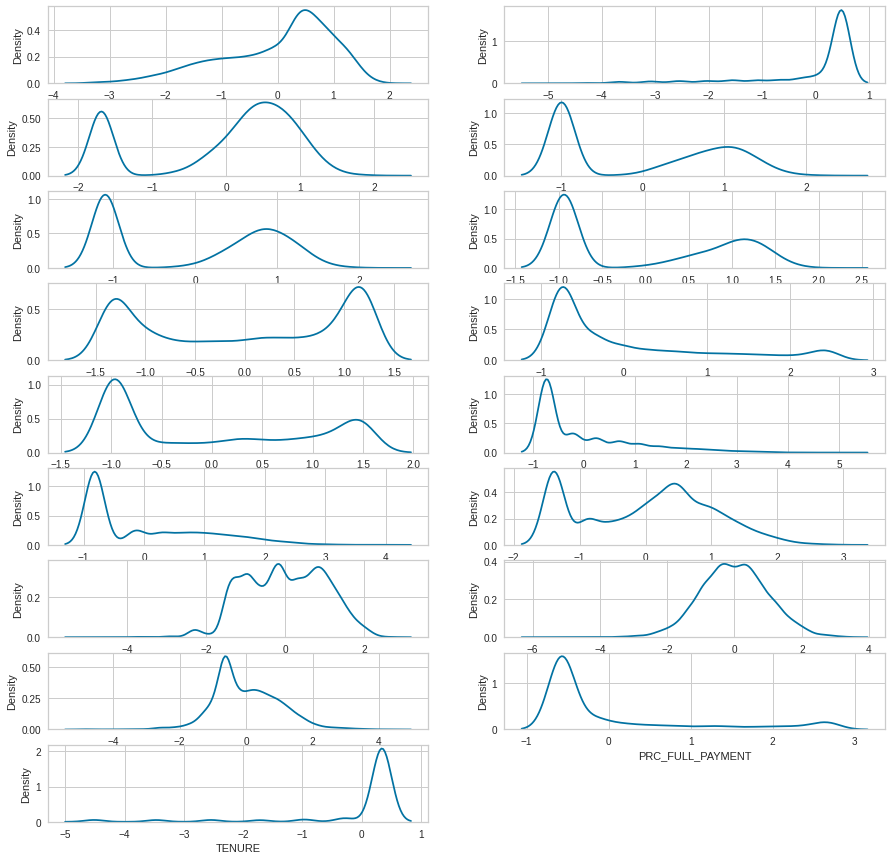

In [ ]:
plt.figure(figsize=(15, 15))
for i, col in enumerate(clean_data.columns):
    if clean_data[col].dtype != 'object':
        ax = plt.subplot(9, 2, i+1)
        sns.kdeplot(clean_data[col], ax=ax)
        plt.xlabel(col)
        
plt.show()

# Preprocess Time

## Deal with outliers

In [ ]:
def determine_outlier_thresholds_iqr(dataframe, col_name, th1=0.25, th3=0.75):
  '''
    Determine outliers using specific thresholds.
    Args:
    dataframe-- data frame that we want to deal with.
    col_name-- data frame column that we want to deal with.
    th1-- threshold-1 of iqr range.
    th2-- threshold-2 of iqr range.
    Returns:
    A plot describes outliers in the a column name.
    '''
  quartile1 = dataframe[col_name].quantile(th1)
  quartile3 = dataframe[col_name].quantile(th3)
  iqr = quartile3 - quartile1
  upper_limit = quartile3 + 1.5 * iqr
  lower_limit = quartile1 - 1.5 * iqr
  return lower_limit, upper_limit

def check_outliers_iqr(dataframe, col_name):
  '''
    Specified outliers using a specific column in the data.
    Args:
    dataframe-- data frame that we want to deal with.
    col_name-- a data frame column that we want to deal with.
    Returns:
    A boolian description of outliers in the dataframe features.
    '''
  lower_limit, upper_limit = determine_outlier_thresholds_iqr(dataframe, col_name)
  if dataframe[(dataframe[col_name] > upper_limit) | (dataframe[col_name] < lower_limit)].any(axis=None):
      return True
  else: 
      return False

def replace_with_thresholds_iqr(dataframe, cols, th1=0.05, th3=0.95, replace=False):
  '''
  Replace outliers with iqt thresholds.
  Args:
  dataframe-- data frame that we want to deal with.
  col- a data frame column that we want to deal with.
  th1-- threshold-1 of iqr replace range.
  th2-- threshold-2 of iqr replace range.
  replace- boolian describe the statue of outliers replacing.
  Returns:
  A clean data frame without outliers in its features.
  '''
  data = []
  for col_name in cols:
    if col_name != None:
      outliers_ = check_outliers_iqr(dataframe, col_name)
      count = None
      lower_limit, upper_limit = determine_outlier_thresholds_iqr(dataframe, col_name, th1, th3)
      if outliers_:
        count = dataframe[(dataframe[col_name] > upper_limit) | (dataframe[col_name] < lower_limit)][col_name].count()
        if replace: 
            if lower_limit < 0:
                # We don't want to replace with negative values
                dataframe.loc[(dataframe[col_name] > upper_limit), col_name] = upper_limit
            else:
                dataframe.loc[(dataframe[col_name] < lower_limit), col_name] = lower_limit
                dataframe.loc[(dataframe[col_name] > upper_limit), col_name] = upper_limit
        outliers_status = check_outliers_iqr(dataframe, col_name)
        data.append([outliers_, outliers_status, count, col_name, lower_limit, upper_limit ])
  table = tabulate(data, headers=['Outliers (Previously)', 'Outliers', 'Count', 'Column', 'Lower Limit', 'Upper Limit'], tablefmt='rst', numalign='right')
  print("Removing Outliers using IQR")
  print(table)

In [ ]:
# get features from the data
features= clean_data._get_numeric_data().columns.to_list()
# recheck the outliers in features
replace_with_thresholds_iqr(clean_data, features, replace= True)

Removing Outliers using IQR
=======================  ==========  =======  ======================  =============  =============
Outliers (Previously)    Outliers      Count  Column                    Lower Limit    Upper Limit
=======================  ==========  =======  ======================  =============  =============
True                     True              0  BALANCE                      -6.68007        6.05319
True                     True              0  BALANCE_FREQUENCY            -7.10293        5.03705
True                     True              0  CASH_ADVANCE_FREQUENCY       -5.09576        6.54299
True                     True              0  CASH_ADVANCE_TRX             -4.91407        6.01145
True                     True              0  CREDIT_LIMIT                 -5.97937        6.10385
True                     True              0  PAYMENTS                     -6.43815        6.49734
True                     True              0  MINIMUM_PAYMENTS             -5.915

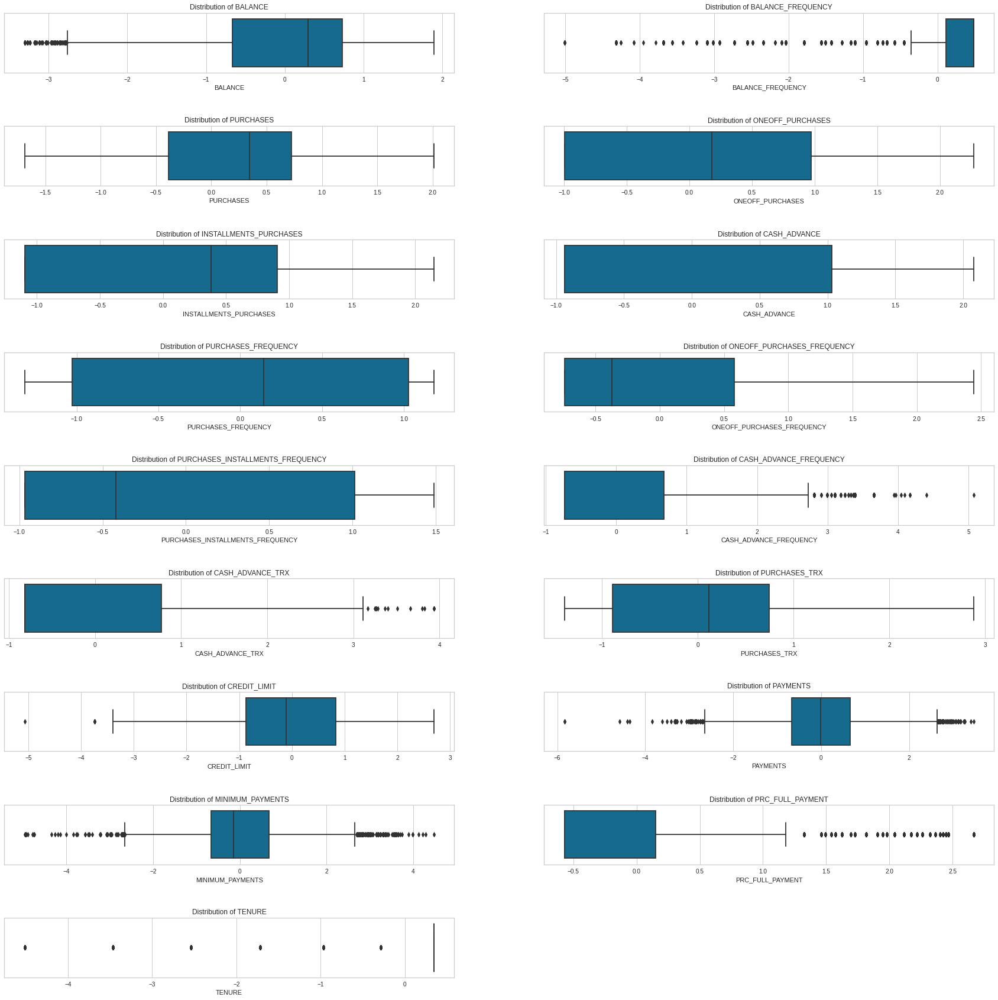


 The shape of train_data is:  (8636, 17)


In [ ]:
# initialize numeric features
features= clean_data._get_numeric_data().columns.to_list()
# check the outliers in features
box_plot(features, clean_data)
# check the data shape
print("\n The shape of train_data is: ", clean_data.shape)

**Discussion Stage**
* Now we can see that there are no outliers any more, and we replace it taking the best threshold as best as possible to avoid information losing.

In [ ]:
# recheck correlation
clean_data_corr = clean_data.corr()
# strip the diagonal for future examination
for x in range(clean_data_corr.shape[0]):
  # clear diagonal line (correlation that equal to 1)
    clean_data_corr.iloc[x, x] = 0.0

clean_data_corr.abs().idxmax()

BALANCE                                             MINIMUM_PAYMENTS
BALANCE_FREQUENCY                                            BALANCE
PURCHASES                                              PURCHASES_TRX
ONEOFF_PURCHASES                          ONEOFF_PURCHASES_FREQUENCY
INSTALLMENTS_PURCHASES              PURCHASES_INSTALLMENTS_FREQUENCY
CASH_ADVANCE                                        CASH_ADVANCE_TRX
PURCHASES_FREQUENCY                                    PURCHASES_TRX
ONEOFF_PURCHASES_FREQUENCY                          ONEOFF_PURCHASES
PURCHASES_INSTALLMENTS_FREQUENCY              INSTALLMENTS_PURCHASES
CASH_ADVANCE_FREQUENCY                              CASH_ADVANCE_TRX
CASH_ADVANCE_TRX                              CASH_ADVANCE_FREQUENCY
PURCHASES_TRX                                    PURCHASES_FREQUENCY
CREDIT_LIMIT                                                PAYMENTS
PAYMENTS                                                CREDIT_LIMIT
MINIMUM_PAYMENTS                  

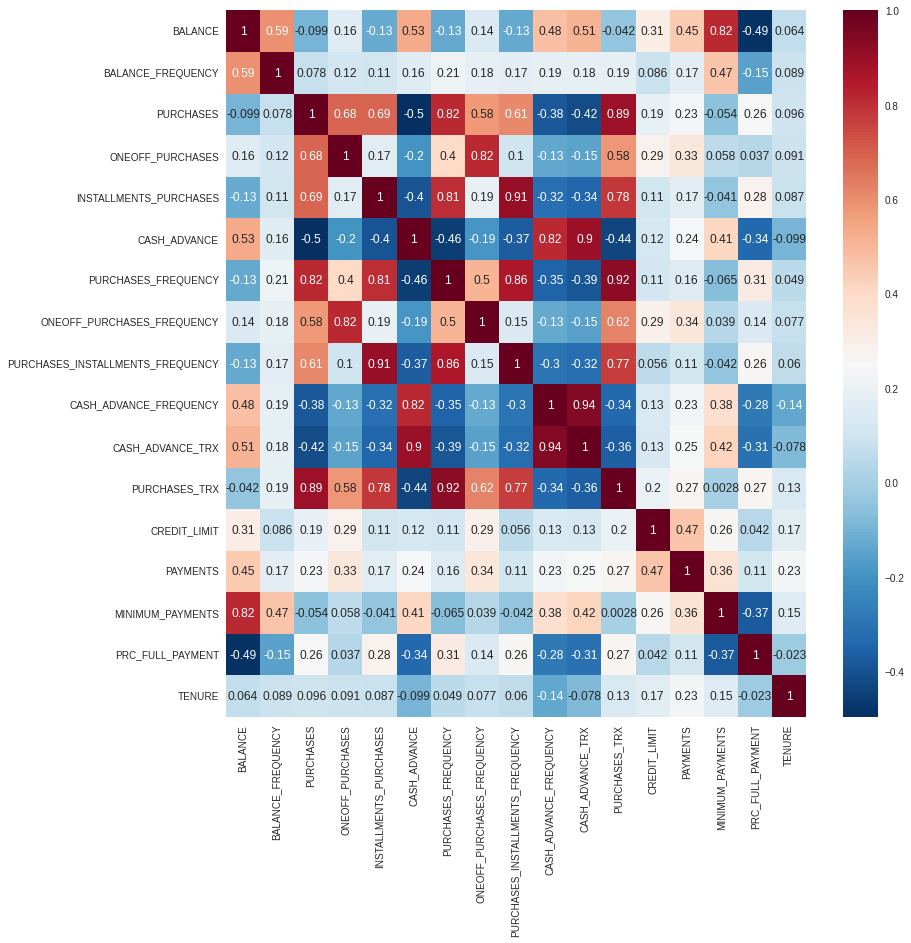

In [ ]:
# create the blank figure
plt.figure(figsize= (13, 13))
# plot heatmap between data features (numerical data)
sns.heatmap(clean_data.corr(), annot=True, cmap='RdBu_r')
plt.show()

**Discussion Stage**
* Here we notice that there are dependences between some features.

# Modeling

**Some functions of modeling scores**

In [ ]:
# visualizing function
def kmeans_visualize_inertia(data, model, k_ranges, model_arg):
  '''
    Visualize inertia of kmeans algorithm.
    Args:
    data-- data frame that we want to deal with.
    model- machine learning model object.
    K_ranges-- tuple defines clusters range.
    model_arg-- dictionary that contains model arguments.
    Returns:
    Plot a visualization of inertia values.
    '''
  inertia_values = []
  for k in range(*k_ranges):
    # scaled_data = StandardScaler().fit_transform(data)
    model_obj = model(n_clusters = k, **kmeans_constants).fit(data)
    inertia_values.append(model_obj.inertia_)

  plt.figure(figsize = (10, 10))
  plt.plot(range(*k_ranges), inertia_values, color = 'r', marker = '*')
  plt.xlabel('Number of Clusters')
  plt.ylabel('Inertia Value')
  plt.title('Kmeans Elbow Graph - Number of Clusters')
  return plt.show()

In [ ]:
# silhouette score visualize function
def kmeans_visualize_silhouette(data, model, k_ranges, model_arg):
  '''
  Visualize silhouette score of kMEANS algorithm.
  Args:
  data-- dataframe that we want to deal with.
  model- Machine Learning model object.
  K_ranges-- tuple defines clusters range.
  model_arg-- dictionary that contains model arguments.
  Returns:
  Plot a visualization of silhouette values.
  '''
  silhoutte_coefs = []
  for k in range(*k_ranges):
    # scaled_data = StandardScaler().fit_transform(data)
    model_obj = model(n_clusters = k, **kmeans_constants).fit(data)
    silhoutte_coefs.append(silhouette_score(data, model_obj.labels_))

  plt.figure(figsize = (12, 8))
  plt.plot(range(*k_ranges), silhoutte_coefs, color = 'r', marker = '*')
  plt.xlabel('Number of Clusters')
  plt.ylabel('Silhoutte Score')
  plt.title('Kmeans Silhouette Score - Number of Clusters')
  return plt.show()

In [ ]:
# scale inputs
# scaled_data = StandardScaler().fit_transform(clean_data)
# scale_obj = RobustScaler()
scale_obj = StandardScaler()
scaled_data = scale_obj.fit_transform(clean_data)

**Discussion Stage**
* I tried standard scaler, Robust scaler to deal with outliers, and Log scale with Min Max scaler, and I found that standard scaler did the best for performance.

## **KMeans**

In [ ]:
# kmeans constants
kmeans_constants = {'init' : 'k-means++', 'n_init': 'auto', 'random_state' : 42}

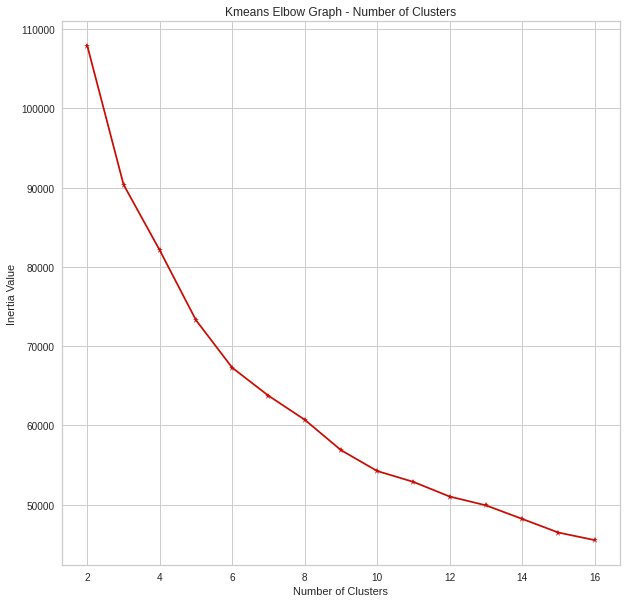

In [ ]:
# visualize inertia of kmeans from 2 to 17 clusters
kmeans_visualize_inertia(scaled_data, KMeans, (2, 17), kmeans_constants)

**Discussion Stage**
* Here we can notice that the best **number of clusters** are **8, 9 or 10** which is the best choice for this dataset.

**Silhoutte score**

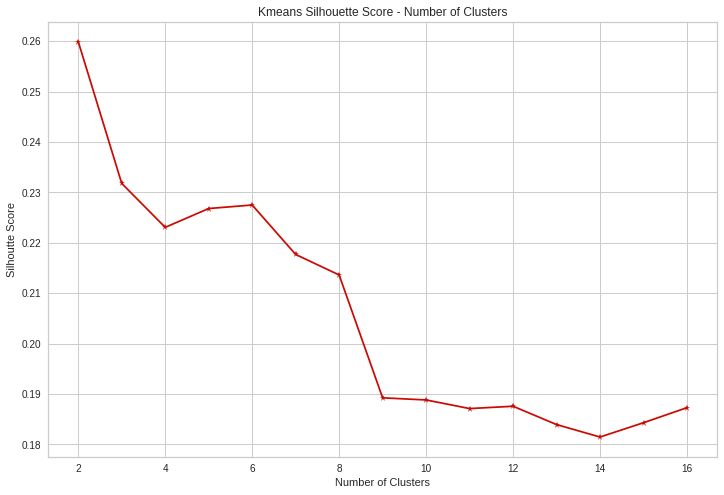

In [ ]:
# visualize silhouette score diagram
kmeans_visualize_silhouette(scaled_data, KMeans, (2, 17), kmeans_constants)

**Discussion Stage**
* Silhouette score showed that **2** clusters are the best choice.

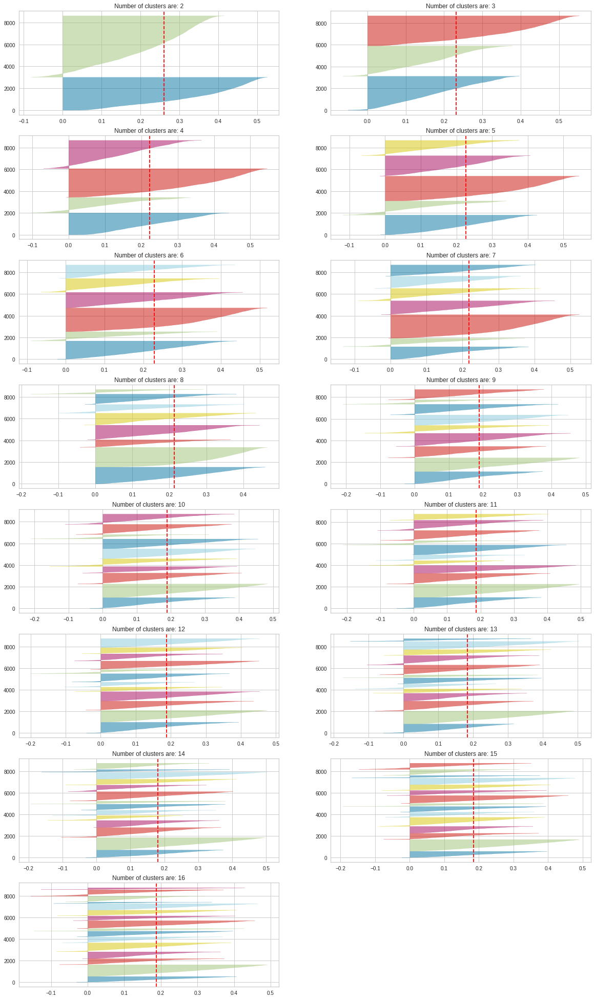

In [ ]:
# instantiate the clustering model and visualizer for a looping process.
plt.figure(figsize=(20,35))
for i in range (2,17):
  ax = plt.subplot(8, 2, i-1)
  model = KMeans(i, **kmeans_constants)
  visualizer = SilhouetteVisualizer(model, colors='yellowbrick', ax= ax)
  # fit the data and visualize it
  visualizer.fit(scaled_data)
  plt.title(f"Number of clusters are: {i}")       
plt.show()

**Discussion Stage**
* Based on Silhouette score, we can notice that **k=2** is the best choice of the number of clusters even when the elbow method defined **k = 8**, **9**, or **10** is the best choice, we can consider **k = 2** or **3** to be the best choice taking the precise of the silhouette score as better that Elbow method.

In [ ]:
# scale the data
# scaler_obj= StandardScaler()
# scaled_data = scaler_obj.fit_transform(clean_data)
# build model
kmeans_obj = KMeans(init = 'k-means++', n_clusters=3, n_init =  'auto', random_state=42)
kmeans_pred = kmeans_obj.fit_predict(scaled_data)

**Discussion Stage**
* For better precise of our results, we have to repeat the process several time taling the visualization into consideration to take the best of it.

In [ ]:
# check centroids and convert it to dataframe
kmeans_centroids = scale_obj.inverse_transform(kmeans_obj.cluster_centers_)
kmeans_centroids = pd.DataFrame(kmeans_centroids, columns = clean_data.columns)
kmeans_centroids

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,0.430533,0.400301,0.805462,0.817721,0.639301,-0.126115,0.821706,0.867231,0.584831,-0.128175,-0.116787,0.921160,0.379371,0.554322,0.370575,-0.014652,0.191384
1,-1.031326,-0.609073,0.241456,-0.315743,0.244797,-0.833481,0.185108,-0.404973,0.238436,-0.677972,-0.752073,0.064161,-0.374025,-0.643325,-0.789999,0.448405,-0.093786
2,0.549887,0.159278,-1.155570,-0.608818,-0.970665,0.981525,-1.117280,-0.575134,-0.902549,0.827390,0.889045,-1.108271,-0.053508,0.019230,0.375004,-0.434574,-0.122481


**Visualize clusters using 2 features**

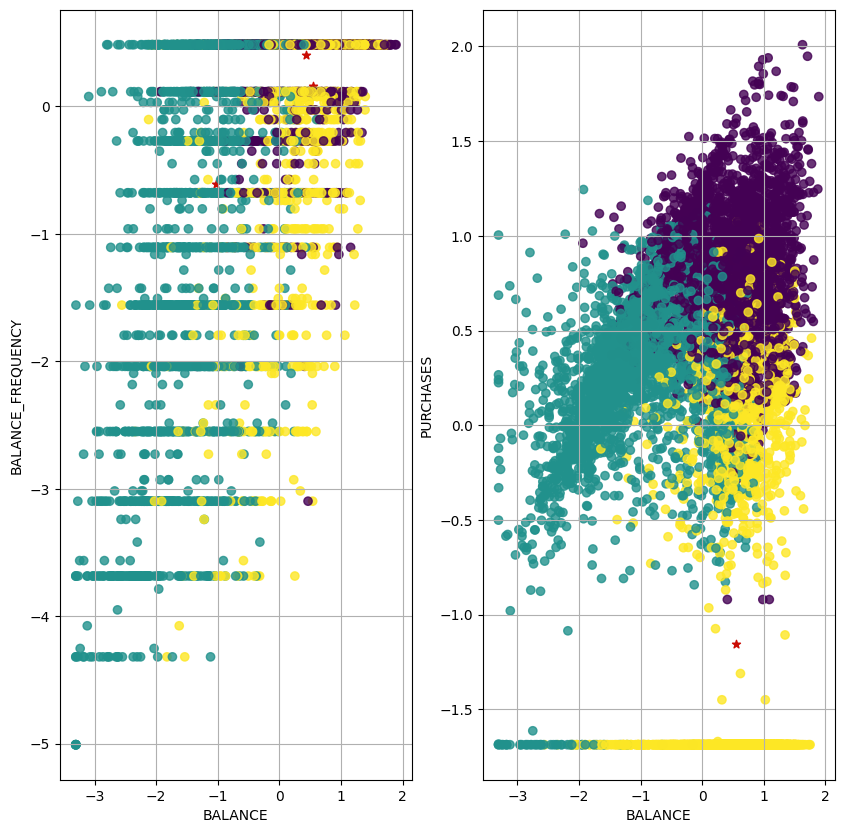

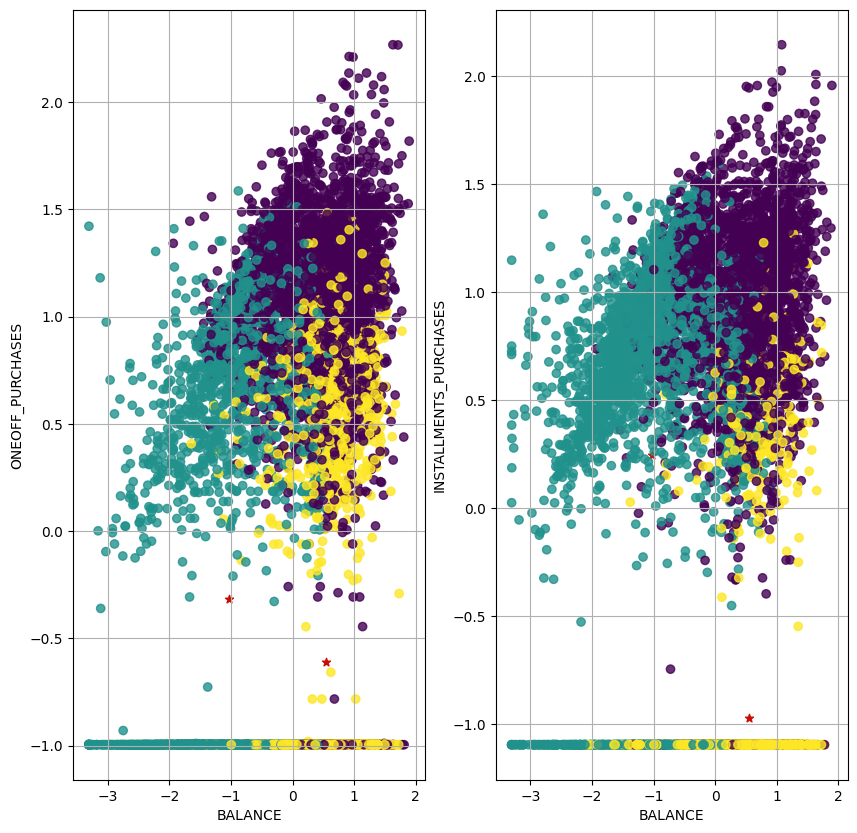

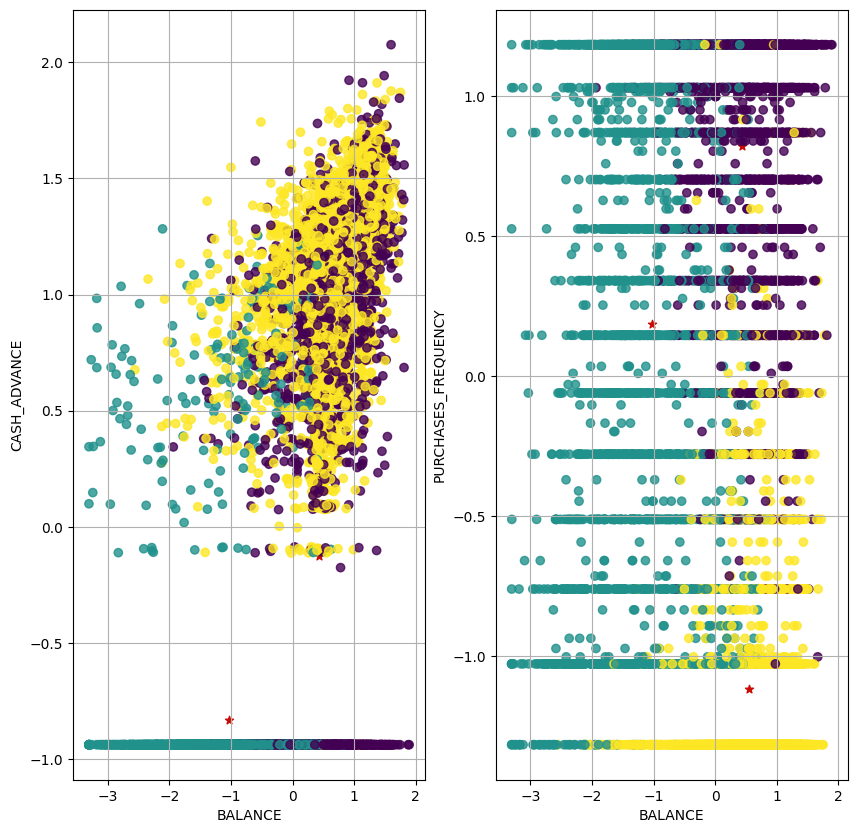

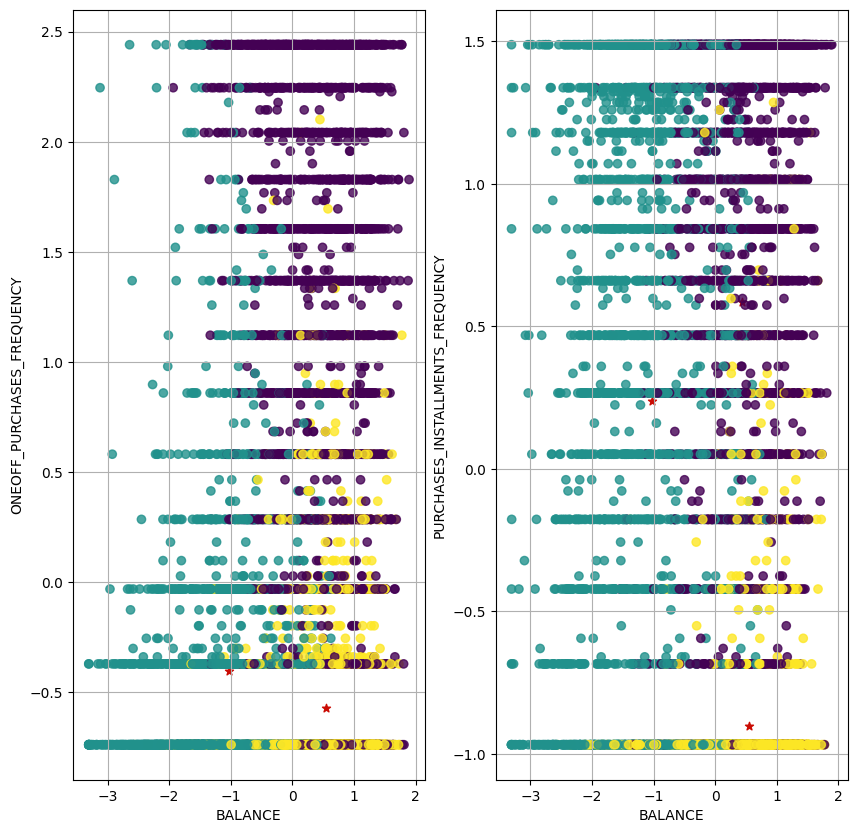

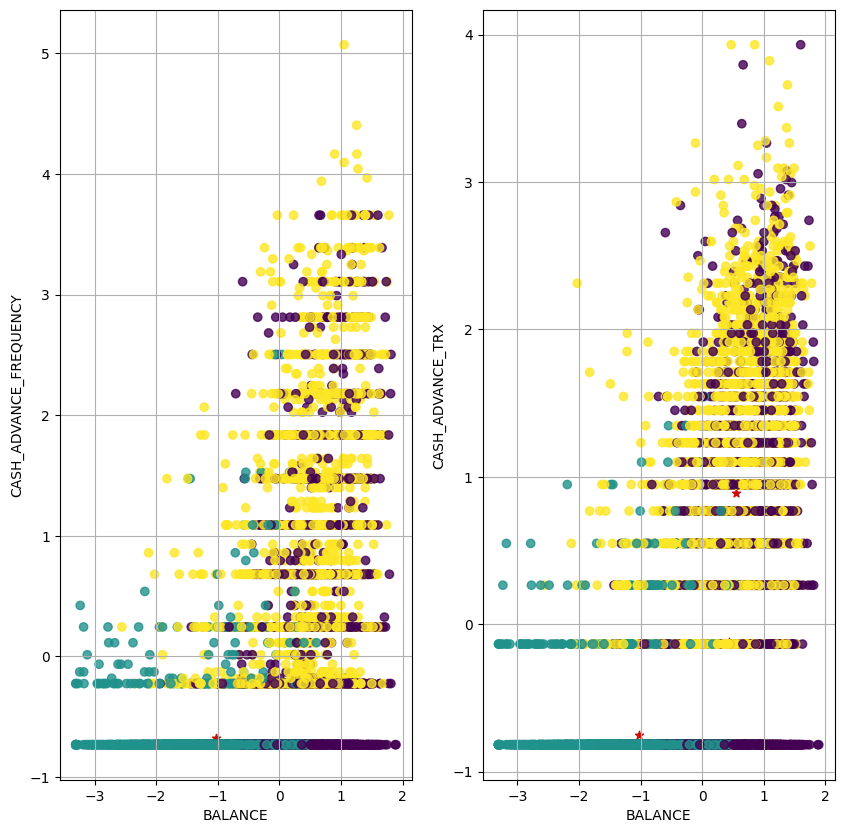

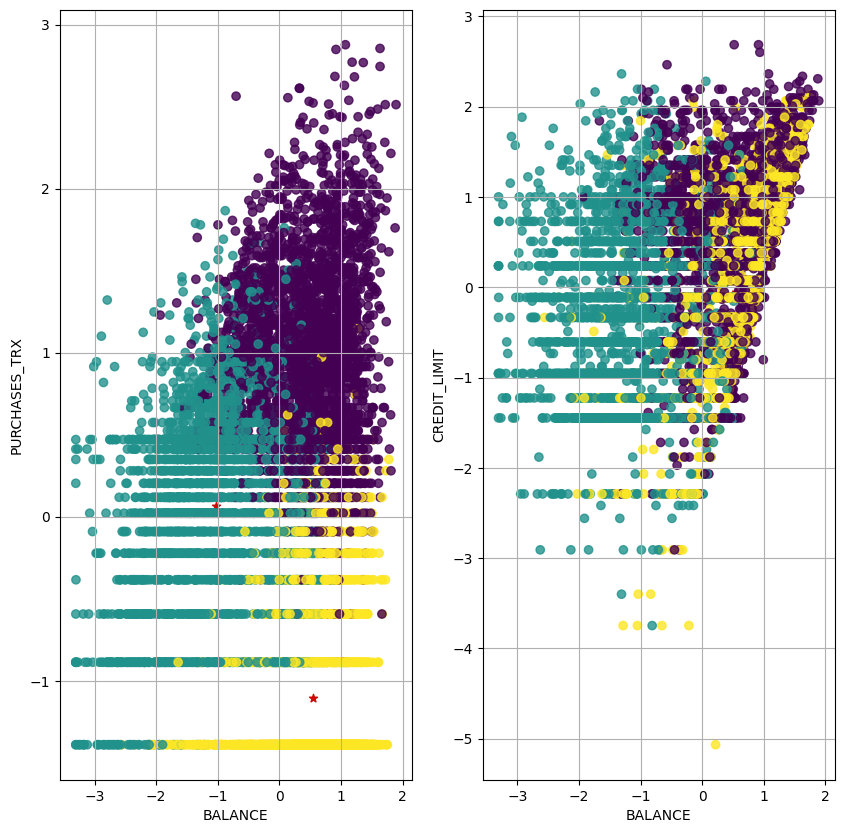

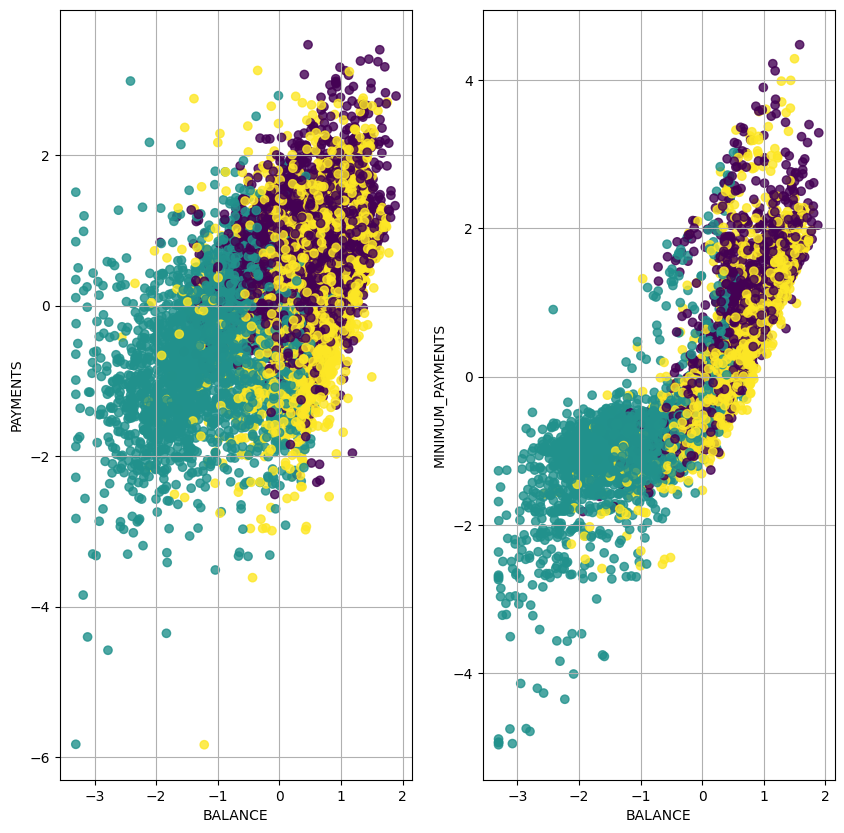

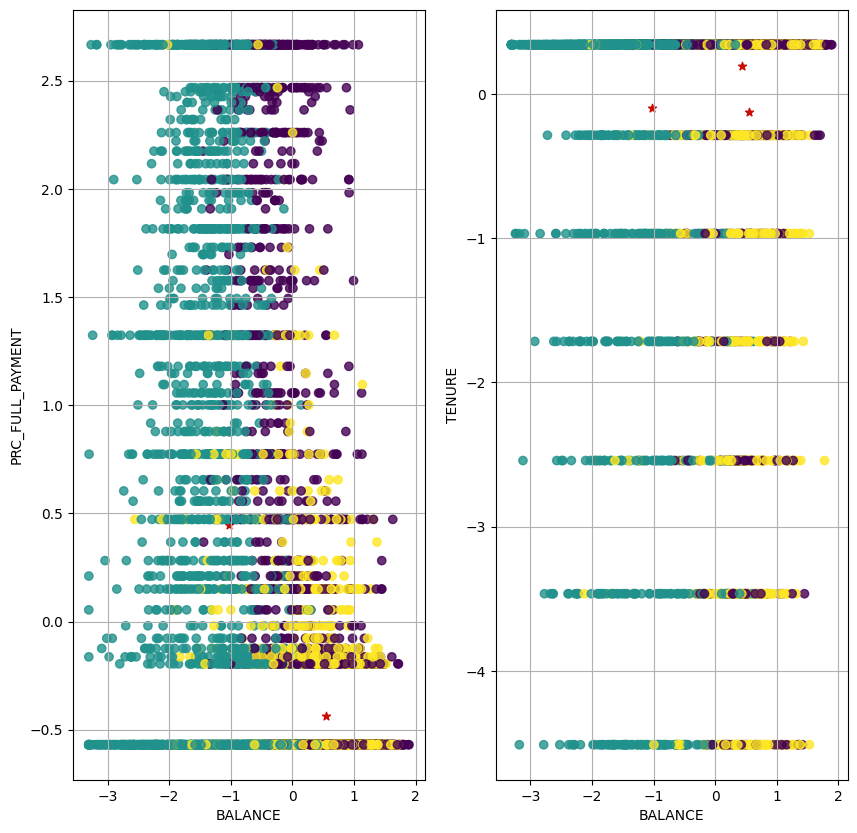

In [ ]:
plt.style.use('default')
i = 1
while i < len(clean_data.columns):
    try:
        fig = plt.figure(figsize = (10, 10))
        plt.subplot(1,2,1)
        plt.scatter(kmeans_centroids['BALANCE'], kmeans_centroids[clean_data.columns[i]], marker = '*', c = 'r')
        plt.scatter(clean_data['BALANCE'], clean_data[clean_data.columns[i]],
                    c = kmeans_obj.labels_.astype(float), alpha = 0.8)
        plt.xlabel('BALANCE')
        plt.ylabel(clean_data.columns[i])
        plt.grid()
        i += 1
        plt.subplot(1,2,2)
        plt.scatter(kmeans_centroids['BALANCE'], kmeans_centroids[clean_data.columns[i]], marker = '*', c = 'r')
        plt.scatter(clean_data['BALANCE'], clean_data[clean_data.columns[i]],
                    c = kmeans_obj.labels_.astype(float), alpha = 0.8)
        plt.xlabel('BALANCE')
        plt.ylabel(clean_data.columns[i])
        plt.grid()
        i += 1
    except IndexError:
        break
plt.show()

**Discusion Stage**
* Here we can see good results when **k = 3** using kmeans algorithm.

In [ ]:
print(f'''
      Inertia : {kmeans_obj.inertia_}
      Silhouette Score : {silhouette_score(scaled_data, kmeans_obj.labels_)}
      ''')


      Inertia : 90392.71493163524
      Silhouette Score : 0.23176588946364757
      


**Discussion Stage**
* We have to repeat the process even in slightly different result with different k clusters (better performance) taking  the silhouette score into consideration.

In [ ]:
# create cluster visualization of kmeans algorithms.
kmeans_clusters= pd.concat([eda_cls_missed_df, pd.DataFrame({'cluster': kmeans_obj.labels_})], axis=1)
kmeans_clusters.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,cluster
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.00,0,2,1000.0,201.802084,139.509787,0.000000,12,1
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.25,4,0,7000.0,4103.032597,1072.340217,0.222222,12,2
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.00,0,12,7500.0,622.066742,627.284787,0.000000,12,0
3,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.00,0,1,1200.0,678.334763,244.791237,0.000000,12,1
4,1809.828751,1.000000,1333.28,0.00,1333.28,0.000000,0.666667,0.000000,0.583333,0.00,0,8,1800.0,1400.057770,2407.246035,0.000000,12,0


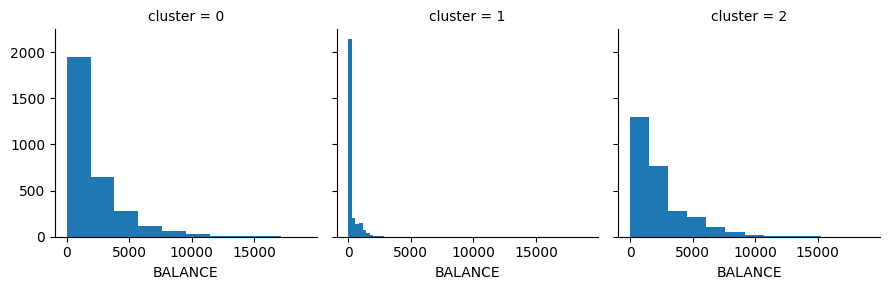

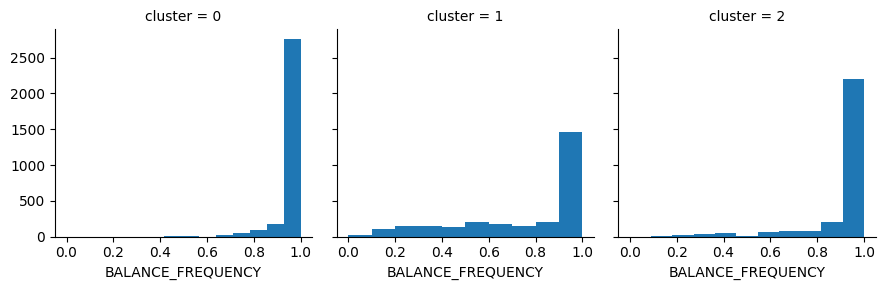

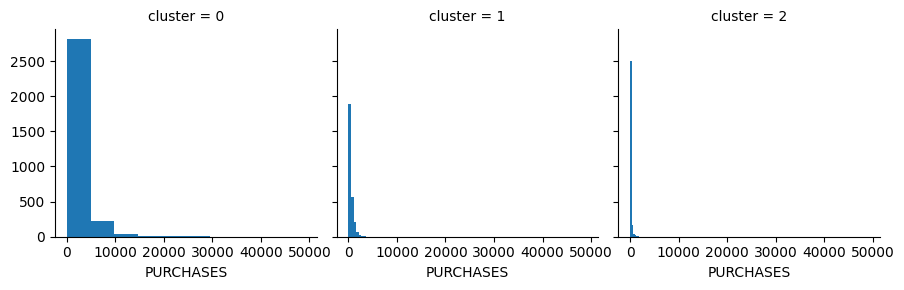

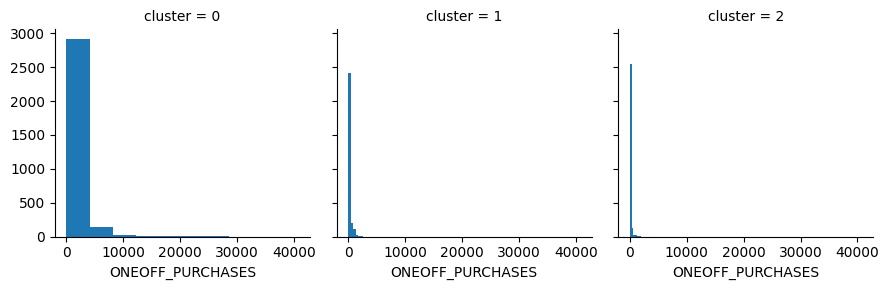

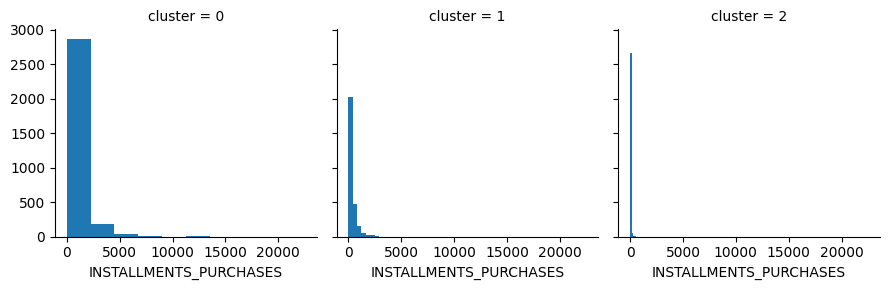

...

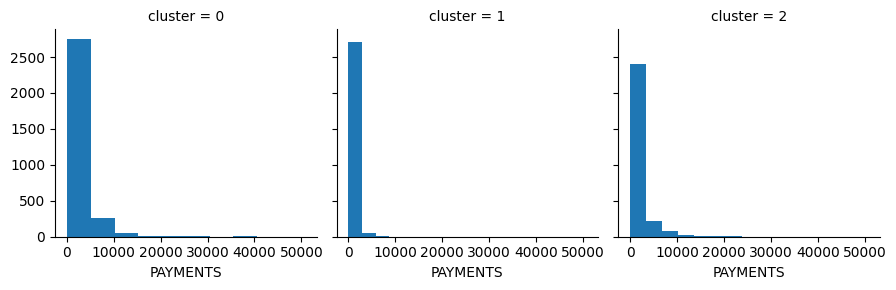

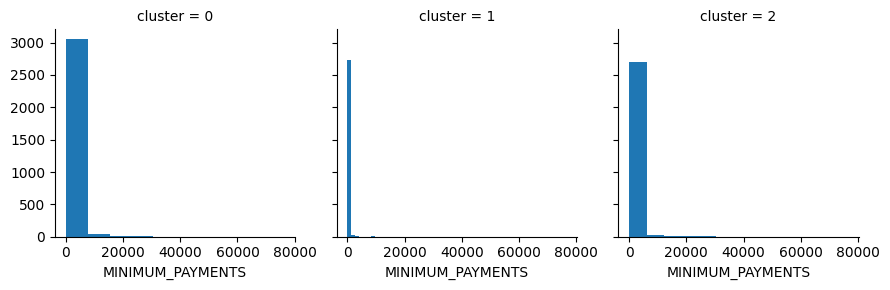

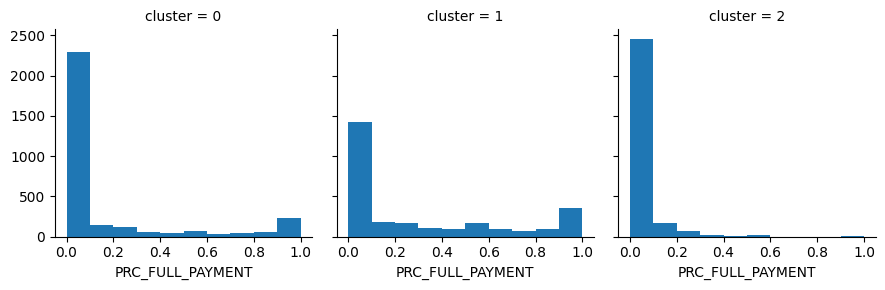

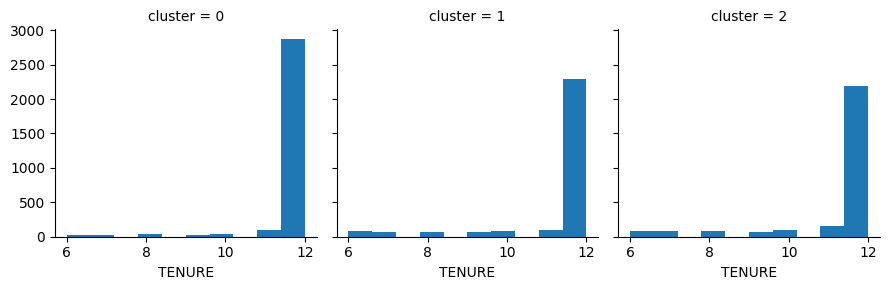

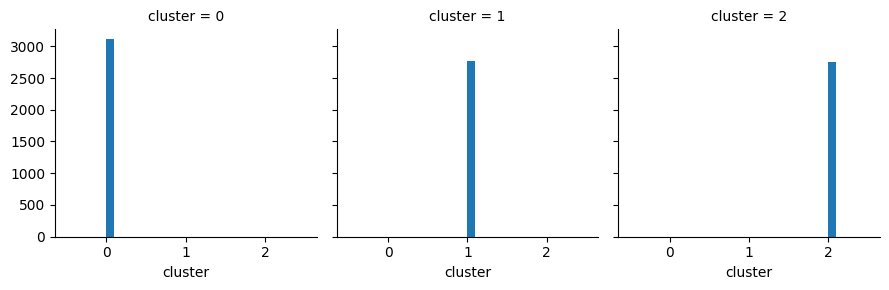

In [ ]:
# get interpretation insights of clusters.
for c in kmeans_clusters:
    grid= sns.FacetGrid(kmeans_clusters, col='cluster')
    grid.map(plt.hist, c)

**Discussion Stage**
* From the previous plot of cluster distribution according to feature we can ensure that **k = 3** is a good choice.

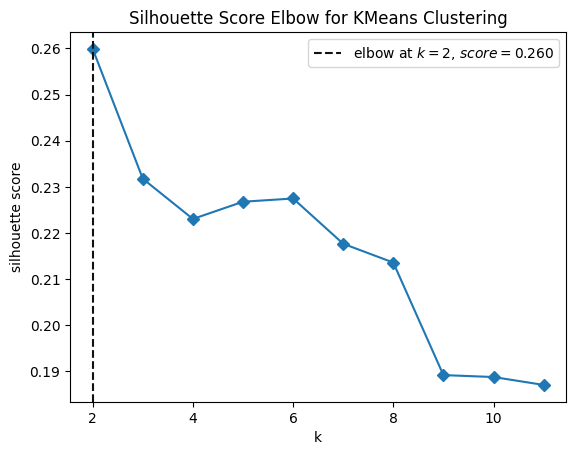

<AxesSubplot:title={'center':'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [ ]:
# using elbow method to choose the best cluster.
visualizer = KElbowVisualizer(kmeans_obj, k=(2, 12), metric='silhouette', timings=False)

visualizer.fit(scaled_data)    
visualizer.poof()

**Discussion Stage**
* Based on the silhouette score elbow graph, we can notice that **k=2** is the best choice of the number of clusters.

**Interpretation of Clusters**

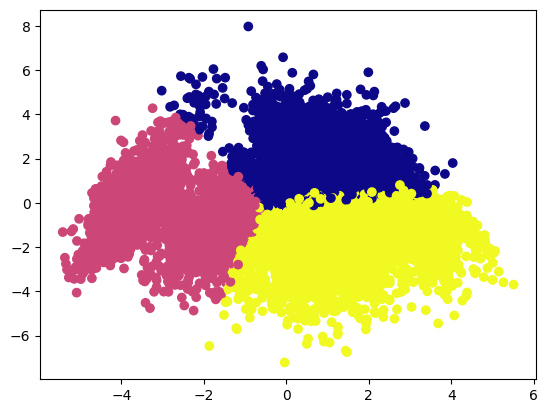

In [ ]:
# set the percentage of retrieved data.
pca = PCA(0.95)
# fit scaled data and transform it.
X_pca = pca.fit_transform(scaled_data)
# build and predict the new axes.
model = KMeans(init = 'k-means++', n_clusters=3, n_init =  100, random_state=42)
yhat = model.fit_predict(X_pca)
# scatter plot of the 2 Principal Components with labels indicated by colors.
plt.scatter(X_pca[:,0], X_pca[:,1], c = yhat, cmap = 'plasma')
plt.show()

## Mini-Batch K-Means

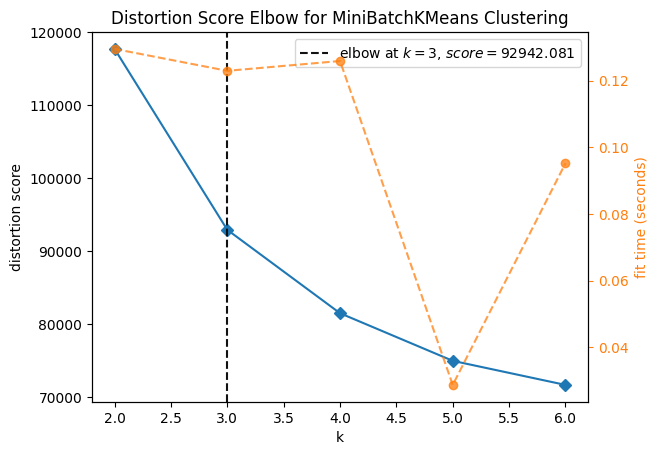

<AxesSubplot:title={'center':'Distortion Score Elbow for MiniBatchKMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [ ]:
# instantiate the clustering model and visualizer
visualizer = KElbowVisualizer(MiniBatchKMeans(n_init = 'auto', random_state= 42), k=(2,7))
visualizer.fit(scaled_data)
visualizer.poof()

**Discussion Stage**
* Distortion score set **k = 4** is the best number of clusters.

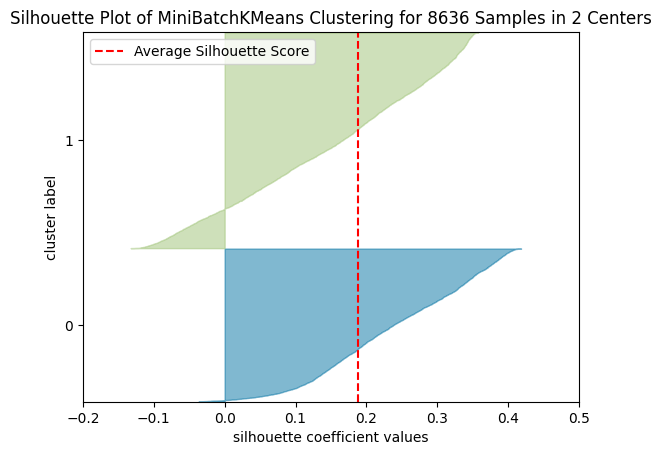

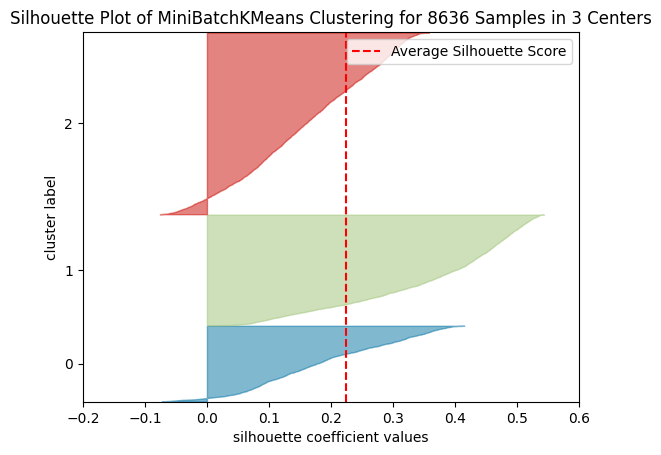

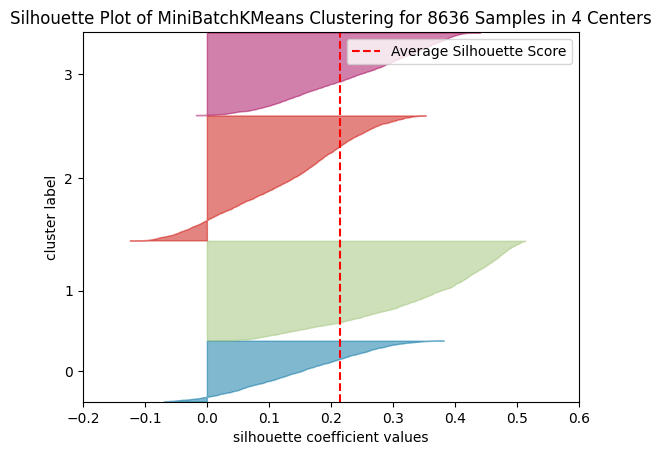

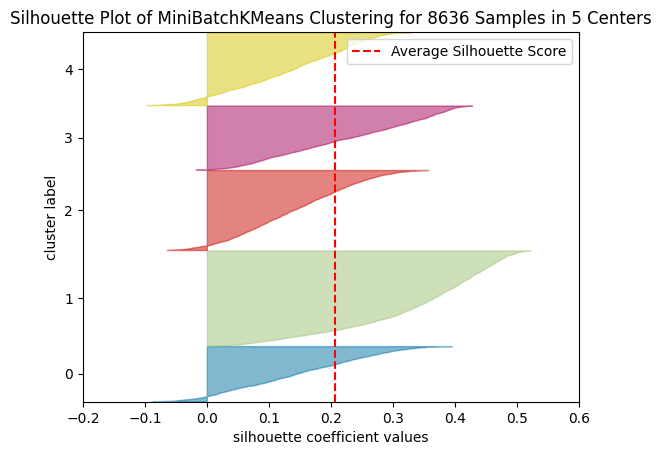

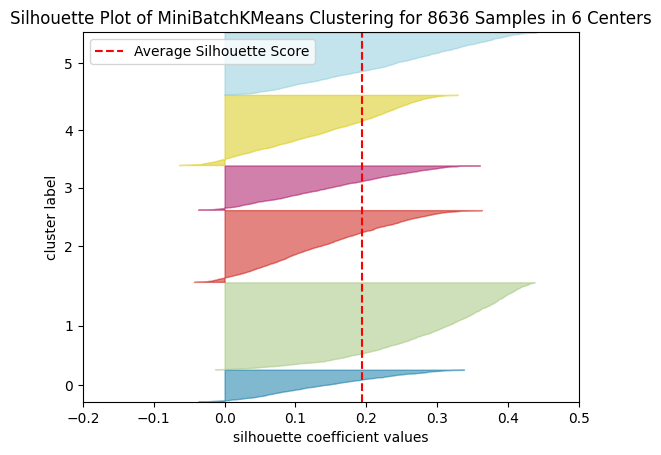

In [ ]:
# instantiate the clustering model and visualizer
for i in range (2,7):
  model = MiniBatchKMeans(i, n_init = 'auto', random_state=42)
  visualizer = SilhouetteVisualizer(model, colors='yellowbrick')

  visualizer.fit(scaled_data)
  visualizer.poof()

**Discussion Stage**
* From the previous silhouette score plots, **k= 3** is the best choice.

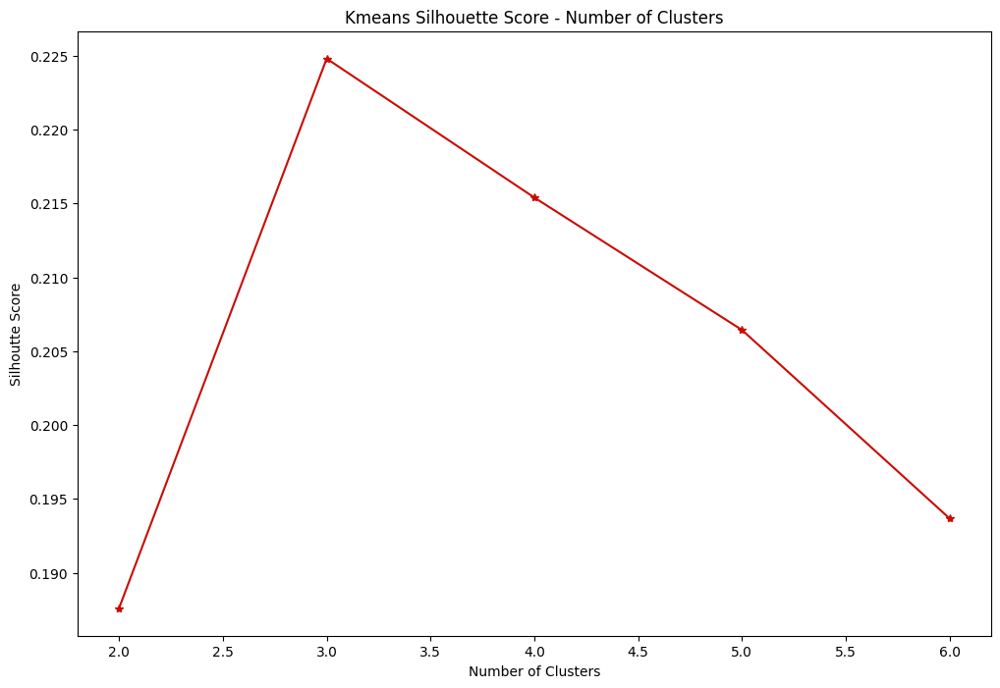

In [ ]:
kmeans_visualize_silhouette(scaled_data, MiniBatchKMeans, (2, 7), kmeans_constants)

**Discussion Stage**
* Depends on Silhouette score of Mini-Batch Kmeans, **k = 3** is the best choice.

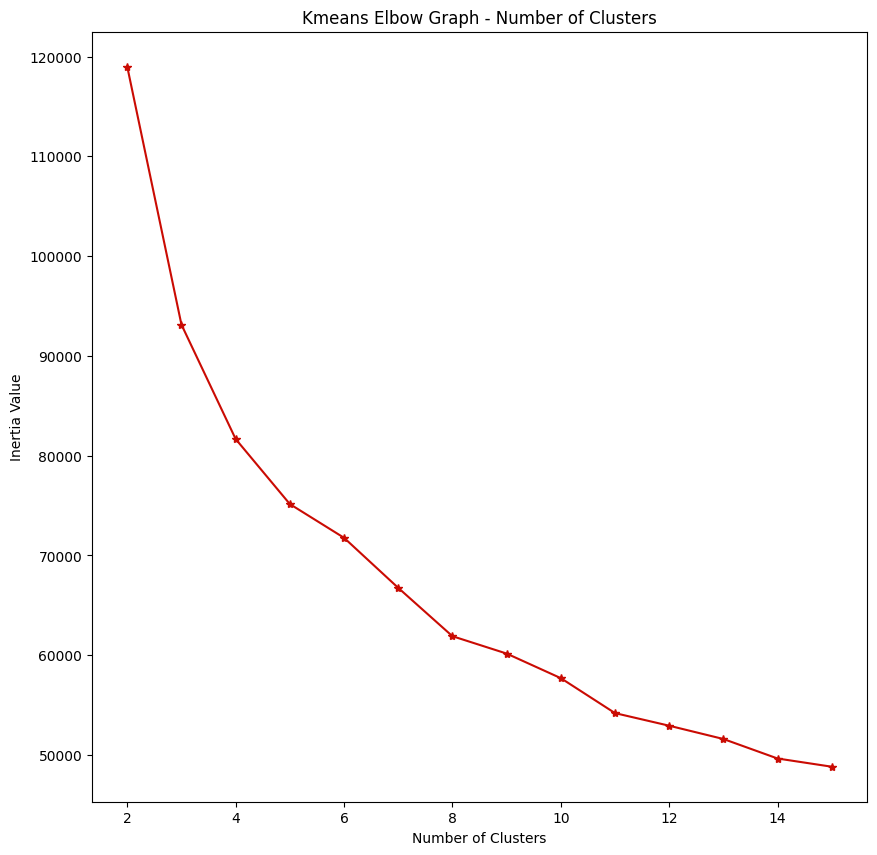

In [ ]:
kmeans_visualize_inertia(scaled_data, MiniBatchKMeans, (2, 16), kmeans_constants)

**Discussion Stage**
* Based of Inertia, **k = 9** is the best choice.
* Finally I think **k = 3** is the best choice.

**Interpretation of Clusters**

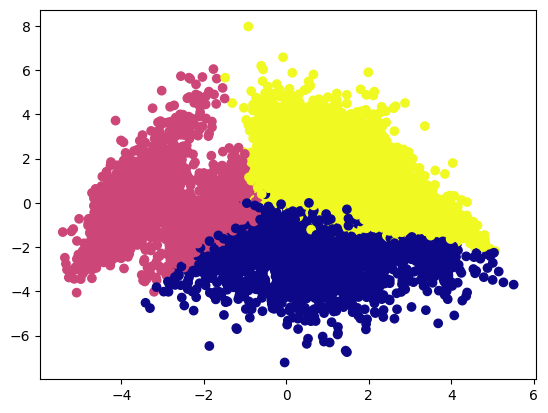

In [ ]:
# set the percentage of retrieved data.
pca = PCA(0.95)
# fit scaled data and transform it.
X_pca = pca.fit_transform(scaled_data)
# build and predict the new axes.
model = MiniBatchKMeans(3, n_init = 'auto', random_state=42)
yhat = model.fit_predict(X_pca)
# scatter plot of the 2 Principal Components with labels indicated by colors.
plt.scatter(X_pca[:,0], X_pca[:,1], c = yhat, cmap = 'plasma')
plt.show()

## **DBSCAN**

In [ ]:
def dbscan_silhouette(data, model, points_ranges, model_arg):
  '''
  Visualize silhouette score of dbscan algorithm.
  Args:
  data-- data frame that we want to deal with.
  model-- machine learning model object.
  points_ranges-- points range defines the number of min samples.
  model_arg-- dictionary contains model arguments.
  Returns:
  Plot a visualization of silhouette values.
  '''
  silhoutte_coefs = []
  for min_points in points_ranges:
    # scaler = StandardScaler()
    # sc_data = scaler.fit_transform(data)
    model_obj = model(min_samples = min_points, **model_arg).fit(data)
    silhoutte_coefs.append(silhouette_score(data, model_obj.labels_))
      
  plt.figure(figsize = (10, 10))
  plt.plot(points_ranges, silhoutte_coefs, color = 'r', marker = '^')
  plt.xlabel('Minimum Samples of Each Cluster')
  plt.ylabel('Silhouette Score')
  plt.title('Silhouette Score - Min Samples of Clusters')
  return plt.show()

In [ ]:
# create neighors object.
neighbors = NearestNeighbors(n_neighbors = 5)
# create scalar object and fit it.
neigh_scaler = StandardScaler().fit_transform(clean_data)
neigh_model = neighbors.fit(neigh_scaler)

In [ ]:
# check distances.
distances, *other = neigh_model.kneighbors(neigh_scaler)
distances

array([[5.96046448e-08, 7.67243689e-01, 9.44776949e-01, 9.90370704e-01,
        1.19304991e+00],
       [0.00000000e+00, 8.55443560e-01, 8.74734155e-01, 9.02493216e-01,
        9.66946440e-01],
       [0.00000000e+00, 3.27794483e-01, 7.98694386e-01, 8.52271299e-01,
        8.82773880e-01],
       ...,
       [0.00000000e+00, 9.01191910e-01, 1.05004368e+00, 1.10657344e+00,
        1.28124643e+00],
       [0.00000000e+00, 1.98619005e+00, 2.13372528e+00, 2.20754776e+00,
        2.58479194e+00],
       [1.19209290e-07, 2.12322299e+00, 2.21447382e+00, 2.33028770e+00,
        2.59986097e+00]])

In [ ]:
# view distance shapes.
distances = distances[:, 1]
distances.shape

(8636,)

In [ ]:
# sort the distances and print it.
distances = np.sort(distances, axis = 0)
distances

array([0.04092595, 0.04092595, 0.05714148, ..., 3.68140631, 3.69358203,
       4.14228081])

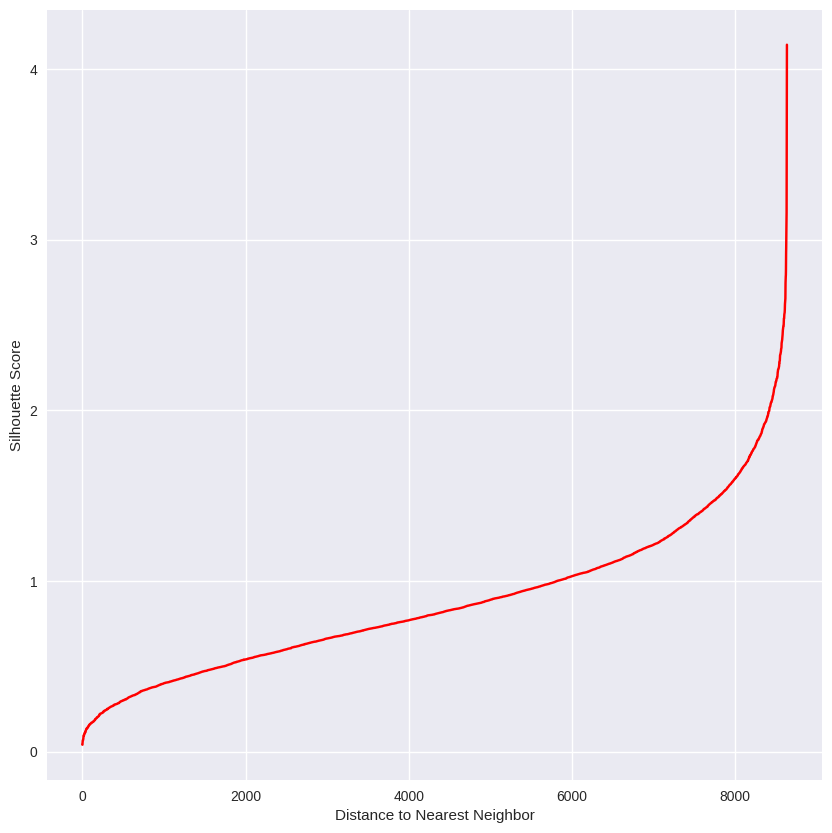

In [ ]:
# plot diagram.
plt.style.use('seaborn')
plt.figure(figsize = (10, 10))
plt.plot(distances, color = 'red')
plt.xlabel('Distance to Nearest Neighbor')
plt.ylabel('Silhouette Score')
plt.show()

**Discussion Stage**
* Based on the Silhouette score elbow graph, we can notice that **distance= 8300** is the best choice.

In [ ]:
# compute the best epsilon value.
epsilon = distances[8300]
epsilon

1.8450855933370858

**Discussion Stage**
* Here is the value of epsilon that indicates to the **distance 8300**.
* Using plot of the shortest distances, and finding the **elbow** on the graph, the optimum value for epsilon has been found.

In [ ]:
# create points ranges.
points_ranges = (20, 100, 200, 300, 400, 500, 600)
model_arg = {'eps': epsilon}

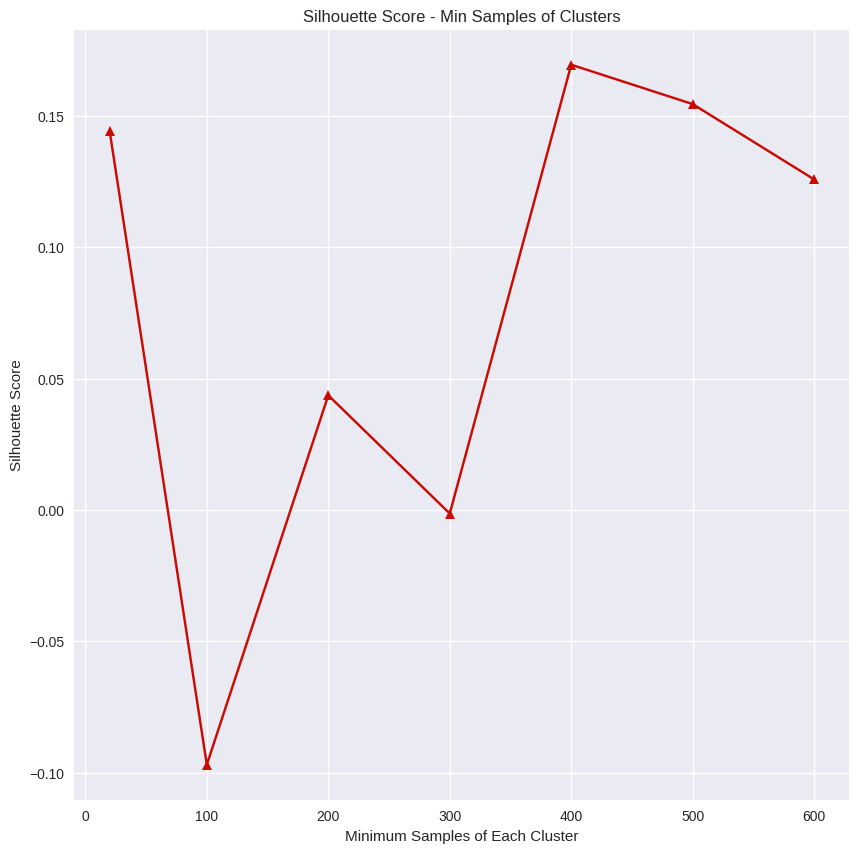

In [ ]:
# visualize the silhouette score diagram.
dbscan_silhouette(neigh_scaler, DBSCAN, points_ranges, model_arg)

**Discussion Stage**
* Based on the Silhouette score elbow graph of minimum samples of each cluster, we can notice that **min_samples= 400** is the best choice.

In [ ]:
# build the model.
dbscan_model = DBSCAN(eps = epsilon, min_samples = 400).fit(neigh_scaler)

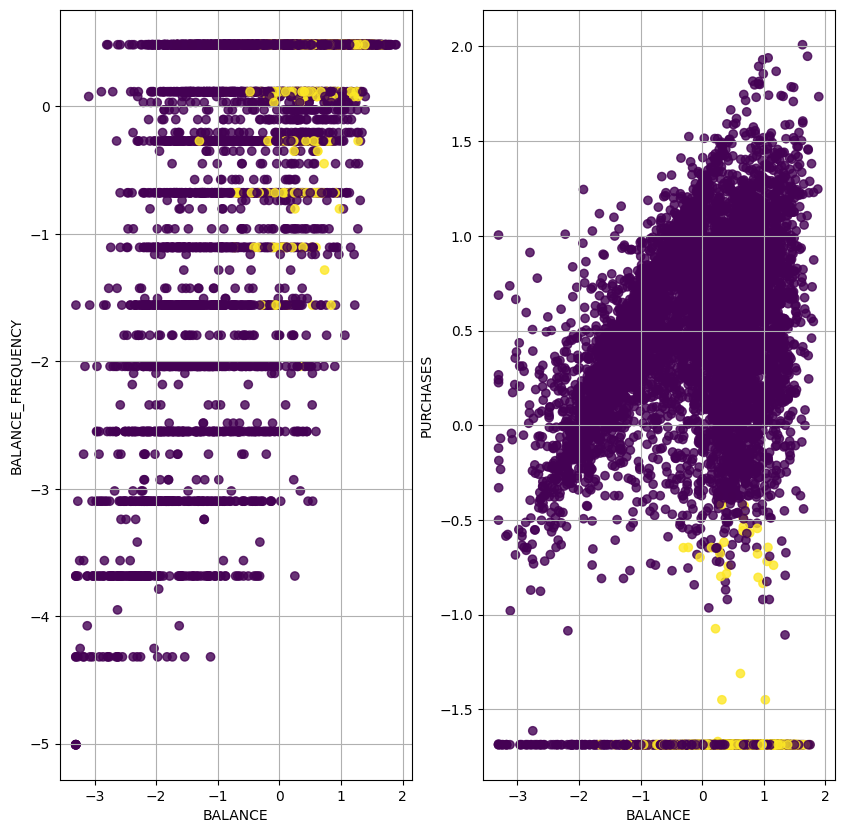

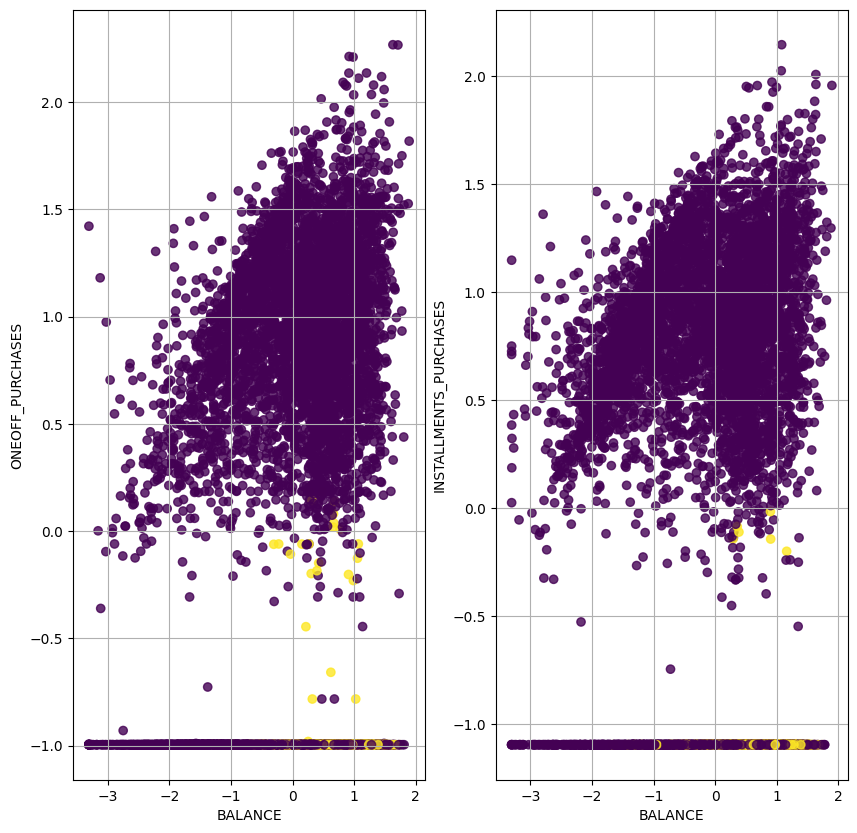

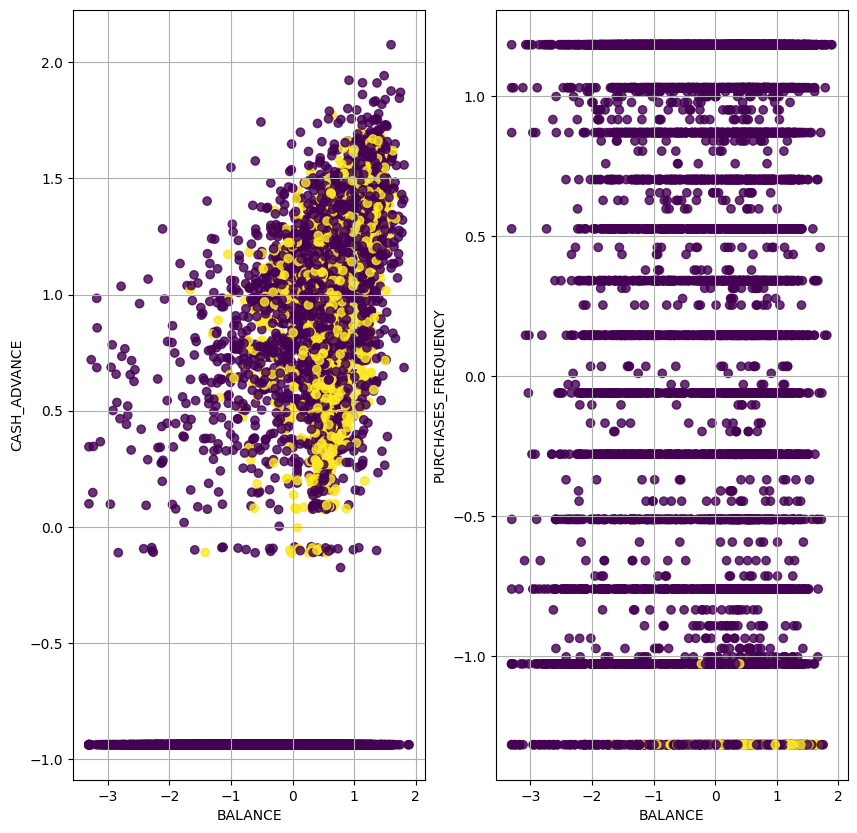

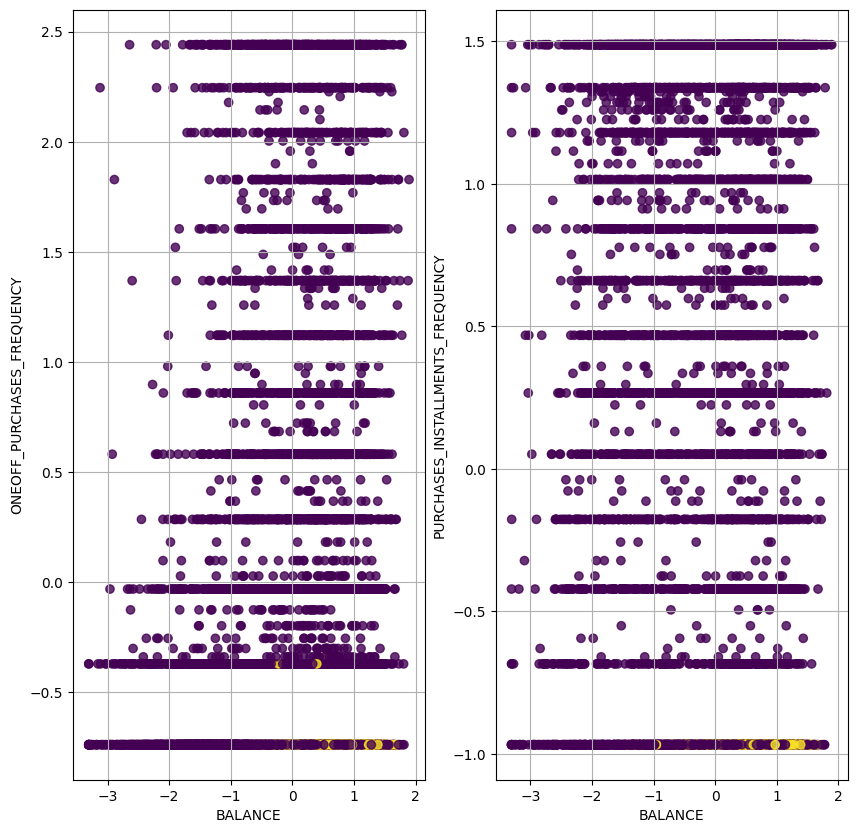

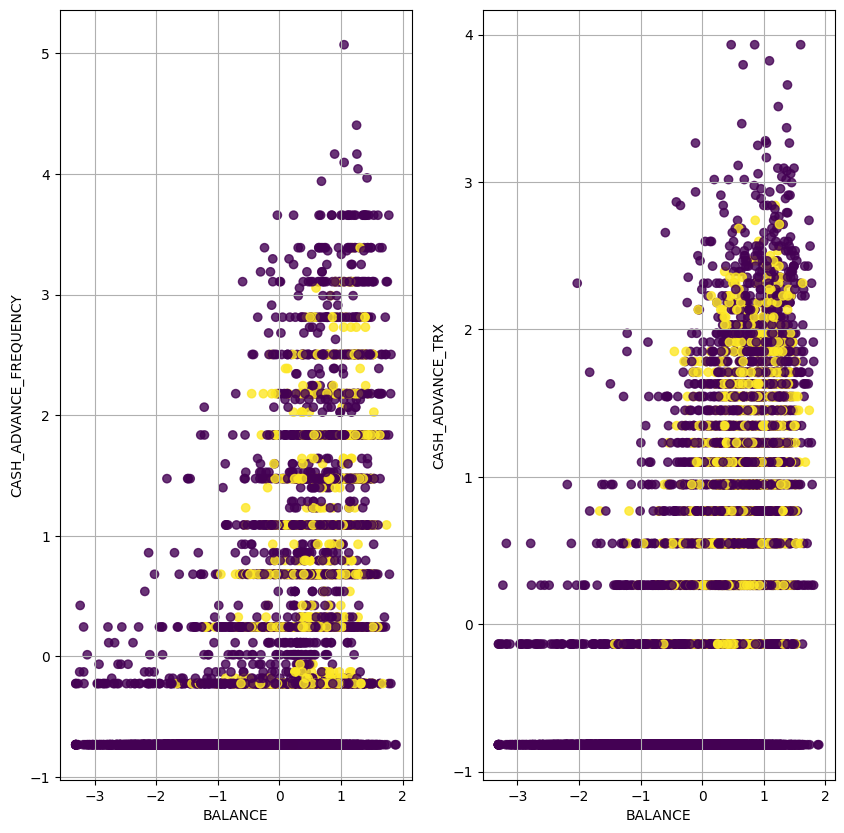

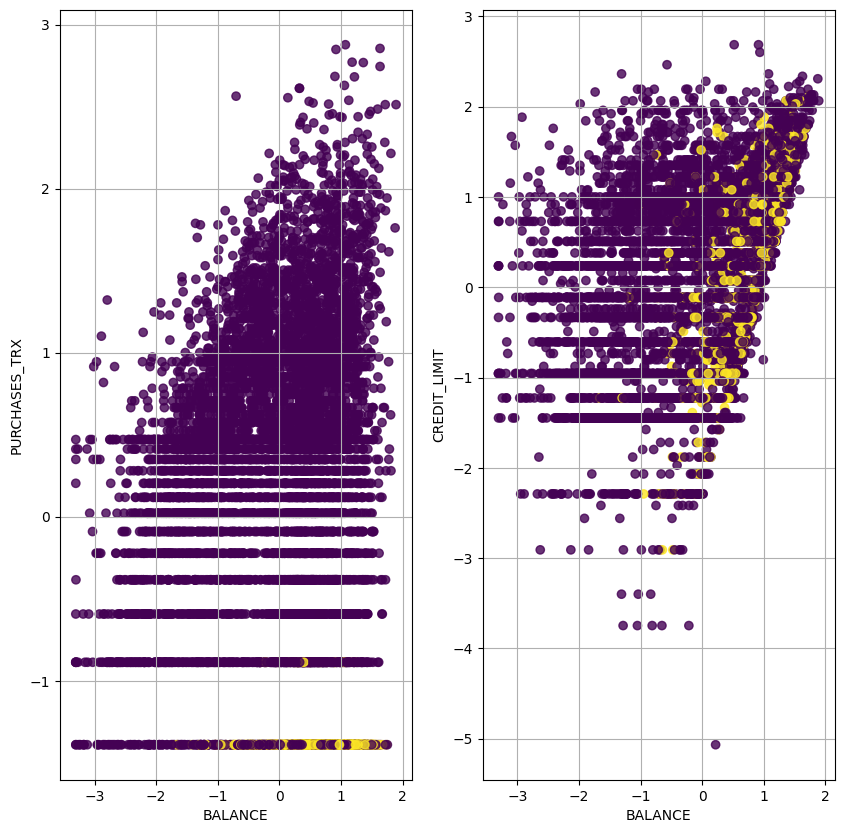

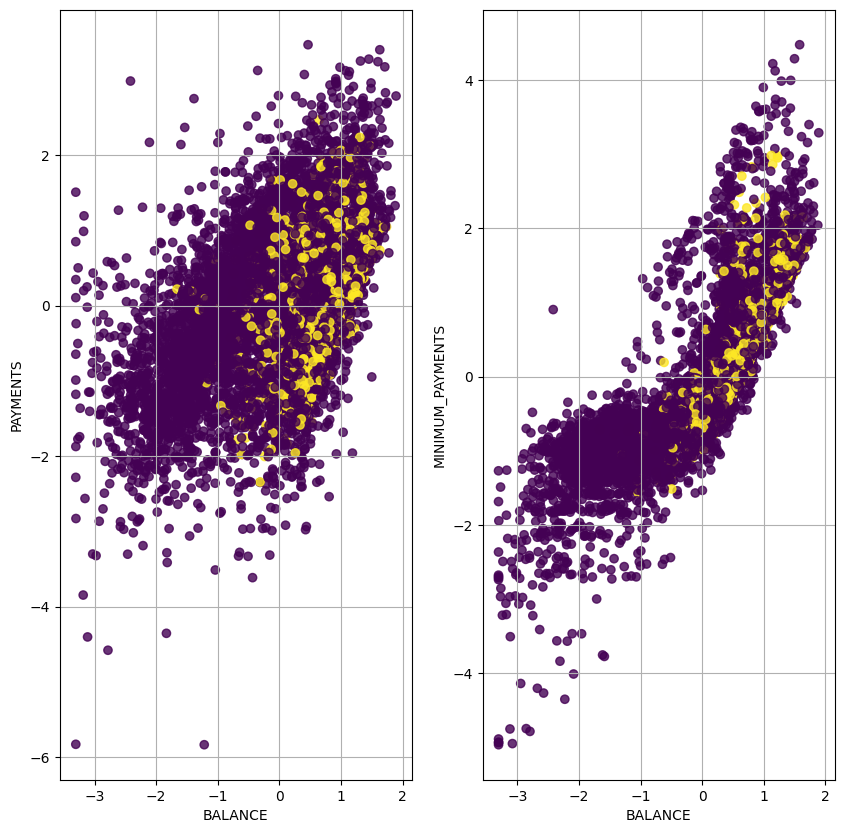

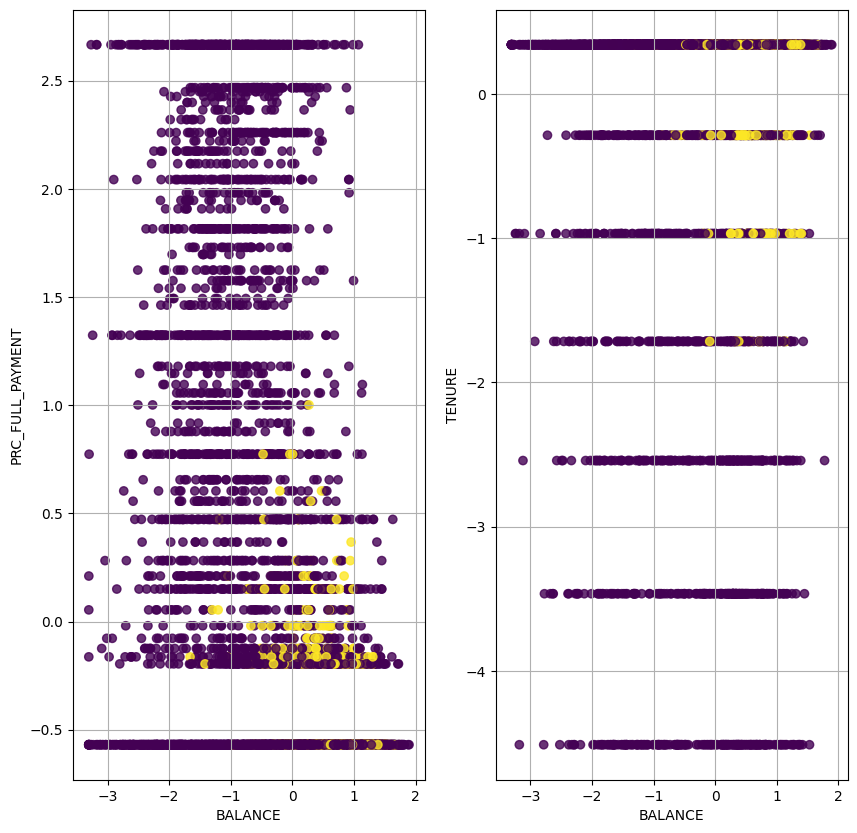

In [ ]:
plt.style.use('default')
i = 1
while i < len(clean_data.columns):
    try:
        fig = plt.figure(figsize = (10, 10))
        plt.subplot(1,2,1)
        plt.scatter(clean_data['BALANCE'], clean_data[clean_data.columns[i]],
                    c = dbscan_model.labels_.astype(float), alpha = 0.8)
        plt.xlabel('BALANCE')
        plt.ylabel(clean_data.columns[i])
        plt.grid()
        i += 1
        plt.subplot(1,2,2)
        plt.scatter(clean_data['BALANCE'], clean_data[clean_data.columns[i]],
                    c = dbscan_model.labels_.astype(float), alpha = 0.8)
        plt.xlabel('BALANCE')
        plt.ylabel(clean_data.columns[i])
        plt.grid()
        i += 1
    except IndexError:
        break
plt.show()

**Discussion Stage**
* From the previous graph we can see that dbscan fits the data pretty well using **epsilon = 1.33**, and **min_samples = 400**.

In [ ]:
print('Silhouette Score : ', silhouette_score(neigh_scaler, dbscan_model.labels_))

Silhouette Score :  0.16954084832563687


**Discussion Stage**
* Results of DH are not satisfying yet. As outliers have an adverse effect on the performance of **KMeans**, for improving the result.
* We have to repeat the process even in slightly different result (better performance) taking the silhouette score into consideration.

In [ ]:
# create cluster visualization of dbscan algorithm.
dbscan_clusters= pd.concat([eda_cls_missed_df, pd.DataFrame({'cluster': dbscan_model.labels_})], axis=1)
dbscan_clusters.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,cluster
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.00,0,2,1000.0,201.802084,139.509787,0.000000,12,-1
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.25,4,0,7000.0,4103.032597,1072.340217,0.222222,12,0
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.00,0,12,7500.0,622.066742,627.284787,0.000000,12,-1
3,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.00,0,1,1200.0,678.334763,244.791237,0.000000,12,-1
4,1809.828751,1.000000,1333.28,0.00,1333.28,0.000000,0.666667,0.000000,0.583333,0.00,0,8,1800.0,1400.057770,2407.246035,0.000000,12,-1


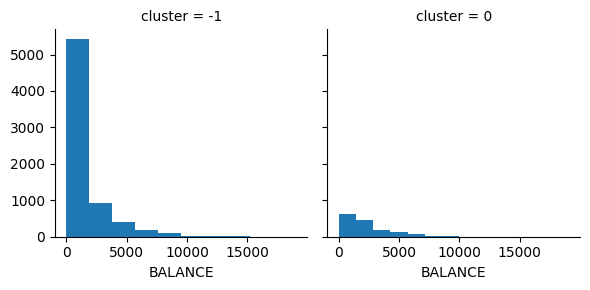

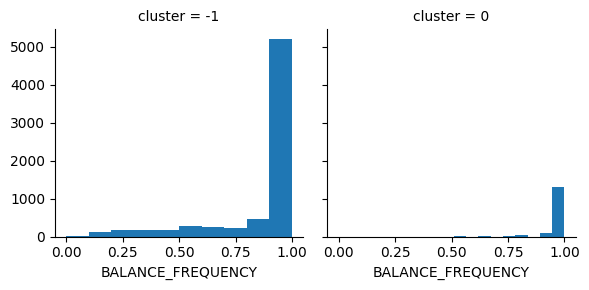

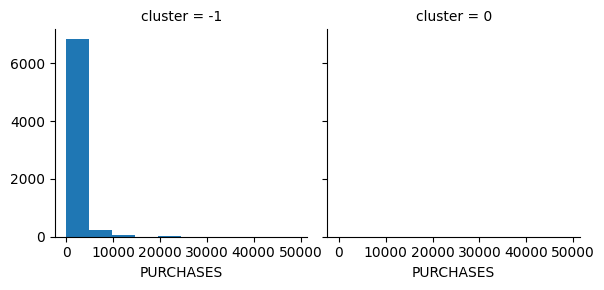

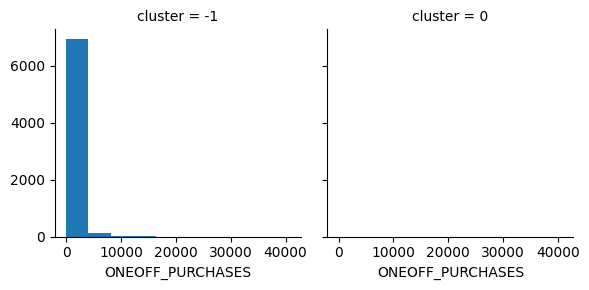

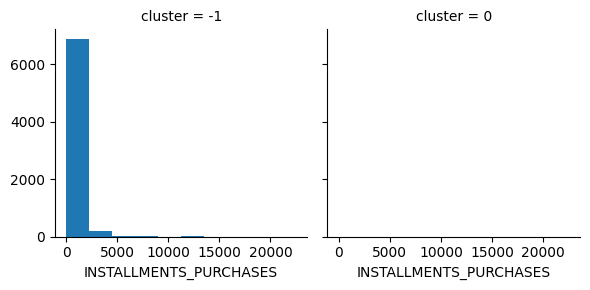

...

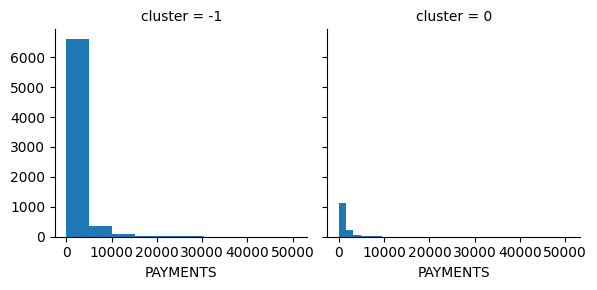

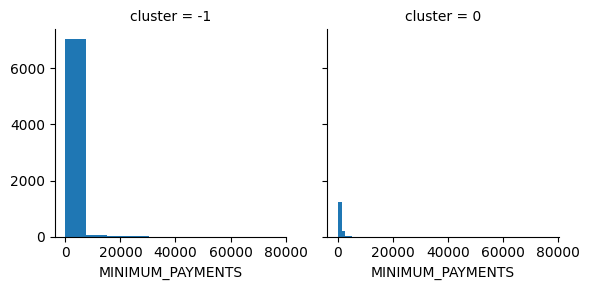

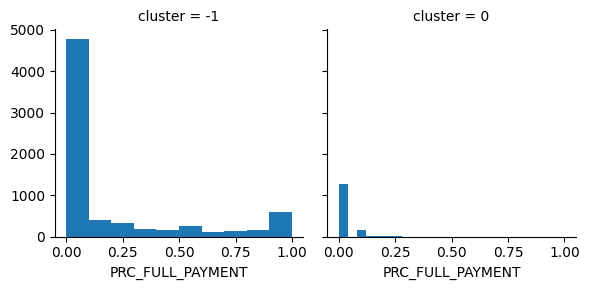

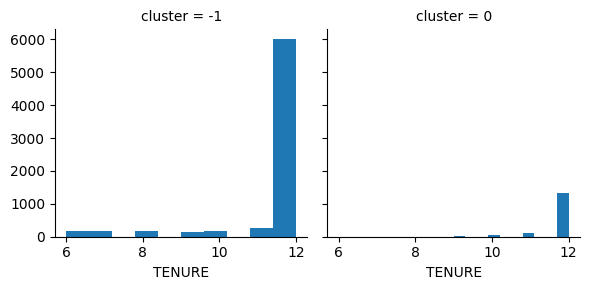

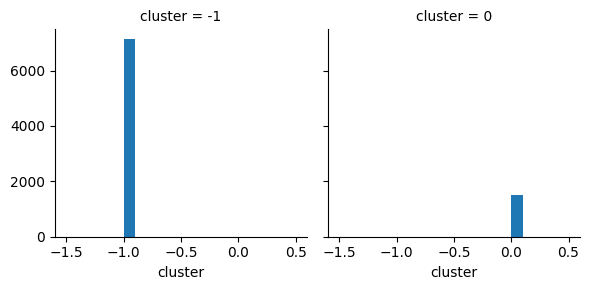

In [ ]:
# get interpretation insights of clusters.
for c in dbscan_clusters:
    grid= sns.FacetGrid(dbscan_clusters, col='cluster')
    grid.map(plt.hist, c)

**Interpretation of Clusters**

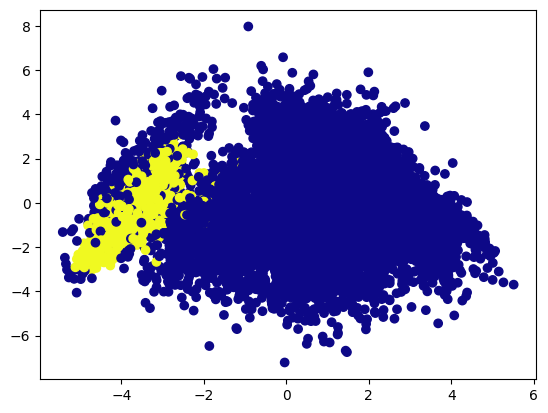

In [ ]:
# set the percentage of retrieved data.
pca = PCA(0.95)
# fit scaled data and transform it.
X_pca = pca.fit_transform(neigh_scaler)
# build and predict the new axes.
model = DBSCAN(eps = epsilon, min_samples = 400)
yhat = model.fit_predict(X_pca)
# scatter Plot of the 2 Principal Components with labels indicated by colors.
plt.scatter(X_pca[:,0], X_pca[:,1], c = yhat, cmap = 'plasma')
plt.show()

## **Agglomerative clustering**

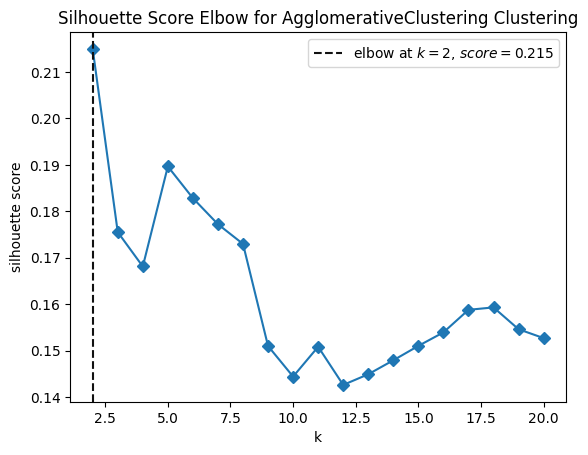

<AxesSubplot:title={'center':'Silhouette Score Elbow for AgglomerativeClustering Clustering'}, xlabel='k', ylabel='silhouette score'>

In [ ]:
# using elbow method to choose the best cluster.
visualizer = KElbowVisualizer(AgglomerativeClustering(), k=(2,21), metric='silhouette', timings=False)

visualizer.fit(scaled_data)    
visualizer.poof()

**Discussion Stage**
* Based on the silhouette score elbow graph of each cluster, we can notice that **k= 2** is the best choice.

In [ ]:
# scaled_obj = StandardScaler()
# scaled_data = scaled_obj.fit_transform(clean_data)
agv_clustering = AgglomerativeClustering(n_clusters = 2).fit(scaled_data)

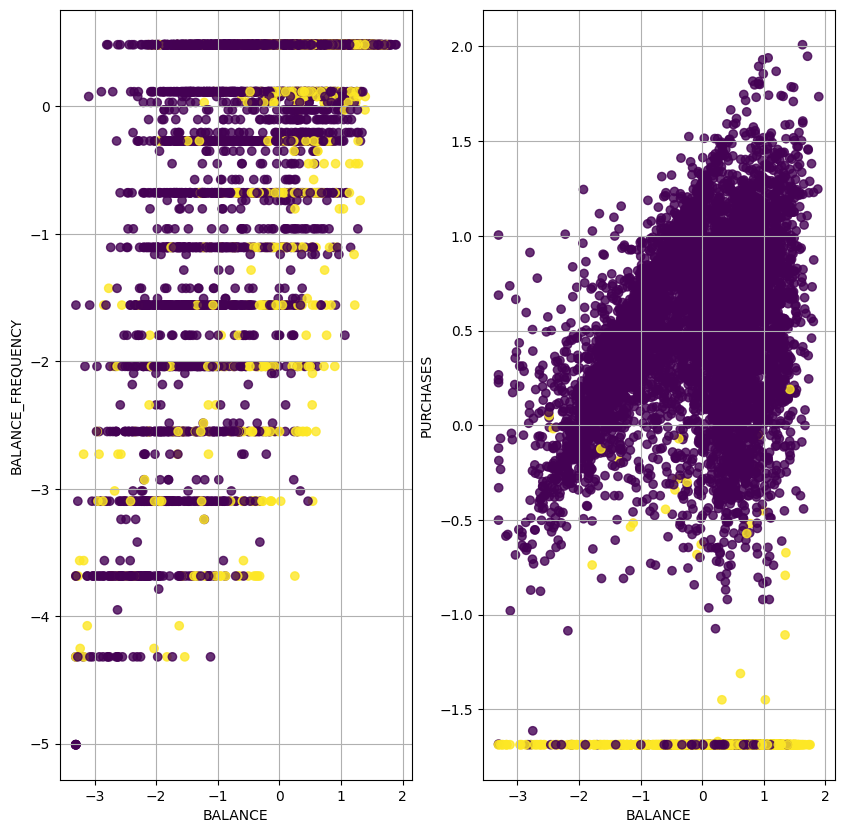

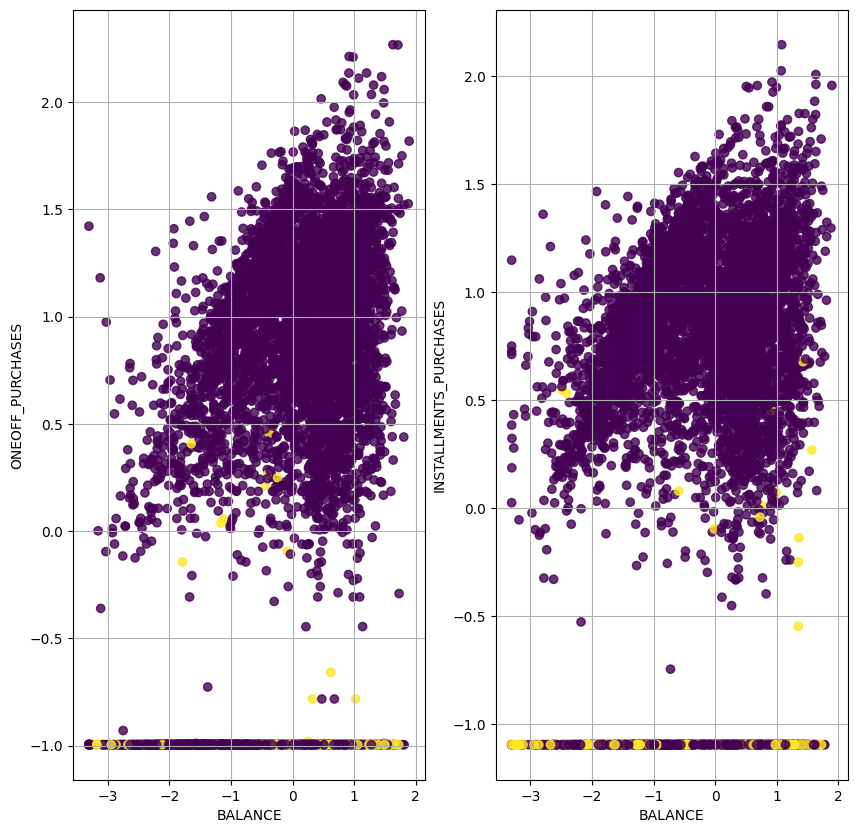

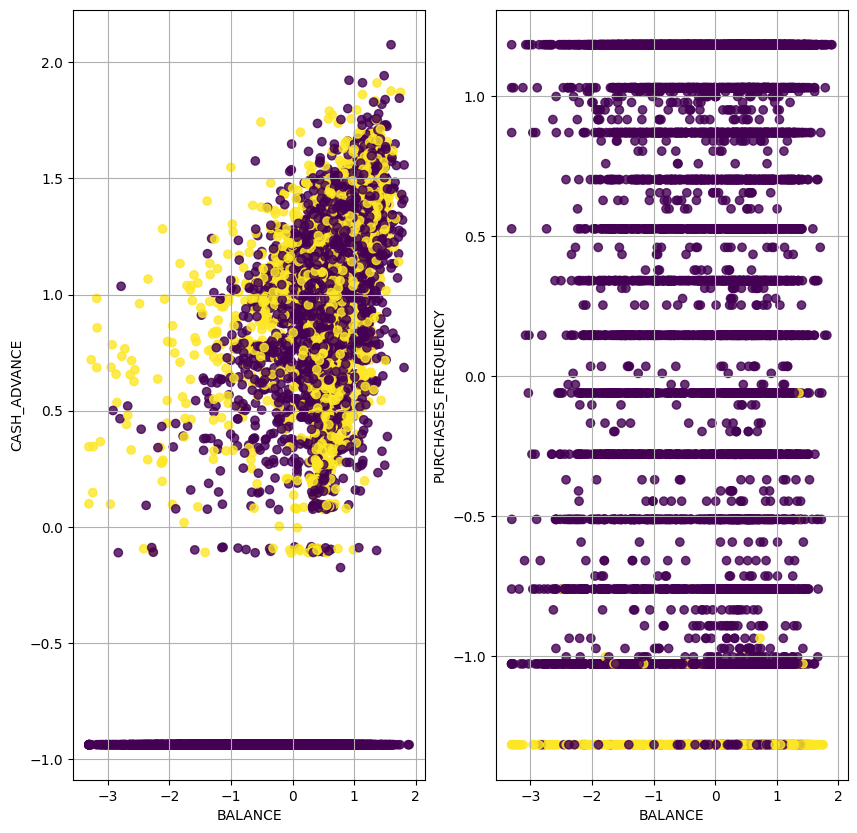

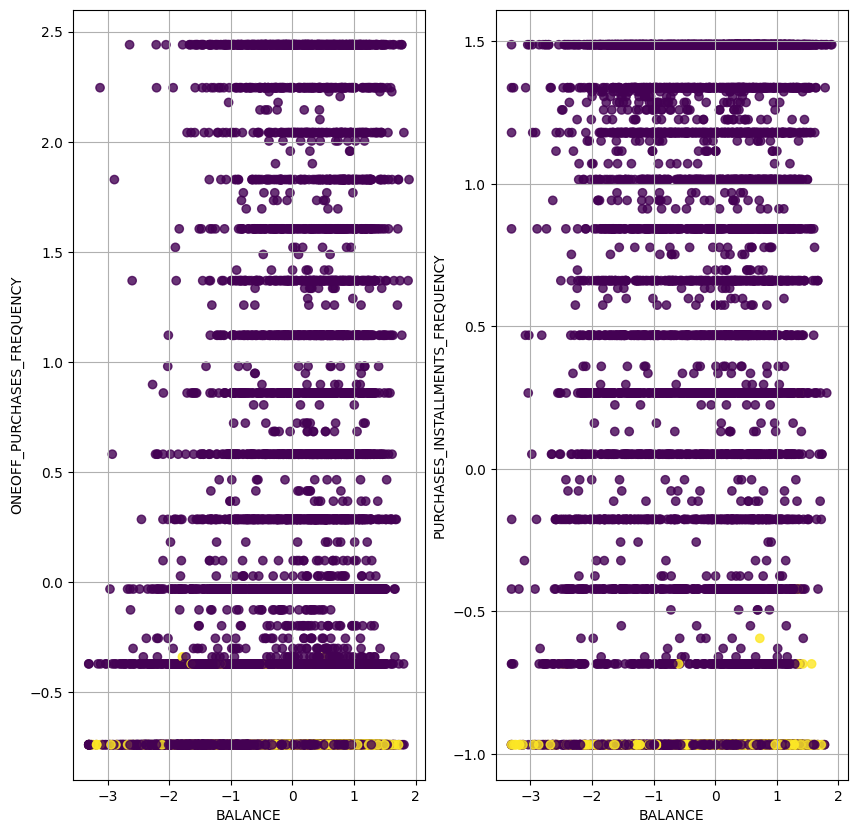

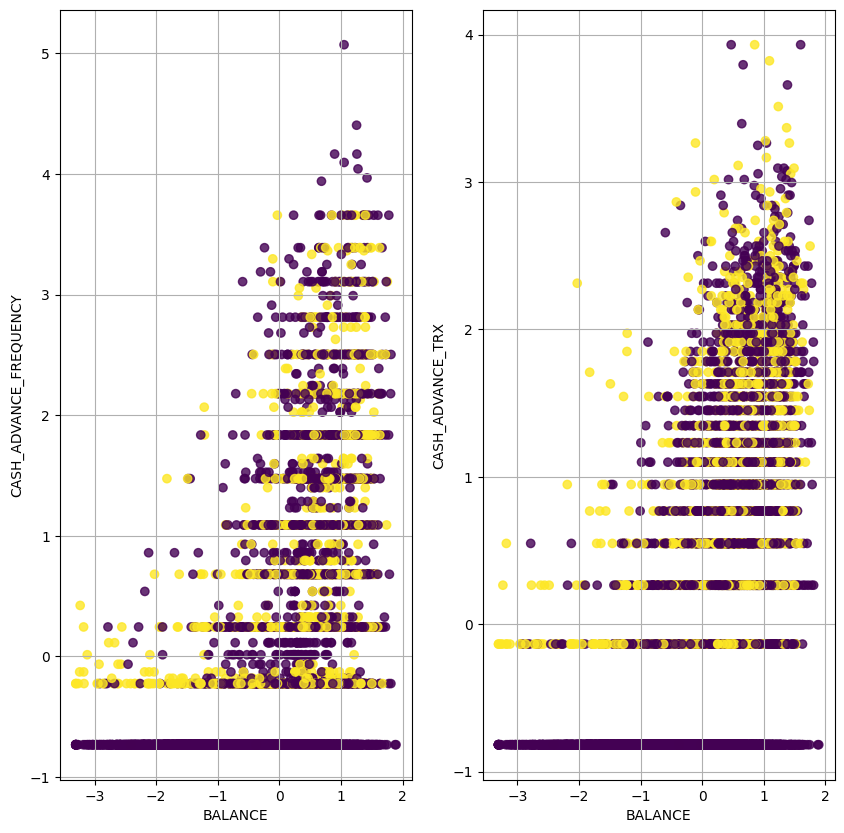

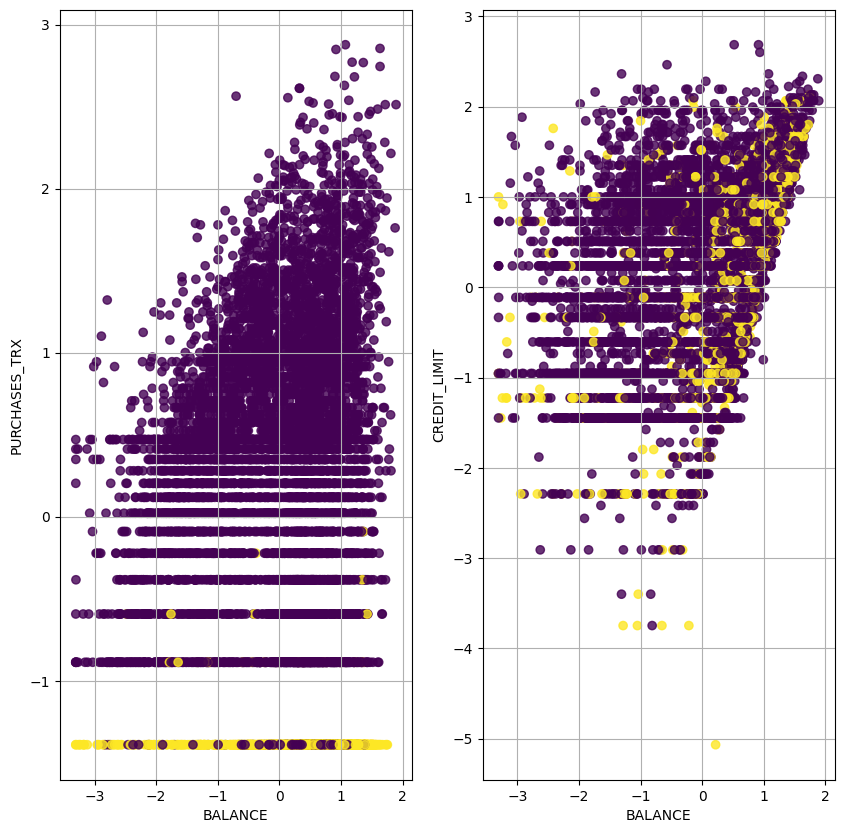

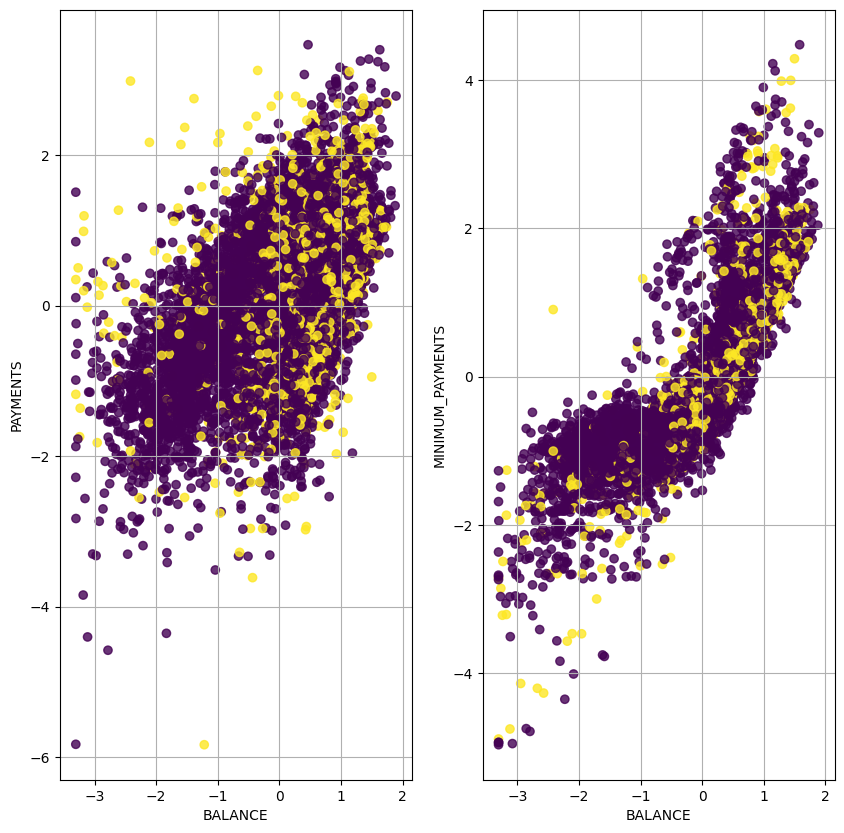

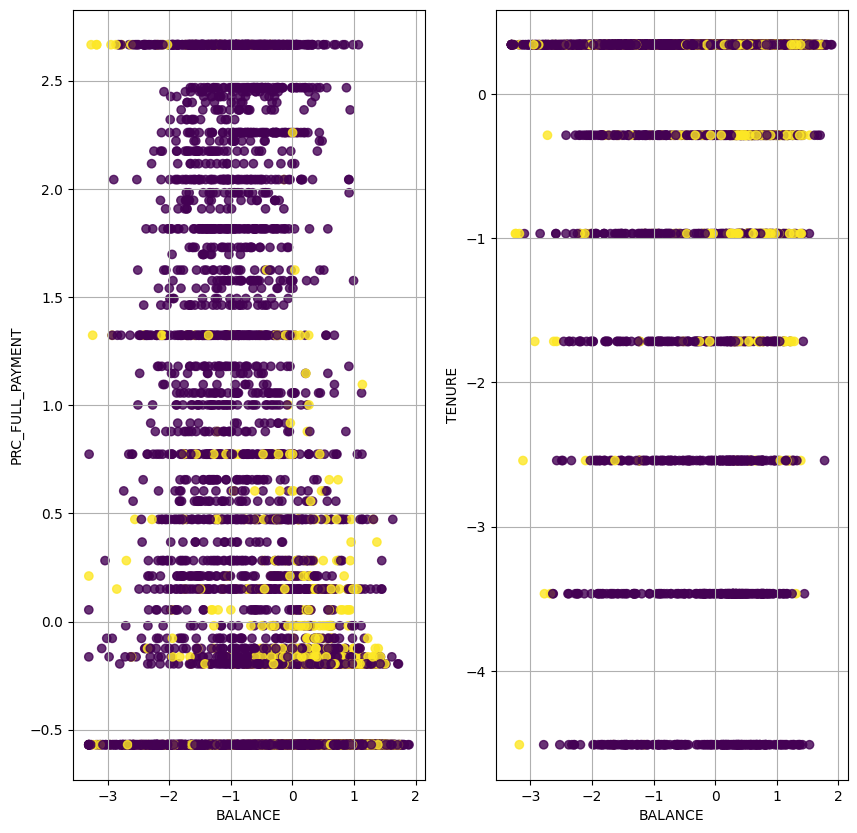

In [ ]:
plt.style.use('default')
i = 1
while i < len(clean_data.columns):
    try:
        fig = plt.figure(figsize = (10, 10))
        plt.subplot(1,2,1)
        plt.scatter(clean_data['BALANCE'], clean_data[clean_data.columns[i]],
                    c = agv_clustering.labels_.astype(float), alpha = 0.8)
        plt.xlabel('BALANCE')
        plt.ylabel(clean_data.columns[i])
        plt.grid()
        i += 1
        plt.subplot(1,2,2)
        plt.scatter(clean_data['BALANCE'], clean_data[clean_data.columns[i]],
                    c = agv_clustering.labels_.astype(float), alpha = 0.8)
        plt.xlabel('BALANCE')
        plt.ylabel(clean_data.columns[i])
        plt.grid()
        i += 1
    except IndexError:
        break
plt.show()

**Discussion Stage**
* We can see that **the number of clusters of 2** the AgglomerativeClustering model works pretty well.

In [ ]:
# create cluster visualization of Agglomerative algorithm.
agv_clusters= pd.concat([eda_cls_missed_df, pd.DataFrame({'cluster': agv_clustering.labels_})], axis=1)
agv_clusters.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,cluster
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.00,0,2,1000.0,201.802084,139.509787,0.000000,12,0
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.25,4,0,7000.0,4103.032597,1072.340217,0.222222,12,1
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.00,0,12,7500.0,622.066742,627.284787,0.000000,12,0
3,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.00,0,1,1200.0,678.334763,244.791237,0.000000,12,0
4,1809.828751,1.000000,1333.28,0.00,1333.28,0.000000,0.666667,0.000000,0.583333,0.00,0,8,1800.0,1400.057770,2407.246035,0.000000,12,0


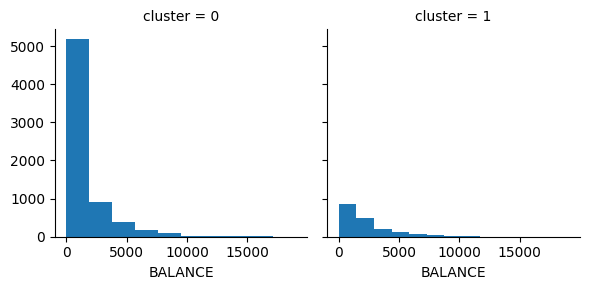

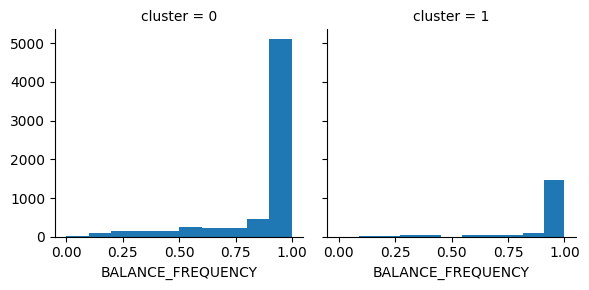

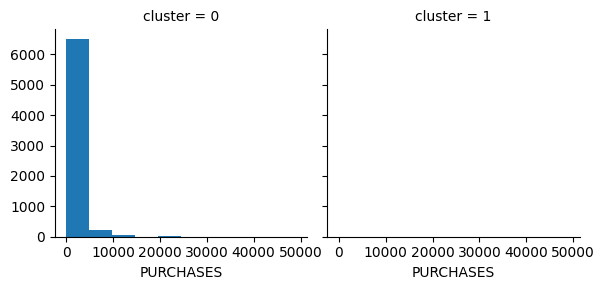

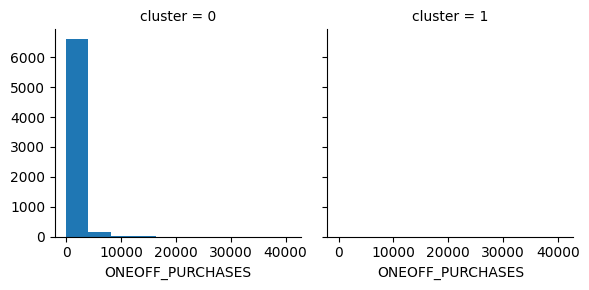

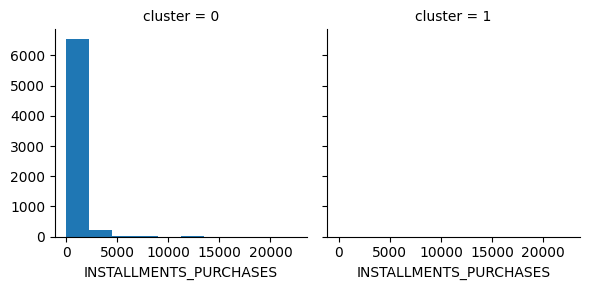

...

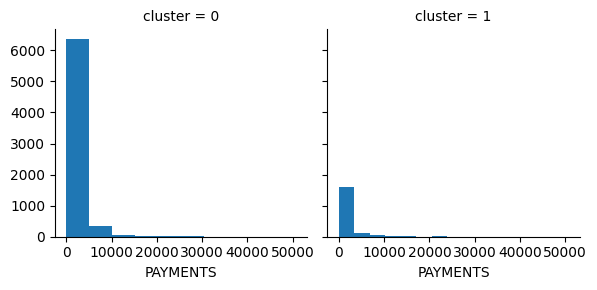

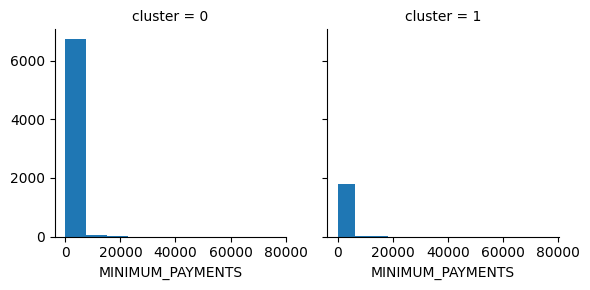

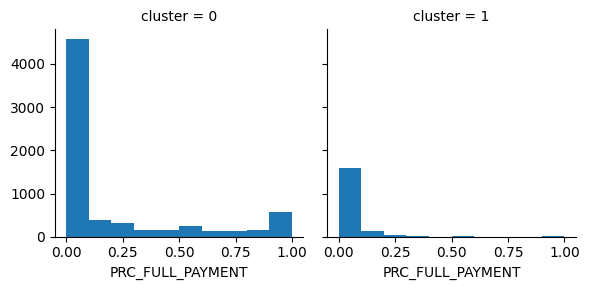

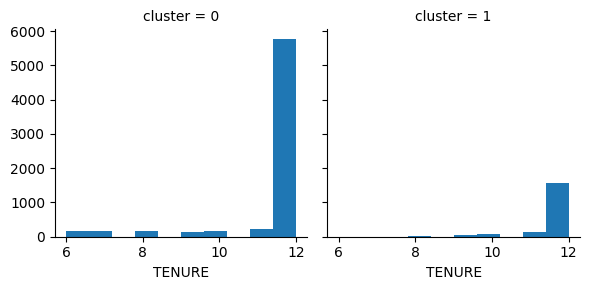

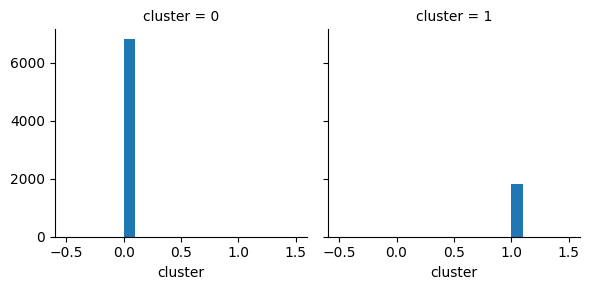

In [ ]:
# get interpretation insights of clusters.
for c in agv_clusters:
    grid= sns.FacetGrid(agv_clusters, col='cluster')
    grid.map(plt.hist, c)

**Discussion Stage**
* Here we can see more information about the clusters distribution on data features.

**Interpretation of Clusters**

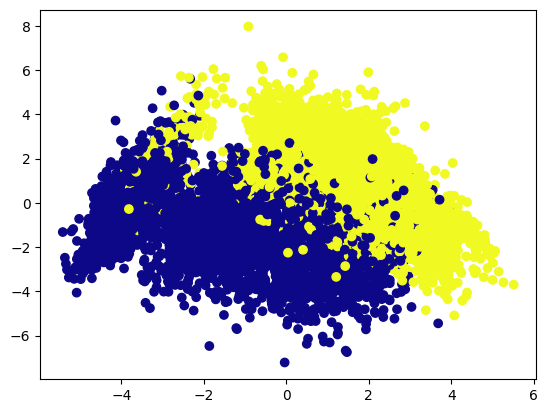

In [ ]:
# set the percentage of retrieved data.
pca = PCA(0.95)
# fit scaled data and transform it.
X_pca = pca.fit_transform(scaled_data)
model = AgglomerativeClustering(n_clusters=2)
yhat = model.fit_predict(X_pca)
# scatter Plot of the 2 Principal Components with labels indicated by colors.
plt.scatter(X_pca[:,0], X_pca[:,1], c = yhat, cmap = 'plasma')
plt.show()

## **Birch**

Considering that *BIRCH* is robust to outliers, and as it is also a data reduction method

In [ ]:
def birch_silhouette(data, model, threshold_ranges):
  '''
  Visualize silhouette score of birch algorithm.
  Args:
  data-- dataframe that we want to deal with.
  model-- machine learning model object.
  threshold_ranges-- tuple define model threshold ranges.
  Returns:
  Plot a visualization of silhouette values.
  '''
  silhouette_scores = []
  for threshold_ in np.arange(*threshold_ranges):
    #scaled_data = StandardScaler().fit_transform(data)
    birch_model = model(threshold = threshold_).fit(data)
    silhouette_scores.append(silhouette_score(data, birch_model.labels_))
      
  plt.figure(figsize = (10, 10))
  plt.plot(np.arange(*threshold_ranges), silhouette_scores, color = 'r', marker = '*', label = 'Silhouette')
  plt.xlabel('Threshold')
  plt.legend()
  plt.show()

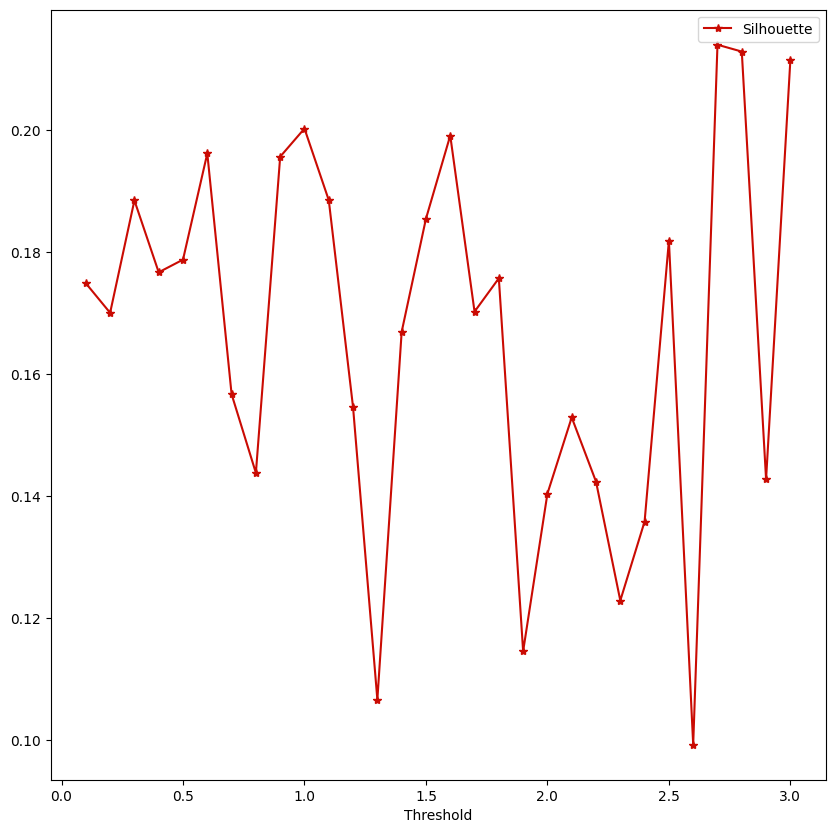

In [ ]:
# visualize birch silhouette score.
birch_silhouette(scaled_data, Birch, (0.1, 3.1, 0.1))

**Discussion Stage**
* Based on the silhouette score elbow graph of each cluster, we can notice that **threshold= 2.65** is the best choice.

In [ ]:
# scaler_data = StandardScaler().fit_transform(clean_data)
birch_obj = Birch(threshold = 2.65, branching_factor = 50, n_clusters = 3)
birch_model = birch_obj.fit(scaled_data)

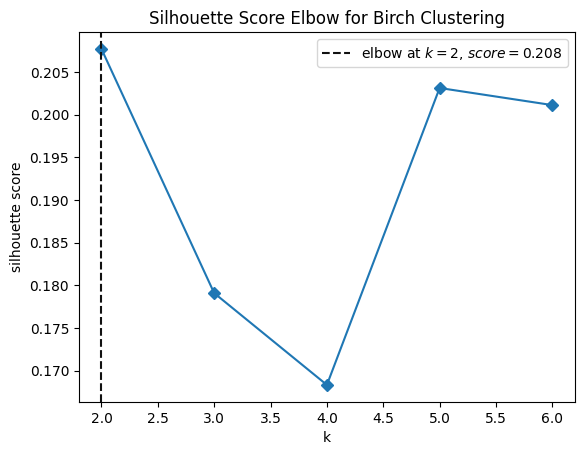

<AxesSubplot:title={'center':'Silhouette Score Elbow for Birch Clustering'}, xlabel='k', ylabel='silhouette score'>

In [ ]:
# using elbow method
visualizer = KElbowVisualizer(Birch(threshold = 2.65, branching_factor = 50), k=(2,7), metric='silhouette', timings=False)

visualizer.fit(scaled_data)    
visualizer.poof()

**Discussion Stage**
* Based on Silhoutte score elbow graph of each cluster, we can notice that **k= 2** is the best choice.

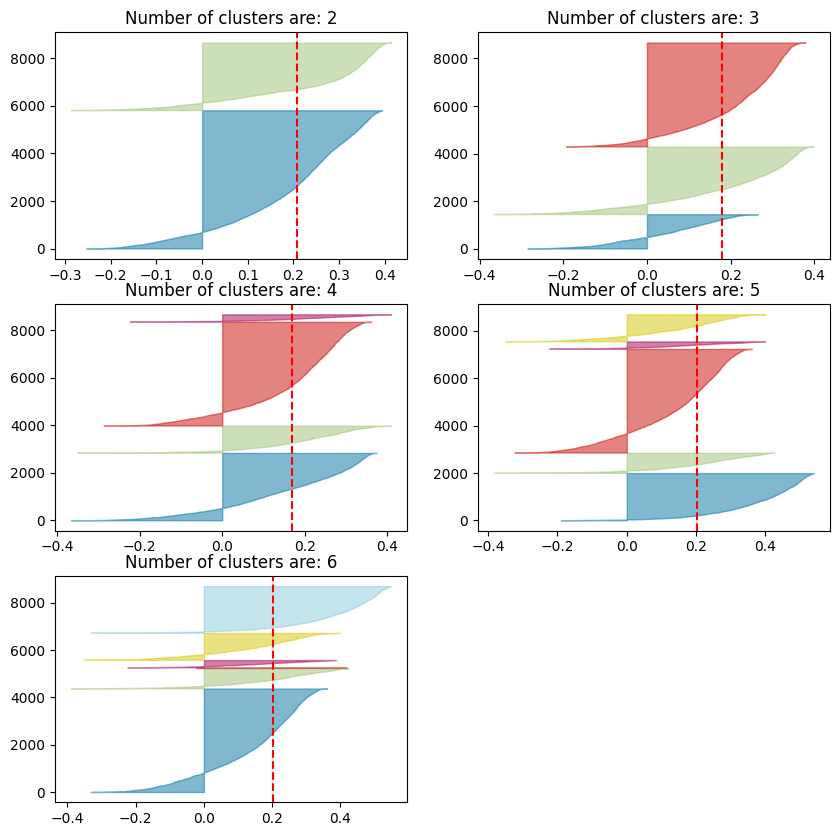

In [ ]:
# Instantiate the clustering model and visualizer for a looping process
# scaled_data = StandardScaler().fit_transform(clean_data)
plt.figure(figsize = (10, 10))
for k in range (2, 7):
  ax = plt.subplot(3, 2, k-1)
  model = Birch(threshold = 2.65, branching_factor = 50, n_clusters = k)
  visualizer = SilhouetteVisualizer(model, colors='yellowbrick', ax= ax)
  # fit the data and visualize it
  visualizer.fit(scaled_data)
  plt.title(f"Number of clusters are: {k}")         
plt.show()

**Discussion Stage**
* We can see that the birch model works pretty well using **the number of clusters of 2** and a **threshold of 2.65**.

In [ ]:
# create cluster visualizarion of kmeans algorithms.
birch_clusters= pd.concat([eda_cls_missed_df, pd.DataFrame({'cluster': birch_model.labels_})], axis=1)
birch_clusters.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,cluster
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.00,0,2,1000.0,201.802084,139.509787,0.000000,12,2
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.25,4,0,7000.0,4103.032597,1072.340217,0.222222,12,1
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.00,0,12,7500.0,622.066742,627.284787,0.000000,12,2
3,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.00,0,1,1200.0,678.334763,244.791237,0.000000,12,2
4,1809.828751,1.000000,1333.28,0.00,1333.28,0.000000,0.666667,0.000000,0.583333,0.00,0,8,1800.0,1400.057770,2407.246035,0.000000,12,2


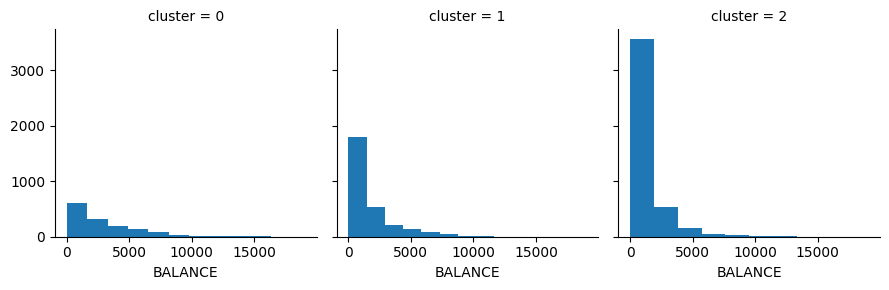

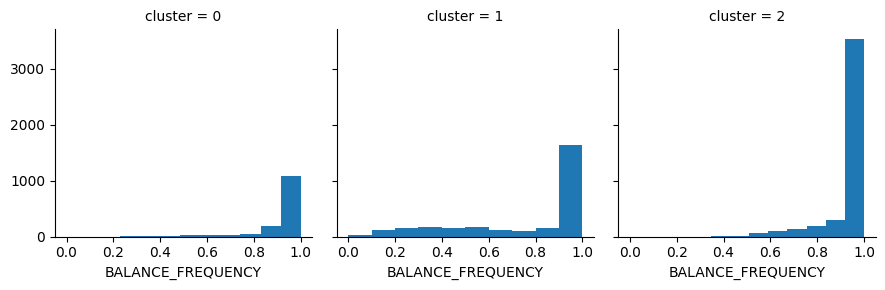

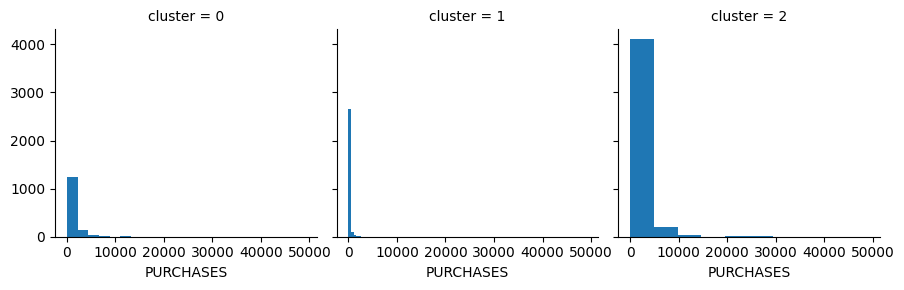

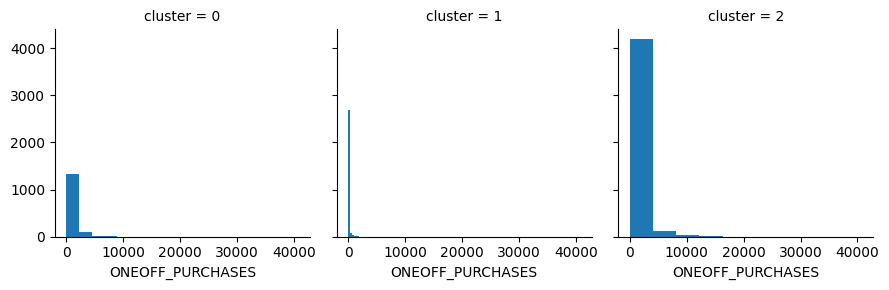

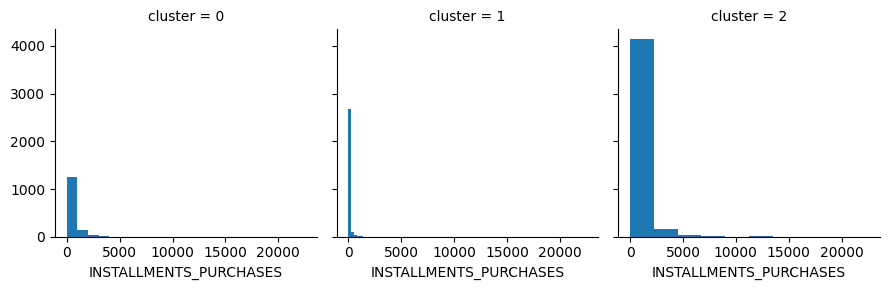

...

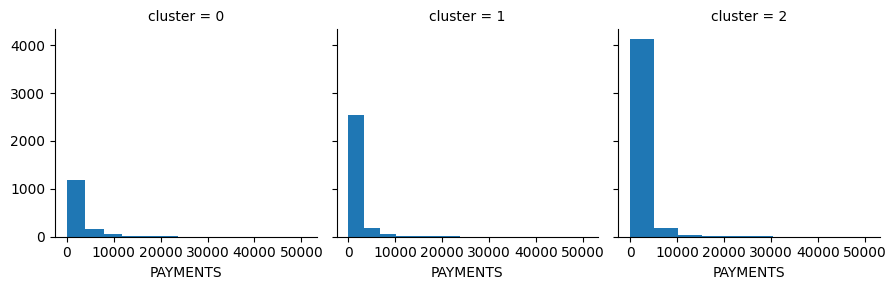

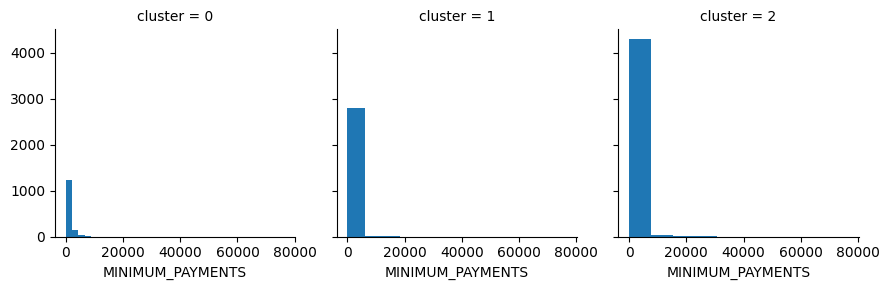

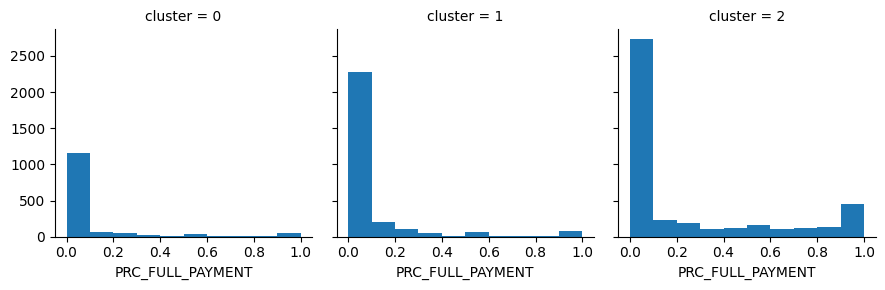

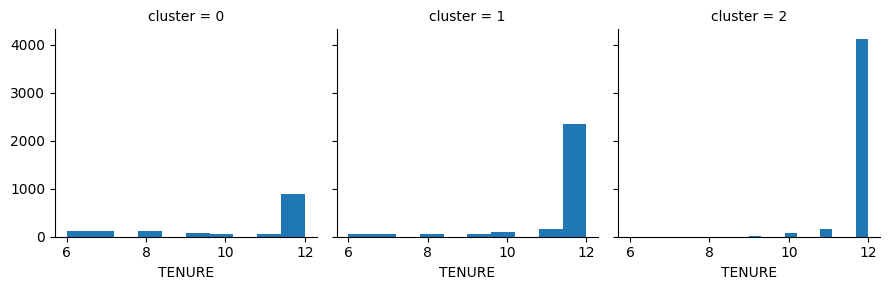

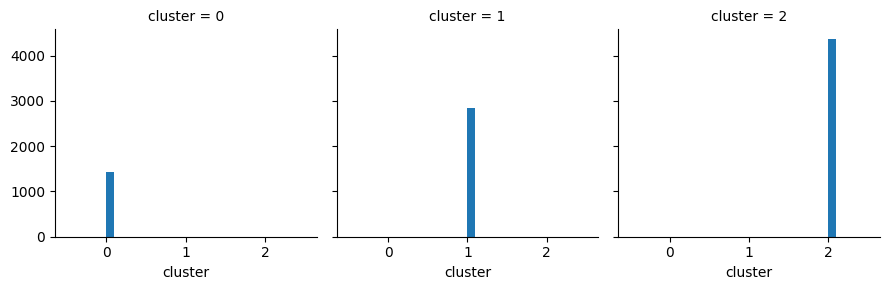

In [ ]:
# get interpretation insights of clusters.
for c in birch_clusters:
    grid= sns.FacetGrid(birch_clusters, col='cluster')
    grid.map(plt.hist, c)

**Discussion Stage**
* Here we can see more information about the clusters distribution with different features that will help us to decide how many cluster would be the best for this model.

**Interpretation of Clusters**

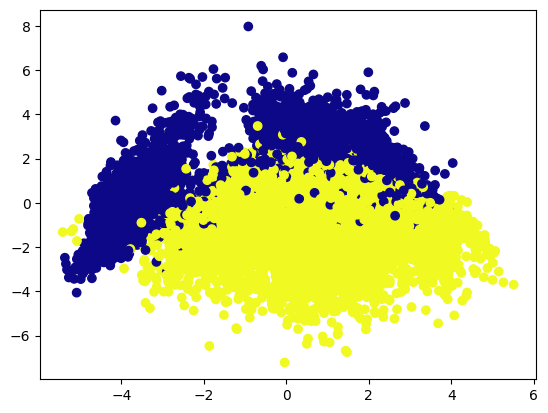

In [ ]:
# set the percentage of retrieved data.
pca = PCA(0.95)
# fit scaled data and transform it.
X_pca = pca.fit_transform(scaled_data)
model = Birch(threshold = 2.65, n_clusters = 2)
yhat = model.fit_predict(X_pca)
# scatter Plot of the 2 Principal Components with labels indicated by colors.
plt.scatter(X_pca[:,0], X_pca[:,1], c = yhat, cmap = 'plasma')
plt.show()

## **Mean Shift**

In [ ]:
def mean_shift_silhouette(data, model, max_iter_ranges):
  '''
  Visualize silhouette score of birch algorithm.
  Args:
  data-- dataframe that we want to deal with.
  model-- machine learning model object.
  max_iter_ranges-- tuple define model max iter ranges.
  Returns:
  Plot a visualization of silhouette values.
  '''
  silhouette_scores = []
  for iter_ in np.arange(*max_iter_ranges):
    #scaled_data = StandardScaler().fit_transform(data)
    mean_shift_model = model(n_jobs = -1, max_iter= iter_).fit(data)
    silhouette_scores.append(silhouette_score(data, mean_shift_model.labels_))
      
  plt.figure(figsize = (10, 10))
  plt.plot(np.arange(*max_iter_ranges), silhouette_scores, color = 'r', marker = '*', label = 'Silhouette')
  plt.xlabel('Max Iter')
  plt.legend()
  plt.show()

In [ ]:
# # visualize silhouette score of Mean Shift algorithm using different iters.
# mean_shift_silhouette(scaled_data, MeanShift, (300, 600, 100))

**Discussion Stage**
* There is no change in performance using **max iter** parameter.
* When I deal with the **max iter** parameter, I tried to tune it with the best ranges I can find.
* By making some changes in the preprocess transformation, we end up with **Number of labels is 1. Valid values are 2 to n_samples - 1**, so in this case I will take the **default max iter** parameter.

In [ ]:
# After training the model, We store the coordinates for the cluster centers
# scaler_data = StandardScaler().fit_transform(clean_data)
mean_shift_obj = MeanShift(n_jobs = -1)
mean_shift_model = mean_shift_obj.fit(scaled_data)

In [ ]:
print('Silhouette Score : ', silhouette_score(scaled_data, mean_shift_model.labels_))

**Discussion Stage**
* By making some changes in the preprocess transformation, we end up with **Number of labels is 1. Valid values are 2 to n_samples - 1**, so in this case I will take the **default max iter** parameter, so there is one cluster only in this case, and the there is no way to compute silhouette score.

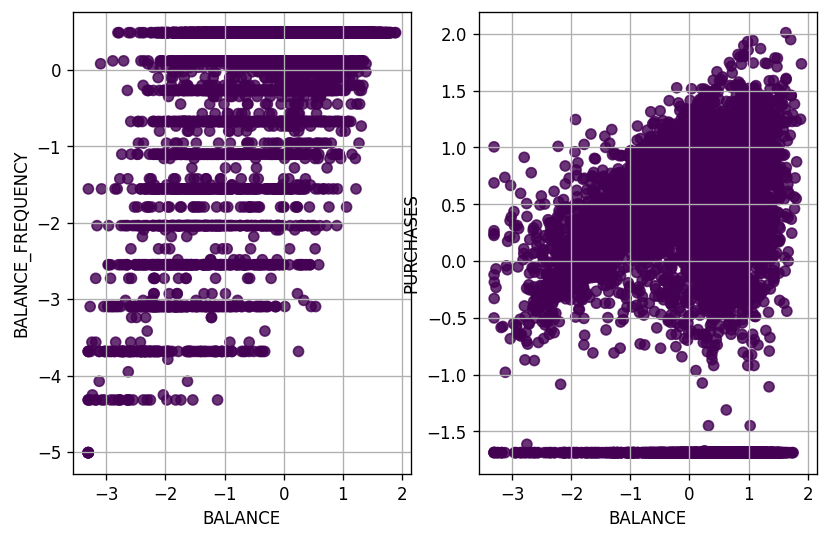

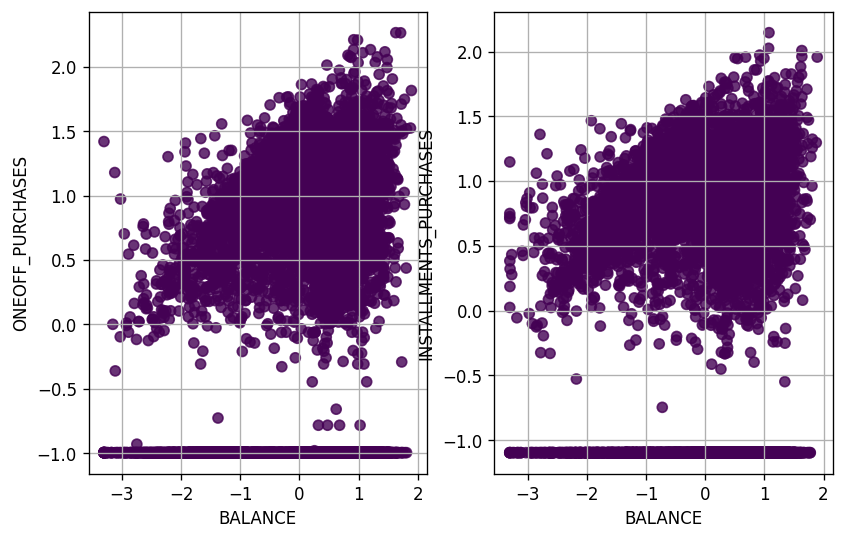

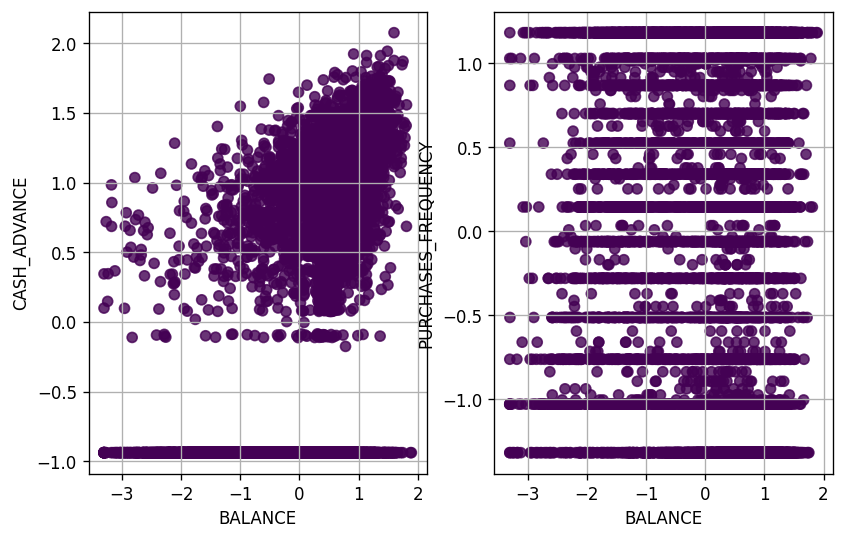

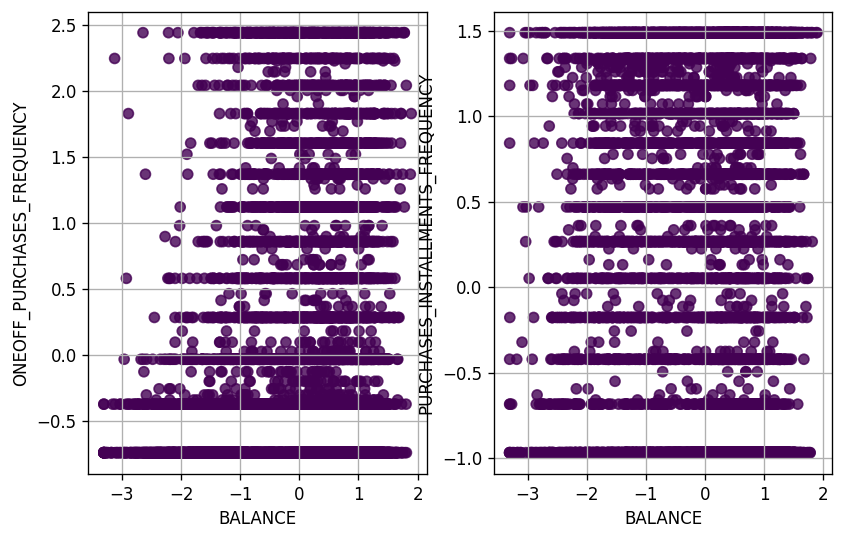

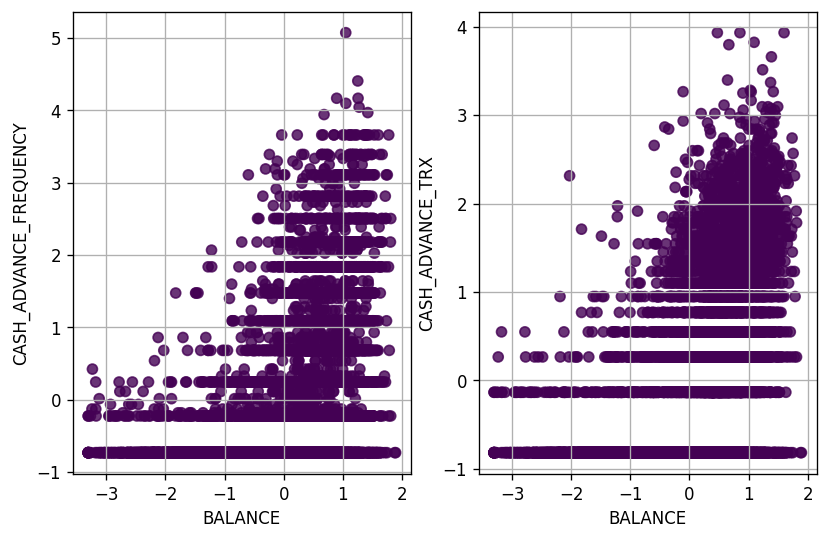

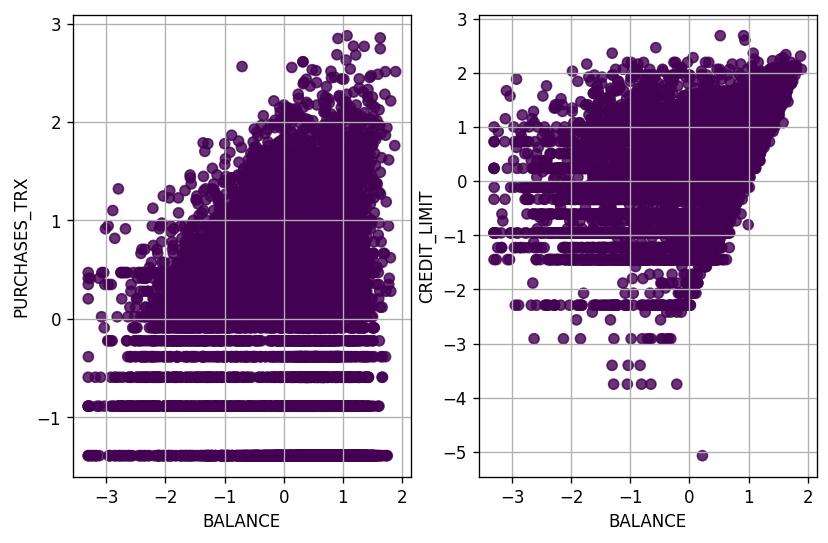

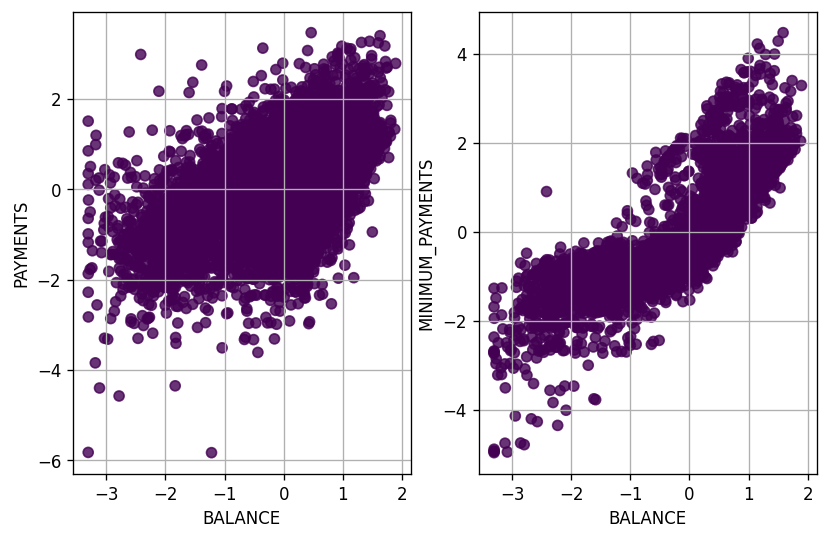

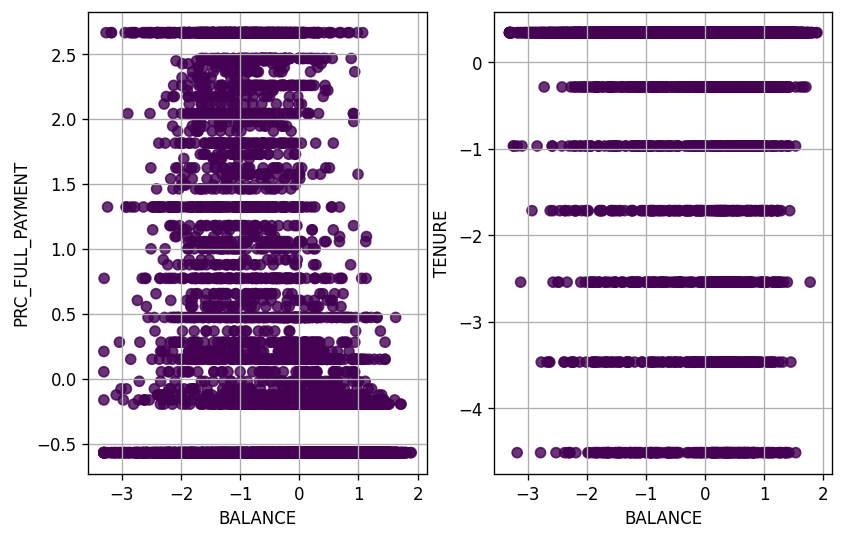

In [ ]:
plt.style.use('default')
i = 1
while i < len(clean_data.columns):
    try:
        fig = plt.figure(figsize = (8, 5), dpi = 120)
        plt.subplot(1,2,1)
        plt.scatter(clean_data['BALANCE'], clean_data[clean_data.columns[i]],
                    c = mean_shift_obj.labels_.astype(float), alpha = 0.8)
        plt.xlabel('BALANCE')
        plt.ylabel(clean_data.columns[i])
        plt.grid()
        i += 1
        plt.subplot(1,2,2)
        plt.scatter(clean_data['BALANCE'], clean_data[clean_data.columns[i]],
                    c = mean_shift_obj.labels_.astype(float), alpha = 0.8)
        plt.xlabel('BALANCE')
        plt.ylabel(clean_data.columns[i])
        plt.grid()
        i += 1
    except IndexError:
        break
plt.show()

**Discussion Stage**
* We can see that tha defualt parameter of the **Mean Shift** model works pretty good.

In [ ]:
# create cluster visualizarion of kmeans algorithms.
mean_shift_clusters= pd.concat([eda_cls_missed_df, pd.DataFrame({'cluster': mean_shift_model.labels_})], axis=1)
mean_shift_clusters.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,cluster
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.00,0,2,1000.0,201.802084,139.509787,0.000000,12,0
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.25,4,0,7000.0,4103.032597,1072.340217,0.222222,12,0
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.00,0,12,7500.0,622.066742,627.284787,0.000000,12,0
3,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.00,0,1,1200.0,678.334763,244.791237,0.000000,12,0
4,1809.828751,1.000000,1333.28,0.00,1333.28,0.000000,0.666667,0.000000,0.583333,0.00,0,8,1800.0,1400.057770,2407.246035,0.000000,12,0


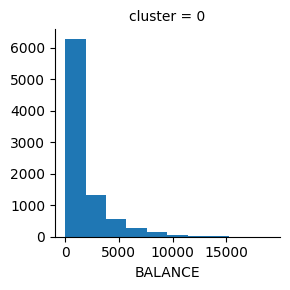

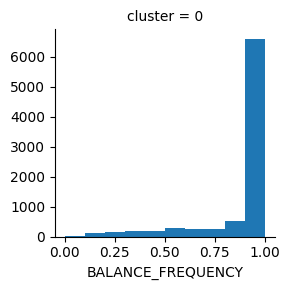

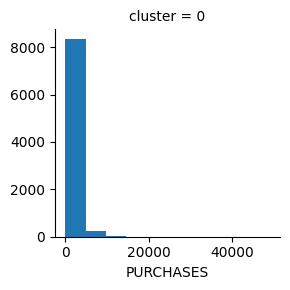

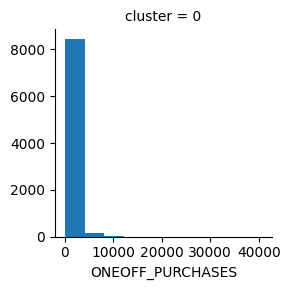

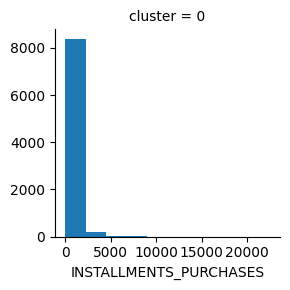

...

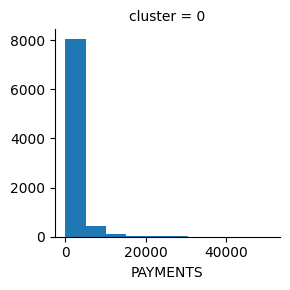

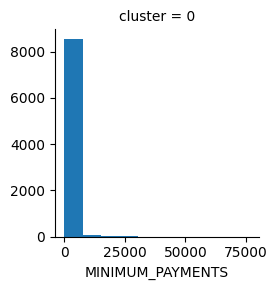

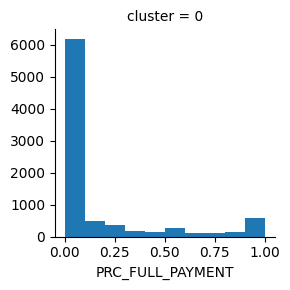

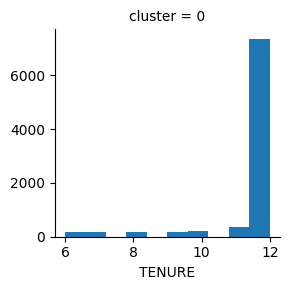

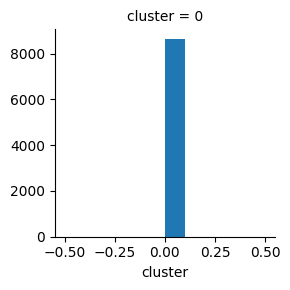

In [ ]:
# get interpretation insights of clusters.
for c in mean_shift_clusters:
    grid= sns.FacetGrid(mean_shift_clusters, col='cluster')
    grid.map(plt.hist, c)

**Discussion Stage**
* Here is some information about clusters distribution in different features, this will help us to decide the best choice.

**Interpretation of Clusters**

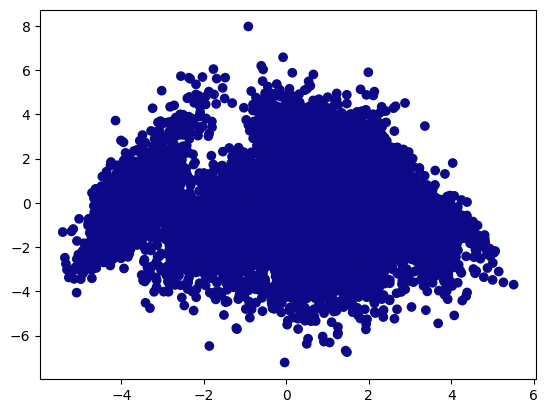

In [ ]:
# set the percentage of retrieved data.
pca = PCA(0.95)
# fit scaled data and transform it.
X_pca = pca.fit_transform(scaled_data)
# build and predict the new axes.
model = MeanShift(n_jobs = -1)
yhat = model.fit_predict(X_pca)
# scatter Plot of the 2 Principal Components with labels indicated by colors.
plt.scatter(X_pca[:,0], X_pca[:,1], c = yhat, cmap = 'plasma')
plt.show()

## **Affinity Propagation**

In [ ]:
def affinity_silhouette(data, model, max_iter_range):
  '''
  Visualize silhouette score of Affinity algorithm.
  Args:
  data-- dataframe that we want to deal with.
  model-- machine learning model object.
  max_iter_range-- tuple define max iter range.
  Returns:
  Plot a visualization of silhouette values.
  '''
  silhouette_scores = []
  for iter_ in np.arange(*max_iter_range):
    #scaled_data = StandardScaler().fit_transform(data)
    affinity_model = model(max_iter= iter_, random_state=42).fit(data)
    silhouette_scores.append(silhouette_score(data, affinity_model.labels_))

  plt.figure(figsize = (10, 10))
  plt.plot(np.arange(*max_iter_range), silhouette_scores, color = 'r', marker = '*', label = 'Silhouette')
  plt.xlabel('Max Iter')
  plt.legend()
  plt.show()

In [ ]:
# Compute Affinity Propagation
# scaled_obj = StandardScaler()
# scaled_data = scaled_obj.fit_transform(clean_data)
Affin_obj = AffinityPropagation(max_iter=200, random_state=42)
Affin_model = Affin_obj.fit(scaled_data)
cluster_centers_indices = Affin_model.cluster_centers_indices_
labels = Affin_model.labels_
  
n_clusters_ = len(cluster_centers_indices)
n_clusters_

232

In [ ]:
print('Silhouette Score : ', silhouette_score(scaled_data, labels))

Silhouette Score :  0.13207307905914836


In [ ]:
max(Affin_model.labels_)  

231

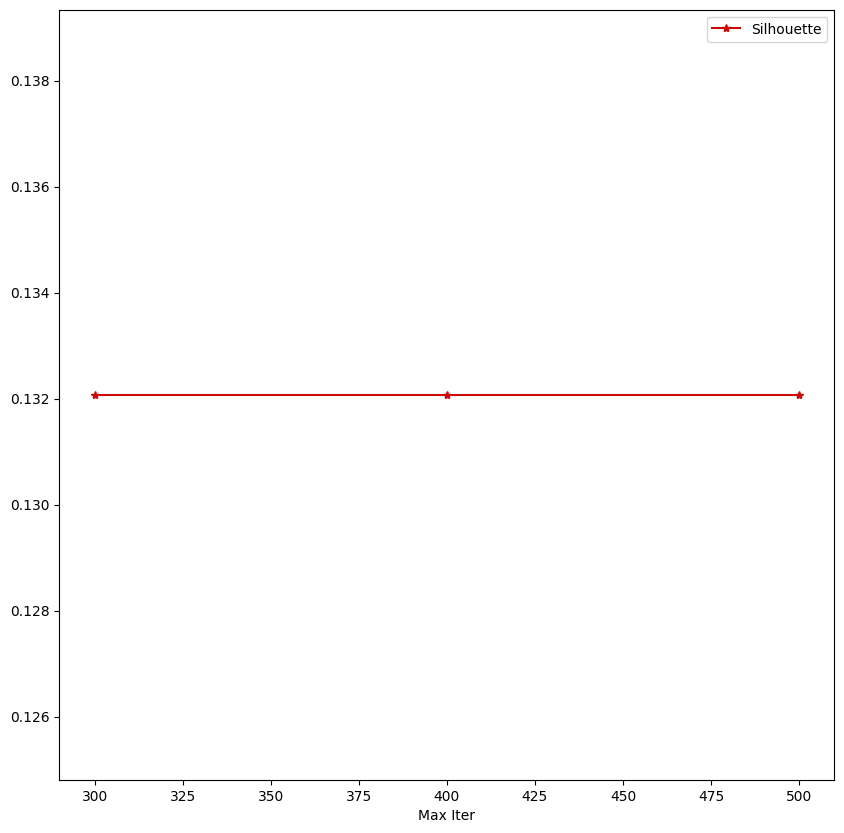

In [ ]:
# visualize silhouette score of Mean Shift algorithm using different iters.
affinity_silhouette(scaled_data, AffinityPropagation, (300, 600, 100))

**Discussion Stage**
* There is no change when I am dealing with different iters, so it's good to take the defaults.

**Interpretation of Clusters**

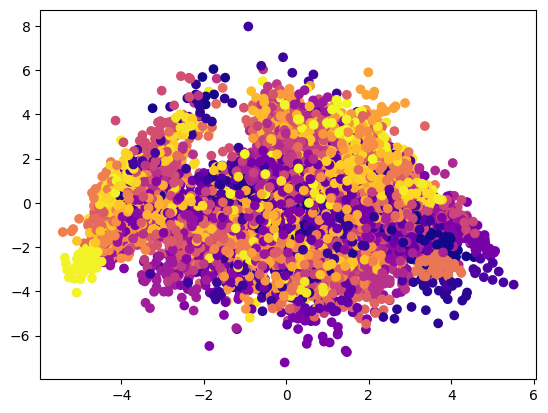

In [ ]:
# set the percentage of retrieved data.
pca = PCA(0.95)
# fit scaled data and transform it.
X_pca = pca.fit_transform(scaled_data)
# build and predict the new axes.
model = AffinityPropagation(random_state=42)
yhat = model.fit_predict(X_pca)
# scatter Plot of the 2 Principal Components with labels indicated by colors
plt.scatter(X_pca[:,0], X_pca[:,1], c = yhat, cmap = 'plasma')
plt.show()

**Discussion Stage**
* After dealing with it, I saw that **Affinity Propagation** are not good enough dealing with this data. it leads to **1 cluster** even for more iters than the default.

## **Spectral Clustering**

In [ ]:
def spectral_silhouette(data, model, k_ranges):
  '''
  Visualize silhouette score of spectral algorithm.
  Args:
  data-- dataframe that we want to deal with.
  model-- machine learning model object.
  k_ranges-- tuple define model k ranges.
  Returns:
  Plot a visualization of silhouette values.
  '''
  silhouette_scores = []
  for k in np.arange(*k_ranges):
    #scaled_data = StandardScaler().fit_transform(data)
    spectral_model = model(n_clusters=k, assign_labels='discretize', random_state=42).fit(data)
    silhouette_scores.append(silhouette_score(data, spectral_model.labels_))

  plt.figure(figsize = (10, 10))
  plt.plot(np.arange(*k_ranges), silhouette_scores, color = 'r', marker = '*', label = 'Silhouette')
  plt.xlabel('n_clusters')
  plt.legend()
  plt.show()

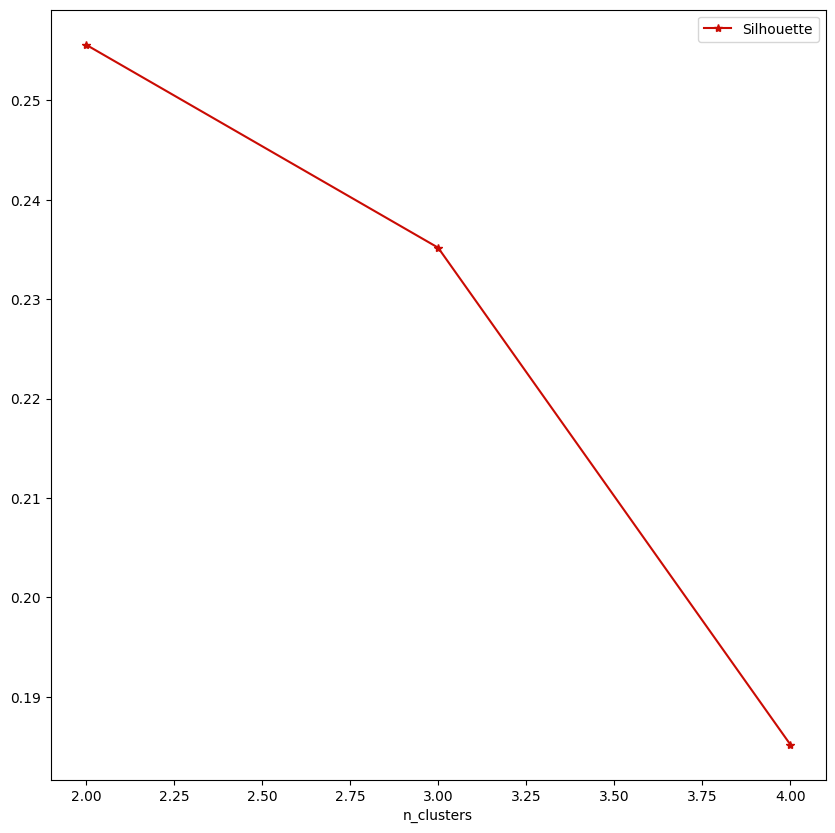

In [ ]:
# instantiate the clustering model and visualizer for a looping process
# scaled_data = StandardScaler().fit_transform(clean_data)
# visualize silhouette score of Mean Shift algorithm using different iters.
spectral_silhouette(scaled_data, SpectralClustering, (2, 5, 1))

**Discussion Stage**
* Based on silhouette score, **k= 2** is the best choice for the number of clusters.

In [ ]:
# scaled_obj = StandardScaler()
# scaled_data = scaled_obj.fit_transform(clean_data)
Spectral_obj = SpectralClustering(n_clusters=3, assign_labels='discretize')
Spectral_model = Spectral_obj.fit(scaled_data)
Spectral_model.labels_

array([0, 2, 0, ..., 0, 2, 1])

In [ ]:
print('Silhouette Score : ', silhouette_score(scaled_data, Spectral_model.labels_))

Silhouette Score :  0.23516953588438366


**visualizer step for Spectral Clustering take long time**

In [ ]:
# set the percentage of retrieved data.
pca = PCA(0.95)
# fit scaled data and transform it.
X_pca = pca.fit_transform(scaled_data)

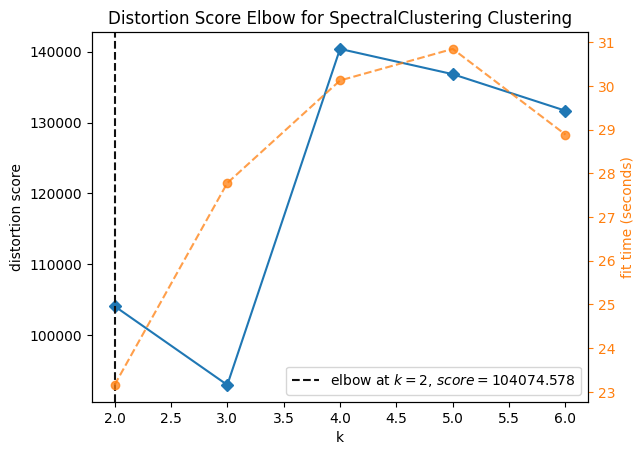

<AxesSubplot:title={'center':'Distortion Score Elbow for SpectralClustering Clustering'}, xlabel='k', ylabel='distortion score'>

In [ ]:
# create model object and feed it to the visualizer.
model = SpectralClustering(random_state=42)
visualizer = KElbowVisualizer(model, k=(2,7))

visualizer.fit(X_pca)        # Fit the data to the visualizer
visualizer.poof()        # Finalize and render the figure

**Interpretation of Clusters**

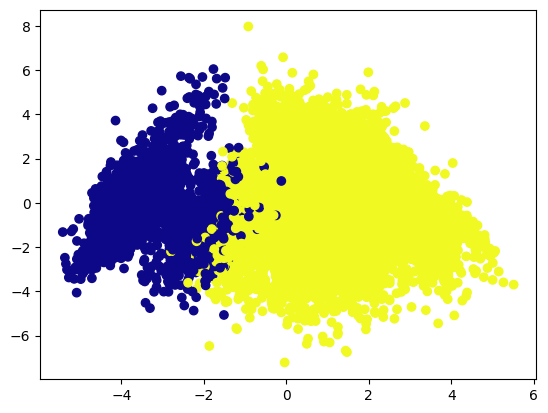

In [ ]:
# build and predict the new axes.
model = SpectralClustering(n_clusters= 2, random_state=42)
yhat = model.fit_predict(X_pca)
# scatter Plot of the 2 Principal Components with labels indicated by colors.
plt.scatter(X_pca[:,0], X_pca[:,1], c = yhat, cmap = 'plasma')
plt.show()

## Gaussian mixture

In [ ]:
def gaussian_silhouette(data, model, n_components_ranges):
  '''
  Visualize silhouette score of gaussian algorithm.
  Args:
  data-- dataframe that we want to deal with.
  model-- machine Learning model object.
  n_components_ranges-- tuple describe clusters ranges.
  Returns:
  Plot a visualization of silhouette values.
  '''
  silhouette_scores = []
  for n_component in np.arange(*n_components_ranges):
    #scaled_data = StandardScaler().fit_transform(data)
    gaussian_model = model(n_components = n_component, random_state=42).fit(data)
    silhouette_scores.append(silhouette_score(data, gaussian_model.predict(data)))
      
  plt.figure(figsize = (10, 10))
  plt.plot(np.arange(*n_components_ranges), silhouette_scores, color = 'r', marker = '*', label = 'Silhouette')
  plt.xlabel('number of components')
  plt.legend()
  plt.show()

In [ ]:
def SelBest(arr:list, X:int)->list:
    '''
    returns the set of X configurations with shorter distance
    '''
    dx=np.argsort(arr)[:X]
    return arr[dx]

**Silhouette score**

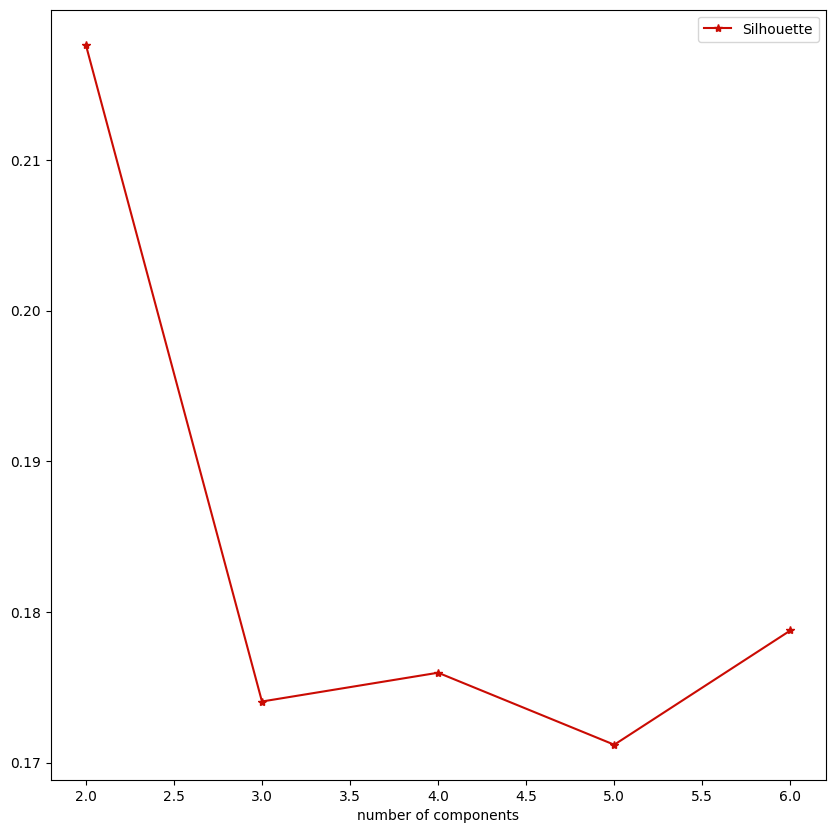

In [ ]:
# visualize gaussian silhouetette
gaussian_silhouette(scaled_data, GaussianMixture, (2, 7, 1))

**Discussion Stage**
* Based on the silhouette score elbow graph of each cluster, we can notice that **n_components = 2** is the best choice.

**Distance between GMMs**

**Train - Test distance check**

In [ ]:
def gmm_js(gmm_p, gmm_q, n_samples=10**5):
    X = gmm_p.sample(n_samples)[0]
    log_p_X = gmm_p.score_samples(X)
    log_q_X = gmm_q.score_samples(X)
    log_mix_X = np.logaddexp(log_p_X, log_q_X)

    Y = gmm_q.sample(n_samples)[0]
    log_p_Y = gmm_p.score_samples(Y)
    log_q_Y = gmm_q.score_samples(Y)
    log_mix_Y = np.logaddexp(log_p_Y, log_q_Y)

    return np.sqrt((log_p_X.mean() - (log_mix_X.mean() - np.log(2))
            + log_q_Y.mean() - (log_mix_Y.mean() - np.log(2))) / 2)

In [ ]:
n_clusters=np.arange(2, 7)
iterations= 5
results=[]
res_sigs=[]
for n in n_clusters:
    dist=[]
    
    for iteration in range(iterations):
        train, test= train_test_split(scaled_data, test_size=0.5, random_state=42)
        
        gmm_train= GaussianMixture(n, n_init=2, random_state=42).fit(train) 
        gmm_test= GaussianMixture(n, n_init=2, random_state=42).fit(test) 
        dist.append(gmm_js(gmm_train, gmm_test))
    selec=SelBest(np.array(dist), int(iterations/5))
    result=np.mean(selec)
    res_sig=np.std(selec)
    results.append(result)
    res_sigs.append(res_sig)

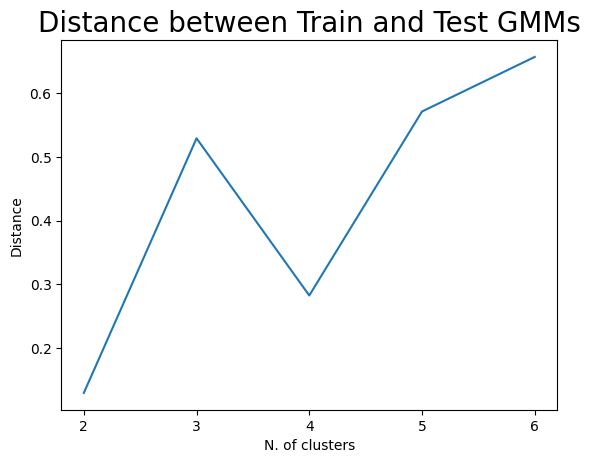

In [ ]:
plt.errorbar(n_clusters, results, yerr=res_sigs)
plt.title("Distance between Train and Test GMMs", fontsize=20)
plt.xticks(n_clusters)
plt.xlabel("N. of clusters")
plt.ylabel("Distance")
plt.show()

**Discussion Stage**
* Here we can see that **2** or **4** is the best stable choice of **N. of clusters** using **GMM**.

**Bayesian information criterion (BIC)**

In [ ]:
n_clusters=np.arange(2, 7)
bics=[]
bics_err=[]
iterations=5
for n in n_clusters:
    tmp_bic=[]
    for _ in range(iterations):
        gmm= GaussianMixture(n, n_init=2, random_state=42).fit(scaled_data) 
        
        tmp_bic.append(gmm.bic(scaled_data))
    val=np.mean(SelBest(np.array(tmp_bic), int(iterations/5)))
    err=np.std(tmp_bic)
    bics.append(val)
    bics_err.append(err)

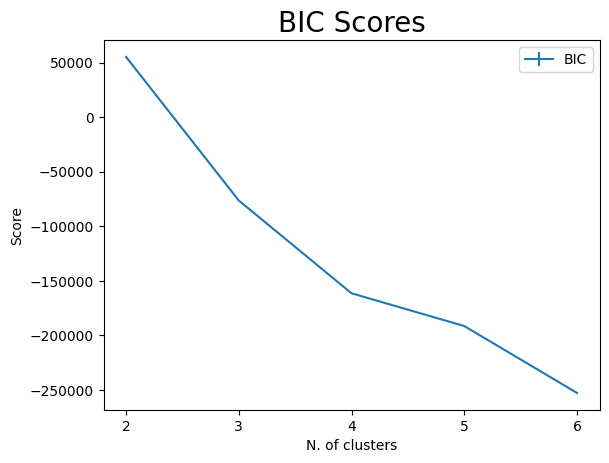

In [ ]:
plt.errorbar(n_clusters,bics, yerr=bics_err, label='BIC')
plt.title("BIC Scores", fontsize=20)
plt.xticks(n_clusters)
plt.xlabel("N. of clusters")
plt.ylabel("Score")
plt.legend()

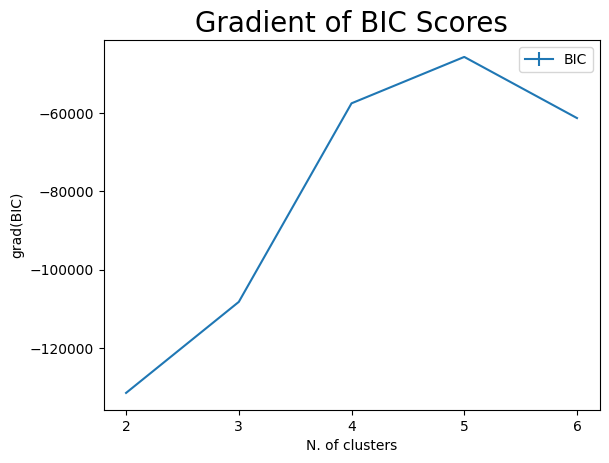

In [ ]:
plt.errorbar(n_clusters, np.gradient(bics), yerr=bics_err, label='BIC')
plt.title("Gradient of BIC Scores", fontsize=20)
plt.xticks(n_clusters)
plt.xlabel("N. of clusters")
plt.ylabel("grad(BIC)")
plt.legend()

**Discussion Stage**
* From Bayesian information criterion (BIC) I can see that **N. of clusters of 5** is the best choice.

In [ ]:
# reducing the dimensions of the data 
pca = PCA(n_components = 2) 
X_principal = pca.fit_transform(scaled_data) 
X_principal = pd.DataFrame(X_principal) 
X_principal.columns = ['P1', 'P2'] 
  
X_principal.head(2)

,P1,P2
0,-0.230727,2.937857
1,-3.519006,-0.990269


In [ ]:
# create gaussian object.
gm_model = GaussianMixture(n_components = 5, random_state=42).fit_predict(X_principal)

**Discussion Stage**
* Even the results indicate that k = 2 or 3 is the best choice, but after I checked some number of clusters I saw that k = 5 is also reasonable so I kept it for more analysis about this case.

**Interpretation of Clusters**

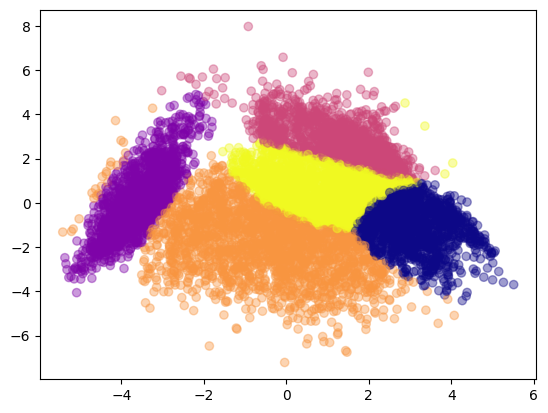

In [ ]:
# visualizing the clusters.
plt.scatter(X_principal['P1'], X_principal['P2'], c = gm_model, cmap = 'plasma', alpha = 0.4) 
plt.show()

## PCA

In [ ]:
# retrieve cosine simularity.
dist = 1 - cosine_similarity(scaled_data)
# select principal components axes.
pca = PCA(2)
# fit and transform it.
pca.fit(dist)
X_PCA = pca.transform(dist)
# check pca shape.
X_PCA.shape

(8636, 2)

In [ ]:
# select kmeans as an algorithm based labels.
kmeans_obj_pca = KMeans(init = 'k-means++', n_clusters=3, n_init =  'auto', random_state=42)
kmeans_pred_pca = kmeans_obj_pca.fit_predict(scaled_data)
# get algorithm labels depends on best number of clusters.
labels_pca = kmeans_obj_pca.labels_

**Interpretation of Clusters**

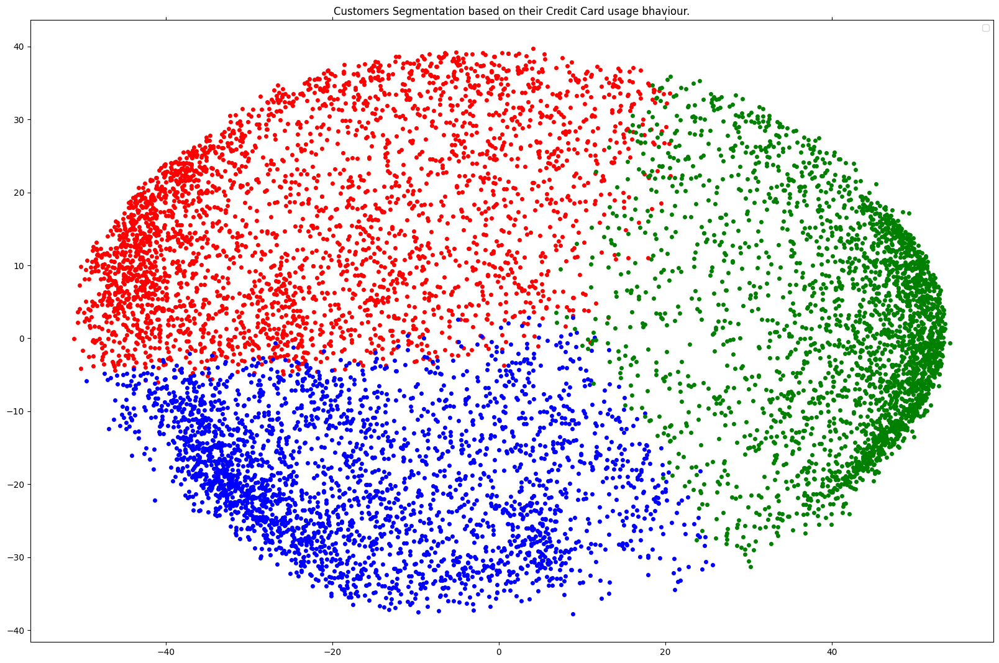

In [ ]:
# retriece pca selected axes.
x, y = X_PCA[:, 0], X_PCA[:, 1]

# select clusters colors.
colors = {0: 'red',
          1: 'blue',
          2: 'green'}

# create data frame grouped by the number of clusters.
df = pd.DataFrame({'x': x, 'y':y, 'label':labels_pca}) 
groups = df.groupby('label')

# plot the final results of pca using kmeans algorithm to detect best number of labels.
fig, ax = plt.subplots(figsize=(20, 13)) 

for name, group in groups:
    ax.plot(group.x, group.y, marker='o', linestyle='', ms=5,
            color=colors[name], mec='none')
    ax.set_aspect('auto')
    ax.tick_params(axis='x',which='both',bottom='off',top='off',labelbottom='off')
    ax.tick_params(axis= 'y',which='both',left='off',top='off',labelleft='off')
    
ax.legend()
ax.set_title("Customers Segmentation based on their Credit Card usage bhaviour.")
plt.show()

**Discussion Stage**
* We can improve the performance by dealing with correlation with features, and drop high correlation feature, also deal with outliers using Rubost scaler, take better decision using a deferent k cluster, and etc.